In [1]:
from AL_methods import *
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
df = pd.read_csv("/content/drive/MyDrive/Event 3.CSV", skiprows=[0,1,2,4])

df

,Time,C_W738_W737_2_W737_A,C_W738_W737_2_W737_B,C_W738_W737_2_W737_C,C_W738_W737_2_W737_N,V_W738_AN,V_W738_BN,V_W738_CN,C_W747_W748_2_W747_A,C_W747_W748_2_W747_B,...,V_SOURCE-A_AN,V_SOURCE-A_BN,V_SOURCE-A_CN,C_SOURCE~BL_SOURCE~B_1_SOURCE~BL_A,C_SOURCE~BL_SOURCE~B_1_SOURCE~BL_B,C_SOURCE~BL_SOURCE~B_1_SOURCE~BL_C,C_SOURCE~BL_SOURCE~B_1_SOURCE~BL_N,V_SOURCE-BL_AN,V_SOURCE-BL_BN,V_SOURCE-BL_CN
0,0,0.003031,0.002269,0.004097,0.000035,0.148158,0.127625,0.075987,-0.000688,-0.001872,...,0.927593,-0.106241,-0.719288,0.002209,-0.000666,0.001731,0.000053,-0.849463,-0.489021,1.002713
1,208,0.003031,0.002269,0.004097,0.000035,0.148158,0.127625,0.075987,-0.000688,-0.001872,...,76764.710000,-33655.380000,-41529.950000,230.466800,-108.023300,-128.021700,3.067799,76763.670000,-33653.960000,-41528.730000
2,417,0.741168,-0.038834,-0.723139,0.013515,195.290700,8.624437,-201.431300,0.766701,-0.031323,...,90973.690000,-35219.570000,-55234.260000,264.724700,-111.345300,-162.266000,5.679017,90973.330000,-35219.300000,-55233.990000
3,625,20.517100,-0.388209,-20.763680,0.259933,4755.236000,236.268200,-4979.199000,22.056820,-0.031323,...,91933.620000,-29716.710000,-62277.850000,263.986100,-95.315260,-177.941700,6.235758,91937.130000,-29718.480000,-62277.330000
4,833,68.178220,3.105537,-72.563640,0.436058,10822.790000,1045.943000,-11863.060000,76.570950,4.366782,...,90468.290000,-22872.280000,-67844.650000,255.996100,-75.519380,-189.109500,5.962640,90703.850000,-22982.480000,-67966.420000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96000,19999872,247.012500,-89.386230,-157.629400,0.012401,10429.910000,-1464.156000,-8966.027000,228.199100,-64.530320,...,94497.950000,-51659.870000,-42921.650000,47.718500,12.865550,-60.975130,0.301113,94397.350000,-51745.350000,-42729.230000
96001,20000080,243.004000,-70.735800,-172.184600,-0.008877,10058.620000,-586.506400,-9473.689000,222.925800,-46.564850,...,94606.490000,-45290.330000,-49400.050000,43.495950,18.164960,-61.813710,0.133251,94517.820000,-45386.680000,-49210.770000
96002,20000289,237.498700,-51.653780,-185.659200,-0.029931,9625.164000,295.037800,-9922.456000,216.284900,-28.334310,...,94131.620000,-38641.790000,-55577.620000,38.997370,23.363290,-62.275160,-0.035662,94054.940000,-38750.910000,-55384.790000
96003,20000497,230.527400,-32.263500,-197.991000,-0.050652,9132.127000,1174.104000,-10309.410000,208.315900,-9.946695,...,93073.320000,-31752.830000,-61408.790000,34.252600,28.438600,-62.363890,-0.204365,93011.890000,-31873.410000,-61218.760000


In [4]:
column_list = df.columns

In [5]:
# remove first 0.25 seconds to allow system to stabilise before using data
data = preprocess(df, time=0.25e6)
data

,C_W738_W737_2_W737_A,C_W738_W737_2_W737_B,C_W738_W737_2_W737_C,C_W738_W737_2_W737_N,V_W738_AN,V_W738_BN,V_W738_CN,C_W747_W748_2_W747_A,C_W747_W748_2_W747_B,C_W747_W748_2_W747_C,...,V_SOURCE-A_AN,V_SOURCE-A_BN,V_SOURCE-A_CN,C_SOURCE~BL_SOURCE~B_1_SOURCE~BL_A,C_SOURCE~BL_SOURCE~B_1_SOURCE~BL_B,C_SOURCE~BL_SOURCE~B_1_SOURCE~BL_C,C_SOURCE~BL_SOURCE~B_1_SOURCE~BL_N,V_SOURCE-BL_AN,V_SOURCE-BL_BN,V_SOURCE-BL_CN
1201,241.3022,-55.414700,-185.7423,-0.031491,9811.672,161.2130,-9973.563,177.0300,-24.584140,-152.3924,...,94436.90,-41221.06,-53301.67,29.686870,31.72985,-61.42770,0.040601,94378.32,-41303.81,-53155.28
1202,234.4642,-35.767520,-198.4378,-0.051209,9321.225,1055.1480,-10377.550,170.6253,-9.544190,-161.0045,...,93599.08,-34412.25,-59272.62,24.733210,36.21194,-60.71335,-0.129573,93550.85,-34502.96,-59131.19
1203,226.1806,-15.904550,-209.8969,-0.070593,8773.790,1942.0030,-10716.800,163.1777,5.535029,-168.6217,...,92184.62,-27389.72,-64878.93,19.630350,40.47431,-59.63074,-0.299116,92146.37,-27489.85,-64740.44
1204,216.5028,4.040627,-220.0678,-0.089419,8172.820,2816.1130,-10989.860,154.7167,20.574980,-175.1953,...,90203.71,-20200.99,-70084.14,14.408110,44.49500,-58.18873,-0.466768,90174.39,-20305.77,-69947.55
1205,205.5025,23.954970,-228.8674,-0.107800,7521.338,3672.8740,-11194.780,145.3113,35.477490,-180.6766,...,87663.12,-12890.56,-74857.86,9.088895,48.25644,-56.40065,-0.631690,87644.43,-13000.82,-74725.90
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96000,247.0125,-89.386230,-157.6294,0.012401,10429.910,-1464.1560,-8966.027,228.1991,-64.530320,-163.5695,...,94497.95,-51659.87,-42921.65,47.718500,12.86555,-60.97513,0.301113,94397.35,-51745.35,-42729.23
96001,243.0040,-70.735800,-172.1846,-0.008877,10058.620,-586.5064,-9473.689,222.9258,-46.564850,-176.2291,...,94606.49,-45290.33,-49400.05,43.495950,18.16496,-61.81371,0.133251,94517.82,-45386.68,-49210.77
96002,237.4987,-51.653780,-185.6592,-0.029931,9625.164,295.0378,-9922.456,216.2849,-28.334310,-187.7866,...,94131.62,-38641.79,-55577.62,38.997370,23.36329,-62.27516,-0.035662,94054.94,-38750.91,-55384.79
96003,230.5274,-32.263500,-197.9910,-0.050652,9132.127,1174.1040,-10309.410,208.3159,-9.946695,-198.1834,...,93073.32,-31752.83,-61408.79,34.252600,28.43860,-62.36389,-0.204365,93011.89,-31873.41,-61218.76


In [6]:
corr_training = data.corr()
corr_training

,C_W738_W737_2_W737_A,C_W738_W737_2_W737_B,C_W738_W737_2_W737_C,C_W738_W737_2_W737_N,V_W738_AN,V_W738_BN,V_W738_CN,C_W747_W748_2_W747_A,C_W747_W748_2_W747_B,C_W747_W748_2_W747_C,...,V_SOURCE-A_AN,V_SOURCE-A_BN,V_SOURCE-A_CN,C_SOURCE~BL_SOURCE~B_1_SOURCE~BL_A,C_SOURCE~BL_SOURCE~B_1_SOURCE~BL_B,C_SOURCE~BL_SOURCE~B_1_SOURCE~BL_C,C_SOURCE~BL_SOURCE~B_1_SOURCE~BL_N,V_SOURCE-BL_AN,V_SOURCE-BL_BN,V_SOURCE-BL_CN
C_W738_W737_2_W737_A,1.000000,-0.507788,-0.499113,0.206560,0.967336,-0.293186,-0.678427,0.967894,-0.411493,-0.561721,...,0.968875,-0.670116,-0.300247,0.832535,-0.074845,-0.858582,0.293491,0.968457,-0.671602,-0.298322
C_W738_W737_2_W737_B,-0.507788,1.000000,-0.493059,-0.883942,-0.682357,0.965692,-0.279662,-0.568282,0.967493,-0.398288,...,-0.307745,0.970479,-0.662196,-0.868799,0.879326,0.032853,-0.965621,-0.305856,0.970075,-0.663710
C_W738_W737_2_W737_C,-0.499113,-0.493059,1.000000,0.679802,-0.290503,-0.675328,0.966455,-0.405809,-0.557690,0.967942,...,-0.668889,-0.299486,0.969336,0.033177,-0.808957,0.834034,0.674948,-0.670366,-0.297579,0.968915
C_W738_W737_2_W737_N,0.206560,-0.883942,0.679802,1.000000,0.402718,-0.921241,0.516042,0.287105,-0.894017,0.607410,...,0.008946,-0.804299,0.795271,0.641919,-0.912799,0.259552,0.921013,0.007053,-0.803357,0.796246
V_W738_AN,0.967336,-0.682357,-0.290503,0.402718,1.000000,-0.501653,-0.502940,0.978666,-0.607628,-0.375839,...,0.903658,-0.822941,-0.082122,0.937813,-0.298018,-0.736706,0.501407,0.902798,-0.824100,-0.080077
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C_SOURCE~BL_SOURCE~B_1_SOURCE~BL_C,-0.858582,0.032853,0.834034,0.259552,-0.736706,-0.199561,0.939160,-0.805616,-0.079910,0.891233,...,-0.945686,0.230373,0.716729,-0.491938,-0.413030,1.000000,0.200619,-0.946311,0.232392,0.715327
C_SOURCE~BL_SOURCE~B_1_SOURCE~BL_N,0.293491,-0.965621,0.674948,0.921013,0.501407,-0.999830,0.495475,0.375155,-0.977857,0.603114,...,0.082762,-0.904060,0.821096,0.742970,-0.964265,0.200619,1.000000,0.080754,-0.903190,0.822264
V_SOURCE-BL_AN,0.968457,-0.305856,-0.670366,0.007053,0.902798,-0.081055,-0.825568,0.941247,-0.215445,-0.731535,...,0.999998,-0.498946,-0.502572,0.710370,0.134783,-0.946311,0.080754,1.000000,-0.500707,-0.500796
V_SOURCE-BL_BN,-0.671602,0.970075,-0.297579,-0.803357,-0.824100,0.903250,-0.074942,-0.731706,0.942736,-0.208917,...,-0.502454,0.999998,-0.496716,-0.951488,0.780523,0.232392,-0.903190,-0.500707,1.000000,-0.498496


In [7]:
# window = 350
# w = 1

# cov_fn = covariance_pair
# thresholds_cov, cov_multi_list = get_threshold_stat_only(data, cov_fn, cols,
#               window=window, w=w, adj_list=adj_list, quantile=1, axis=1, stat_list=None, plot=True, collate_fn="sum")
# thresholds_cov_99, cov_multi_list = get_threshold_stat_only(data, cov_fn, cols,
#               window=window, w=w, adj_list=adj_list, quantile=0.99, axis=1, stat_list=cov_multi_list, collate_fn="sum")
# thresholds_cov_95, cov_multi_list = get_threshold_stat_only(data, cov_fn, cols,
#               window=window, w=w, adj_list=adj_list, quantile=0.95, axis=1, stat_list=cov_multi_list, collate_fn="sum")

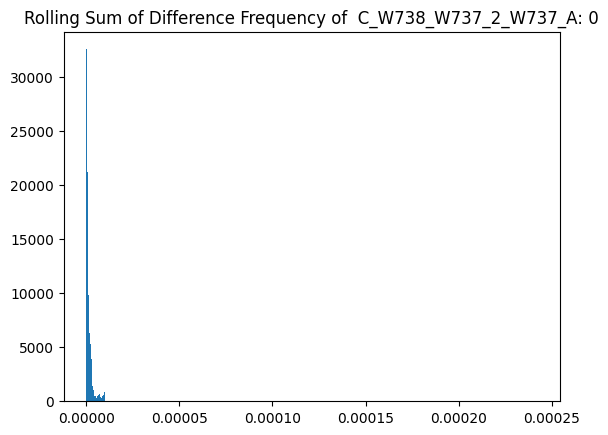

******************************************************************************


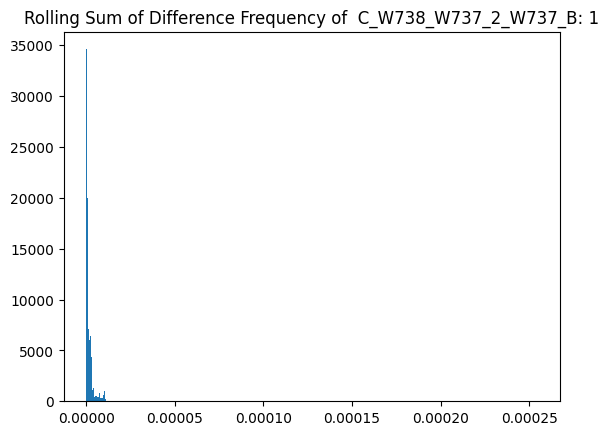

******************************************************************************


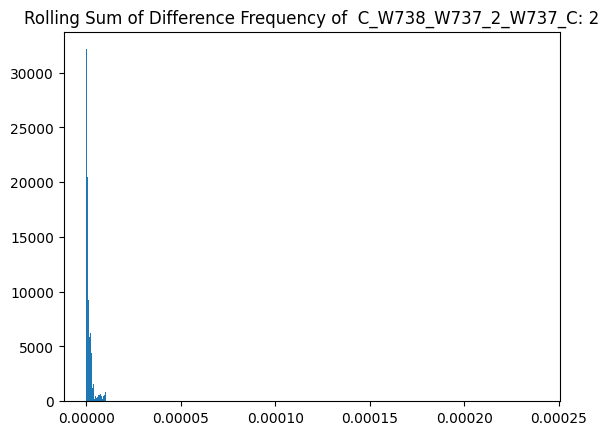

******************************************************************************


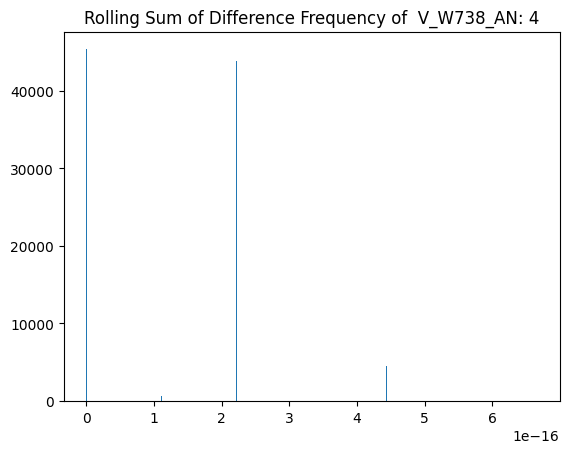

******************************************************************************


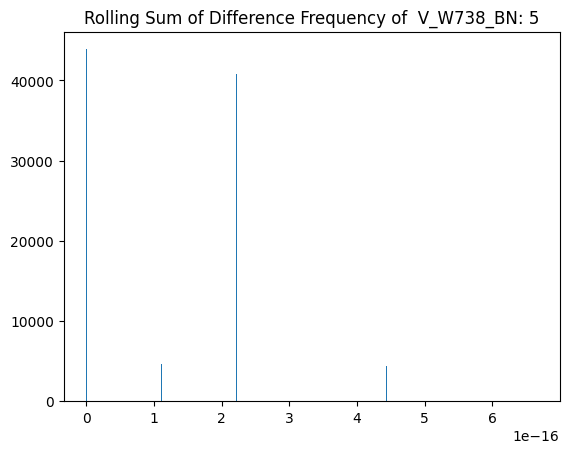

******************************************************************************


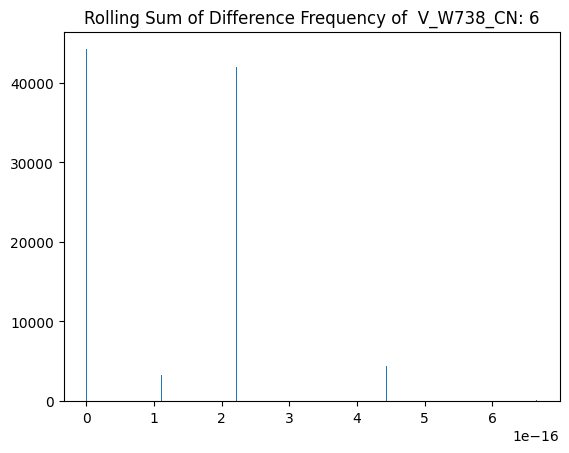

******************************************************************************


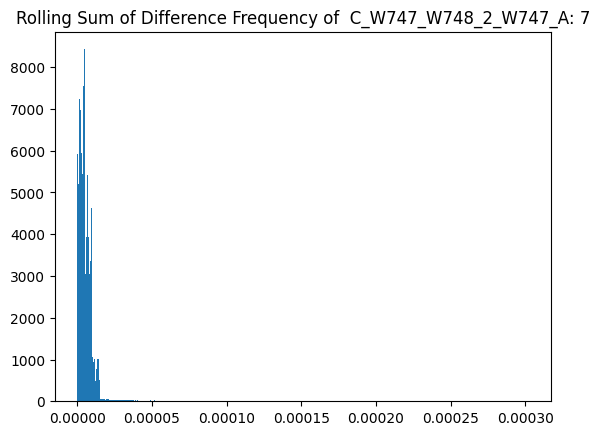

******************************************************************************


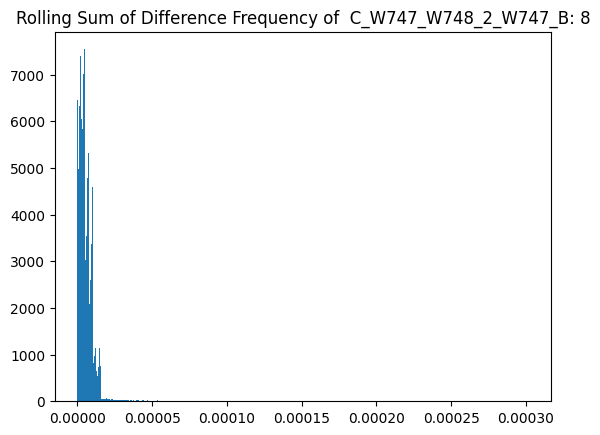

******************************************************************************


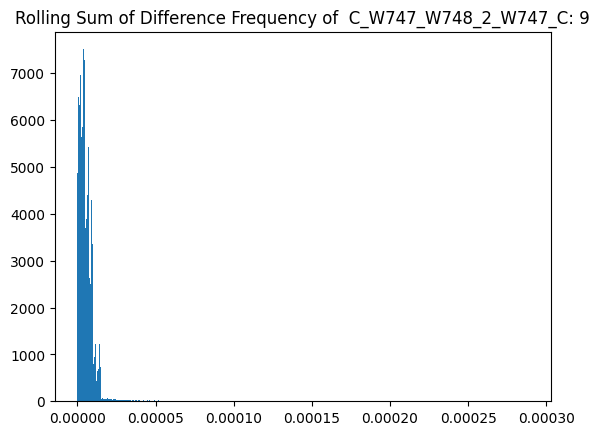

******************************************************************************


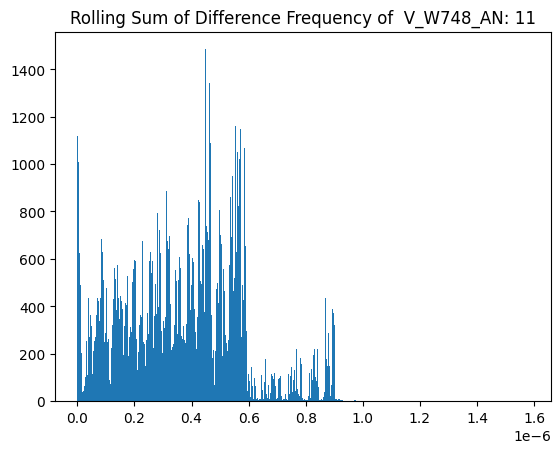

******************************************************************************


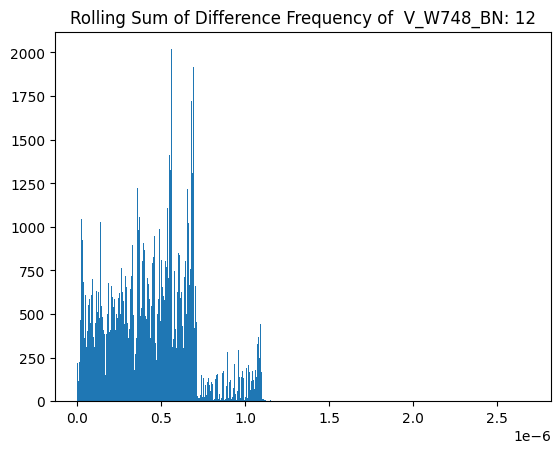

******************************************************************************


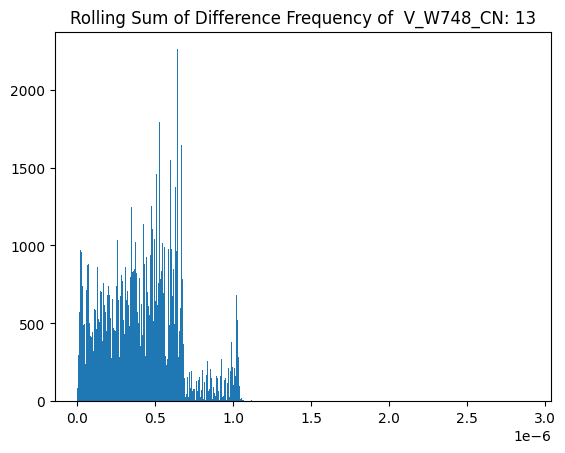

******************************************************************************


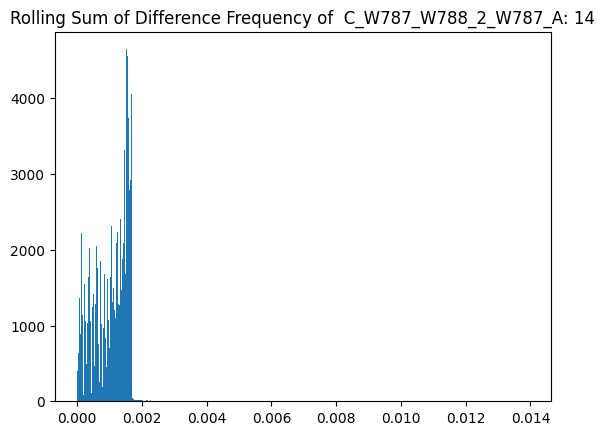

******************************************************************************


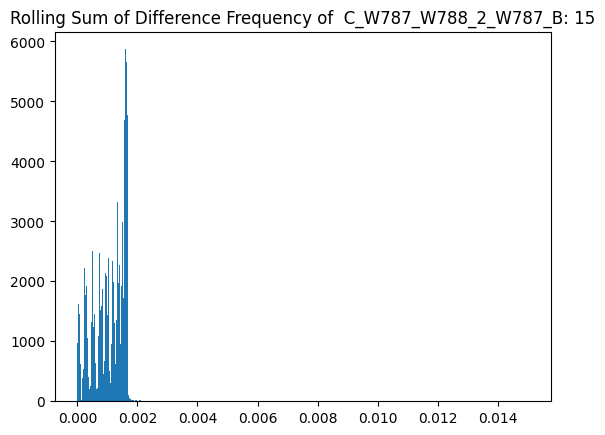

******************************************************************************


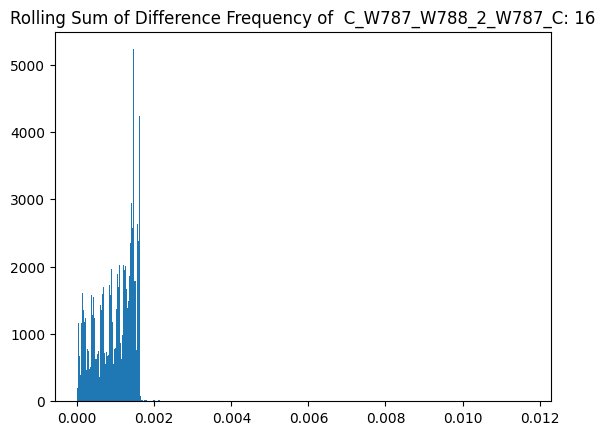

******************************************************************************


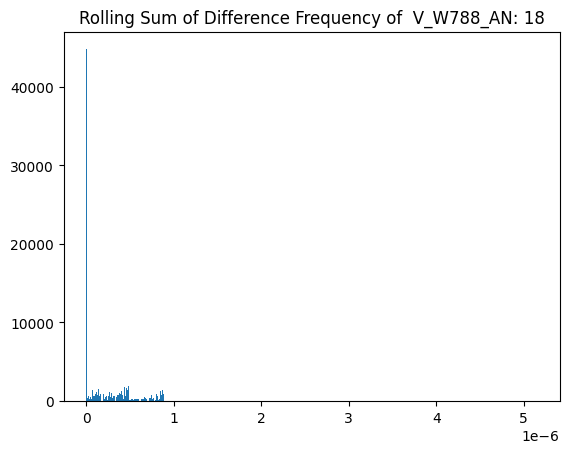

******************************************************************************


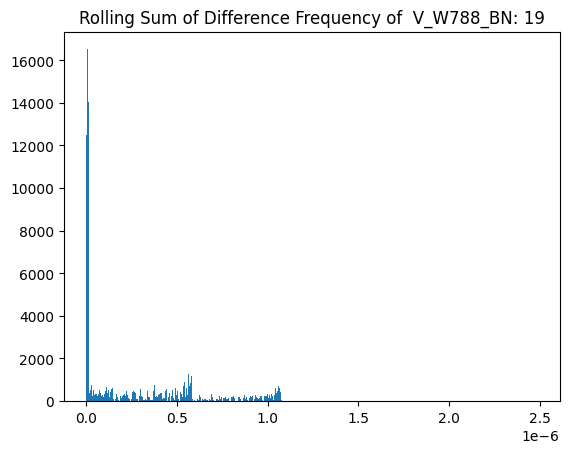

******************************************************************************


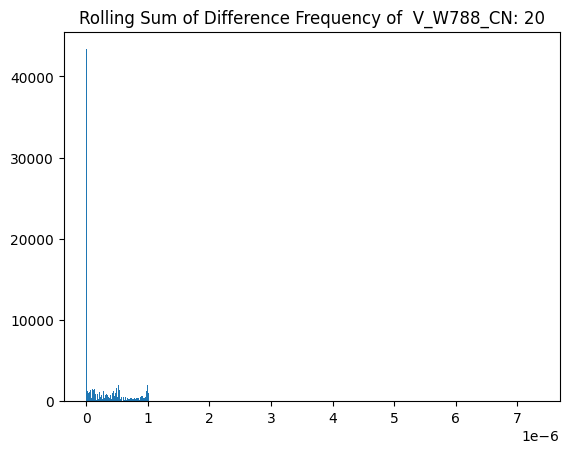

******************************************************************************


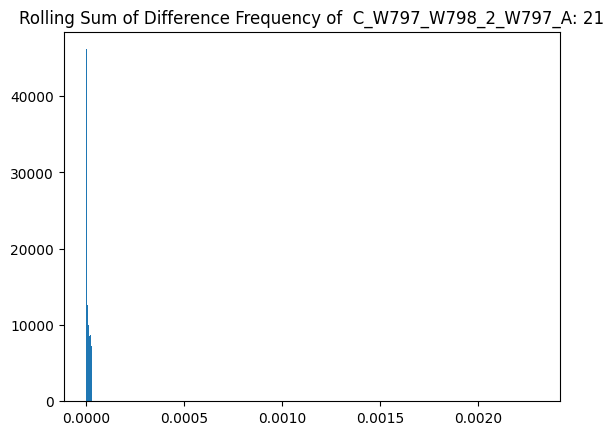

******************************************************************************


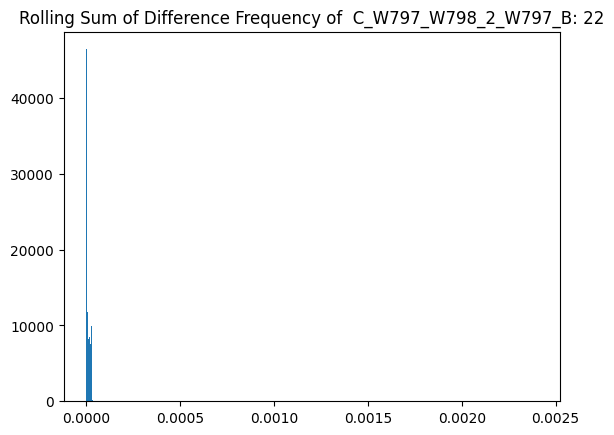

******************************************************************************


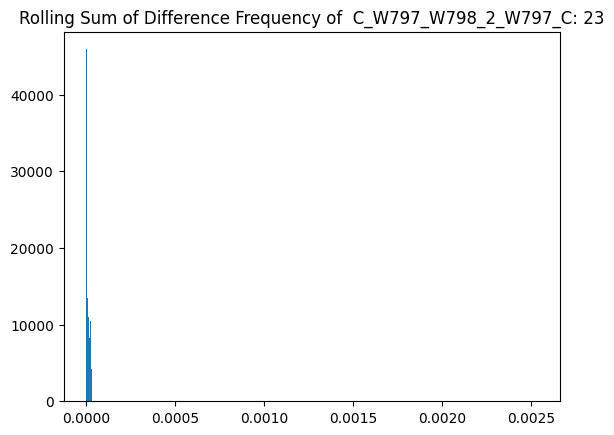

******************************************************************************


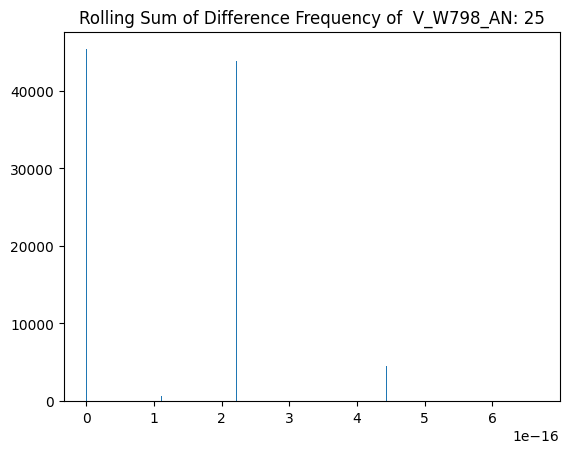

******************************************************************************


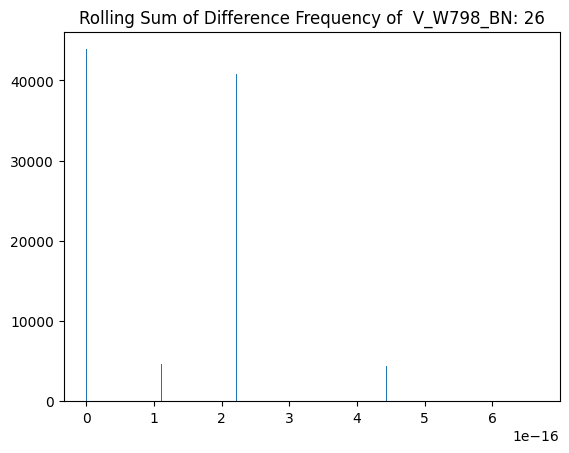

******************************************************************************


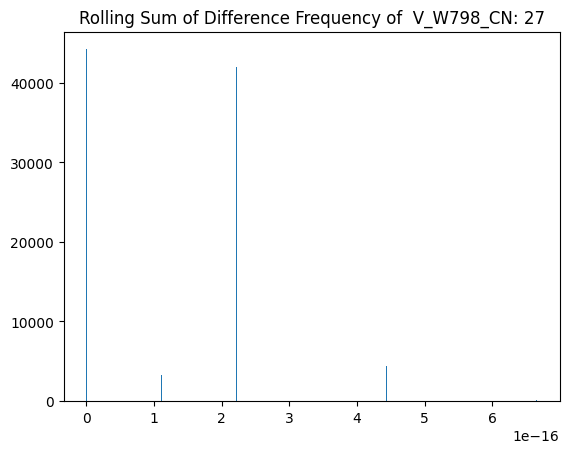

******************************************************************************


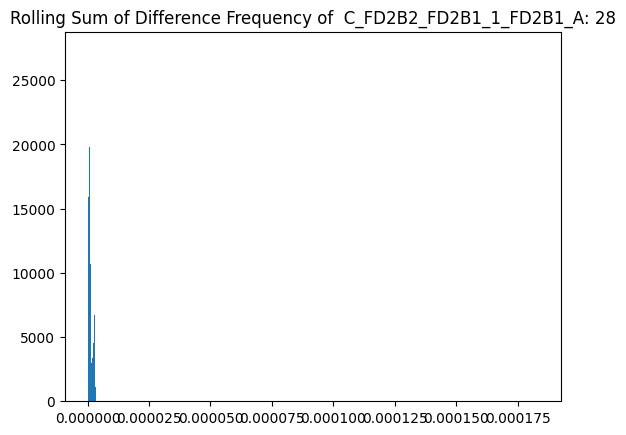

******************************************************************************


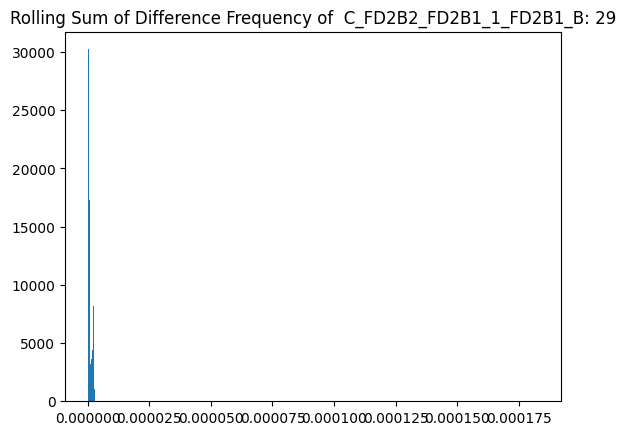

******************************************************************************


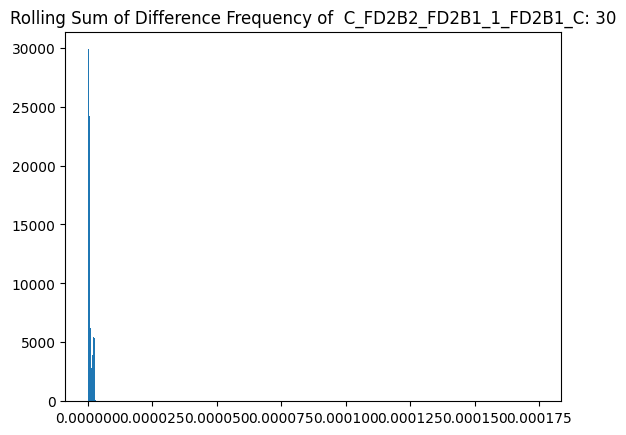

******************************************************************************


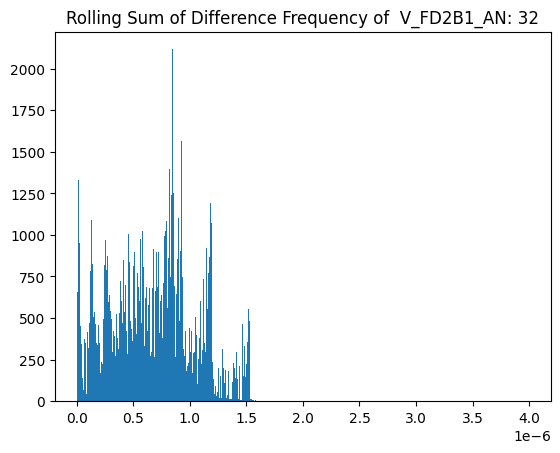

******************************************************************************


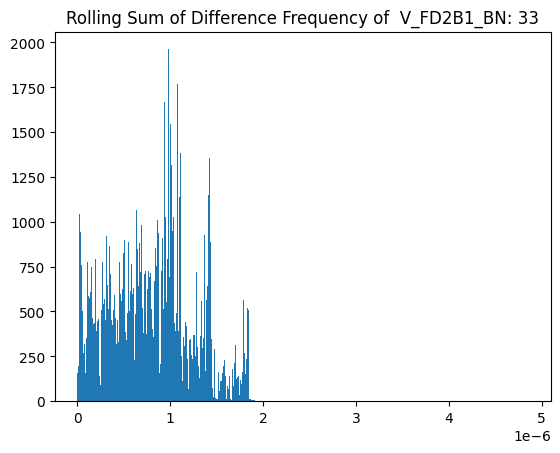

******************************************************************************


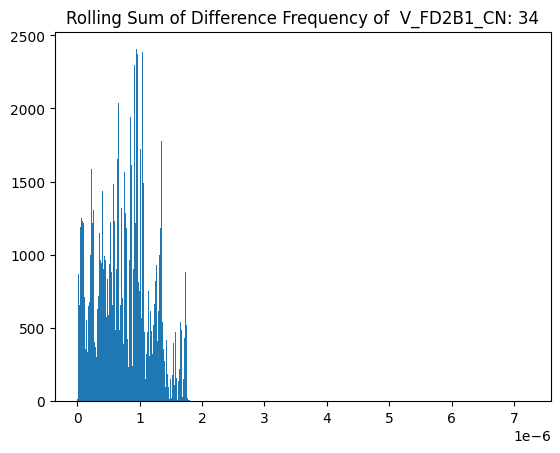

******************************************************************************


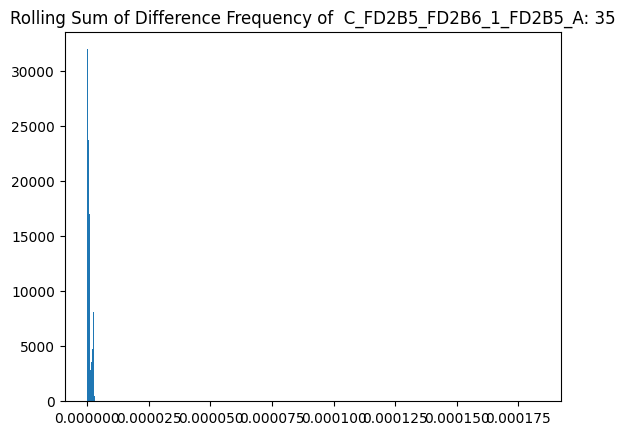

******************************************************************************


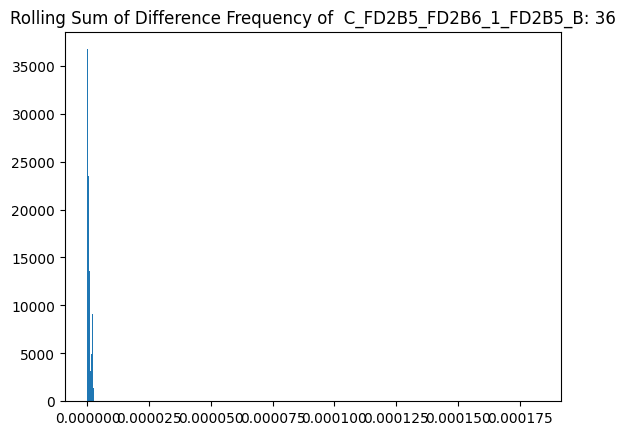

******************************************************************************


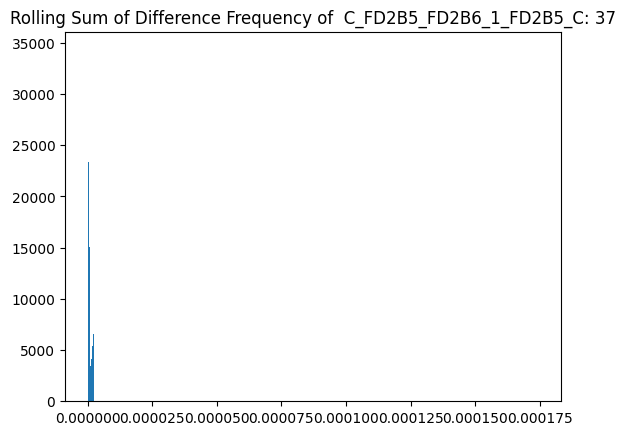

******************************************************************************


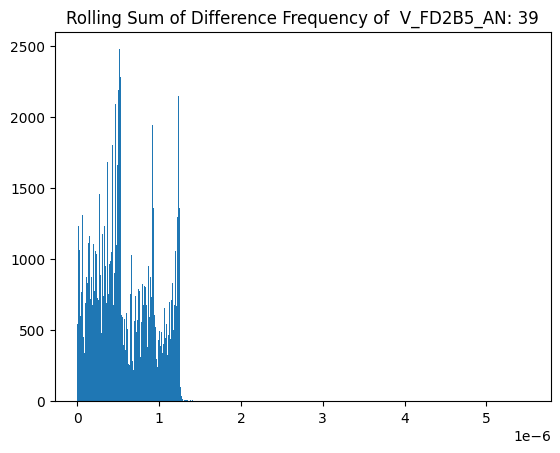

******************************************************************************


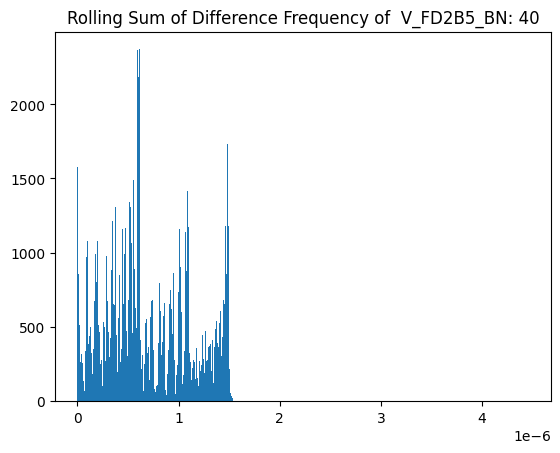

******************************************************************************


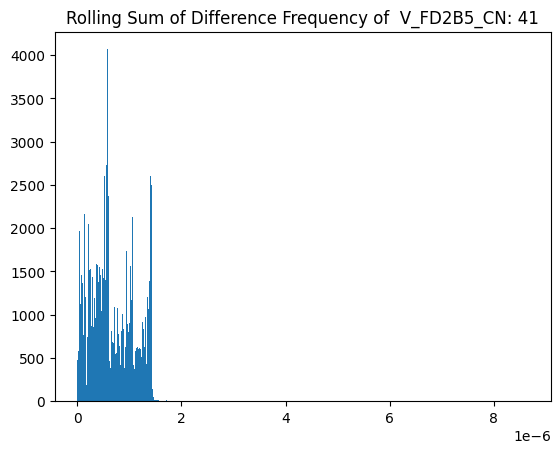

******************************************************************************


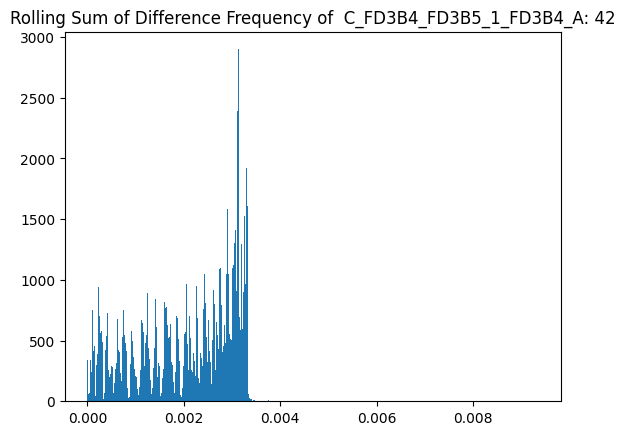

******************************************************************************


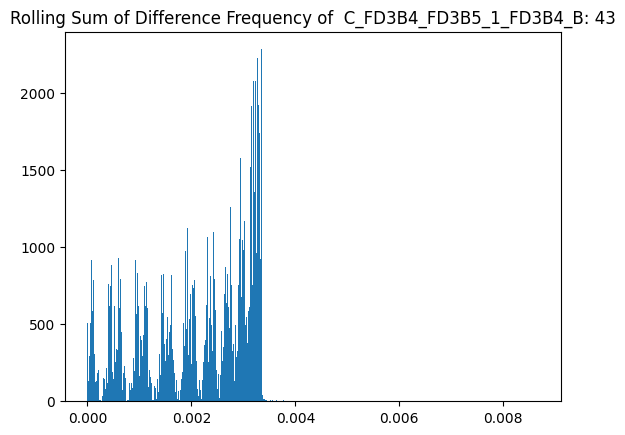

******************************************************************************


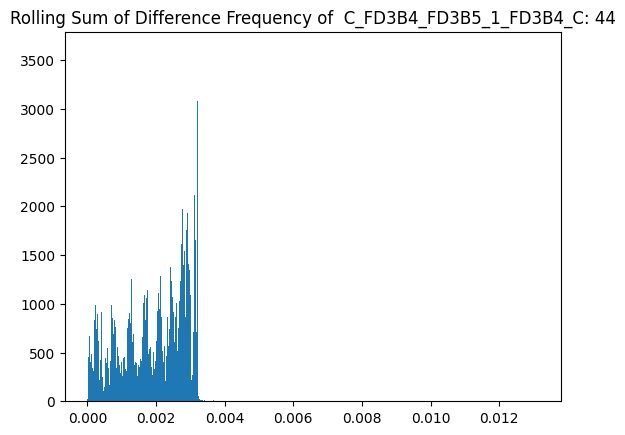

******************************************************************************


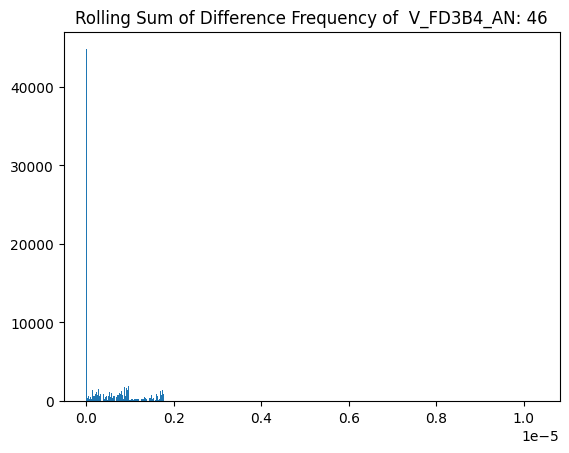

******************************************************************************


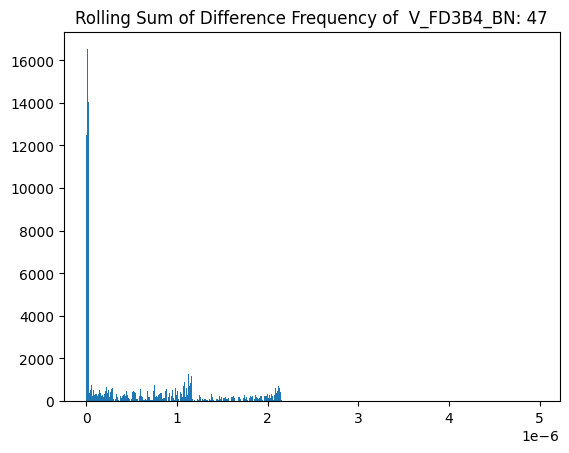

******************************************************************************


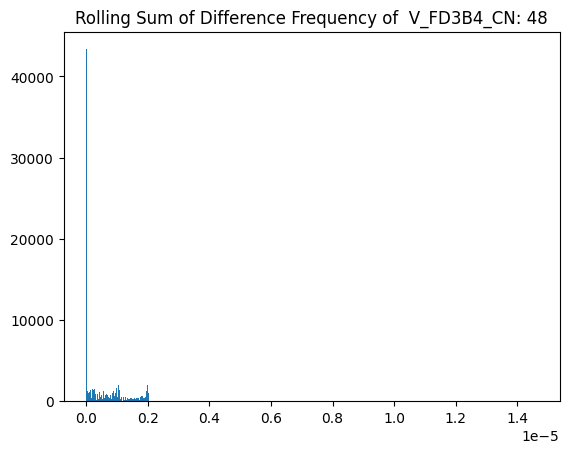

******************************************************************************


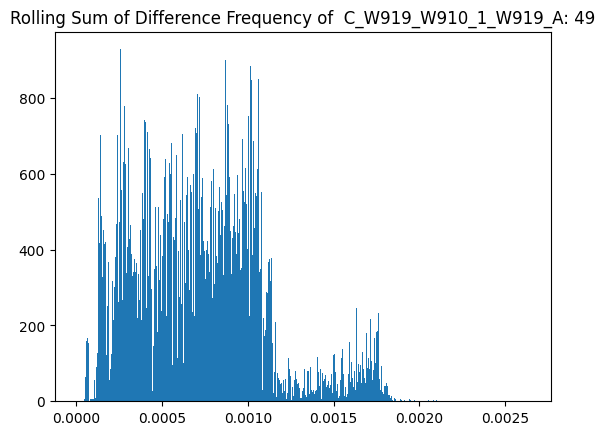

******************************************************************************


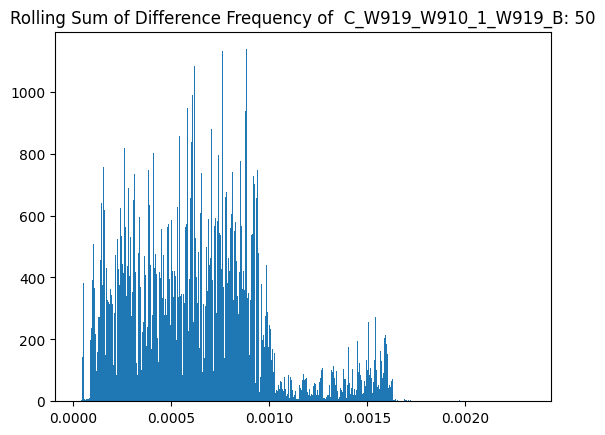

******************************************************************************


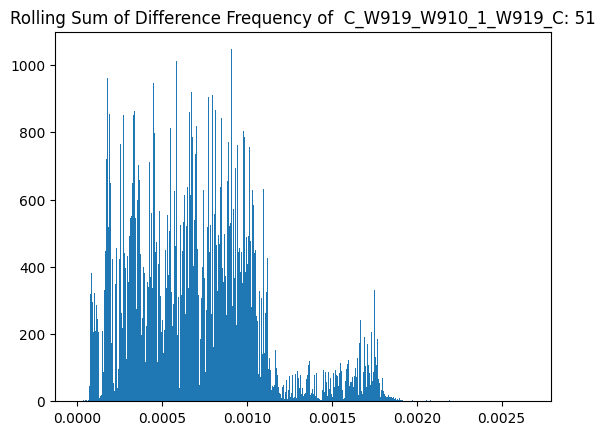

******************************************************************************


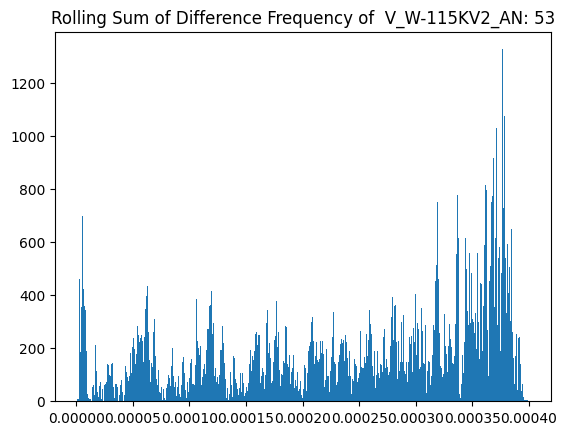

******************************************************************************


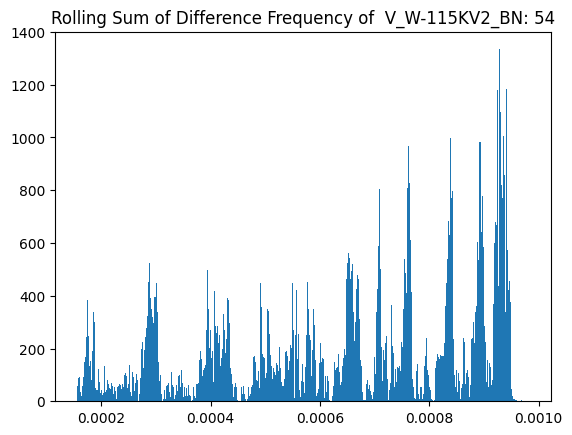

******************************************************************************


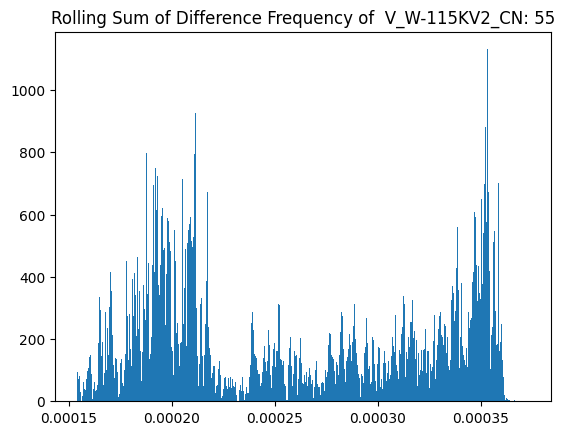

******************************************************************************


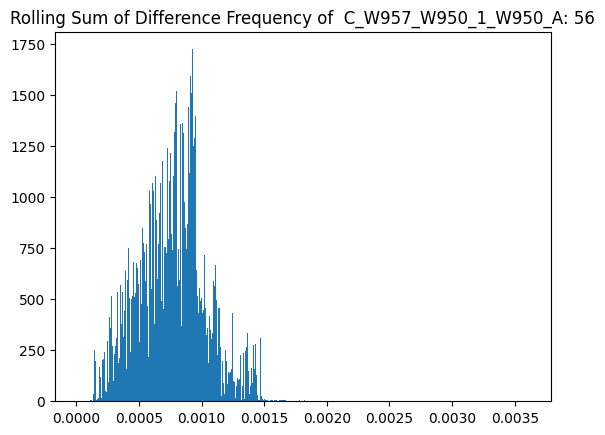

******************************************************************************


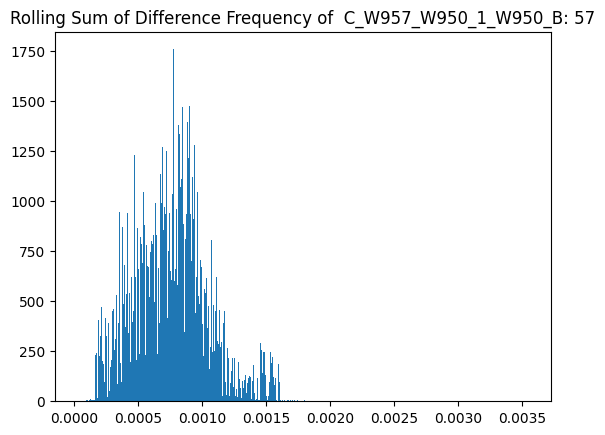

******************************************************************************


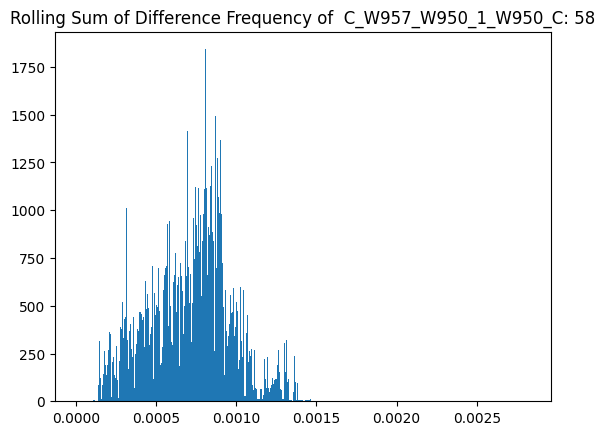

******************************************************************************


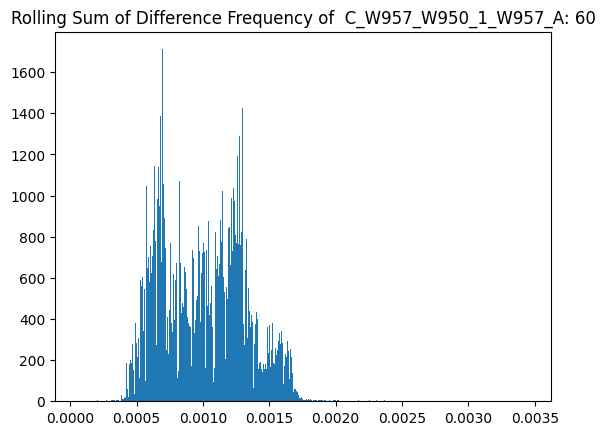

******************************************************************************


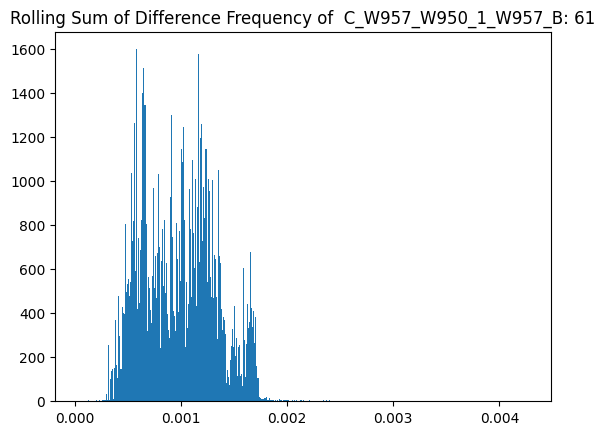

******************************************************************************


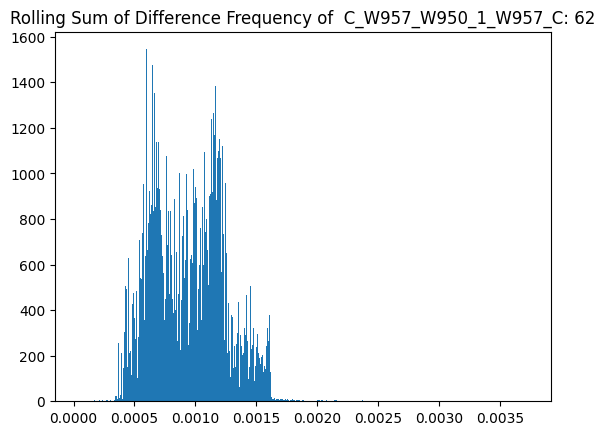

******************************************************************************


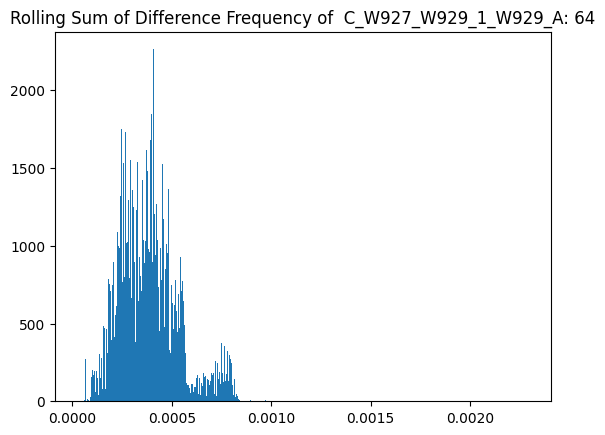

******************************************************************************


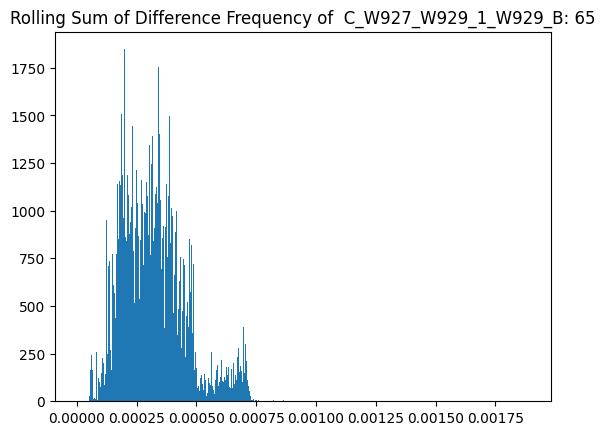

******************************************************************************


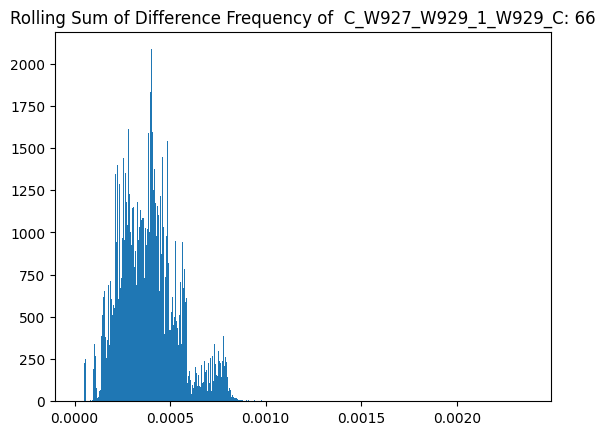

******************************************************************************


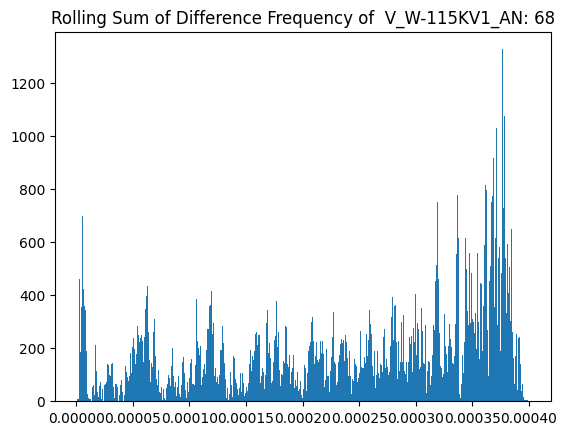

******************************************************************************


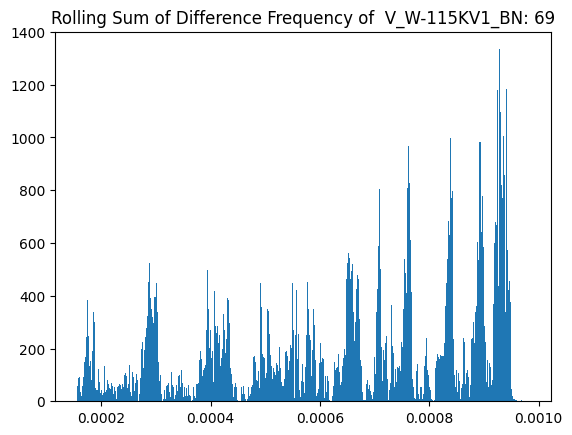

******************************************************************************


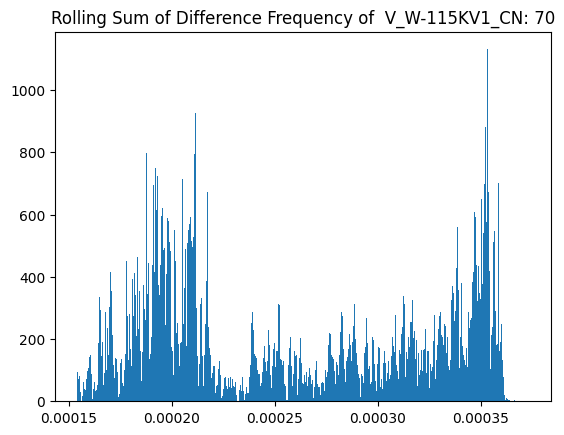

******************************************************************************


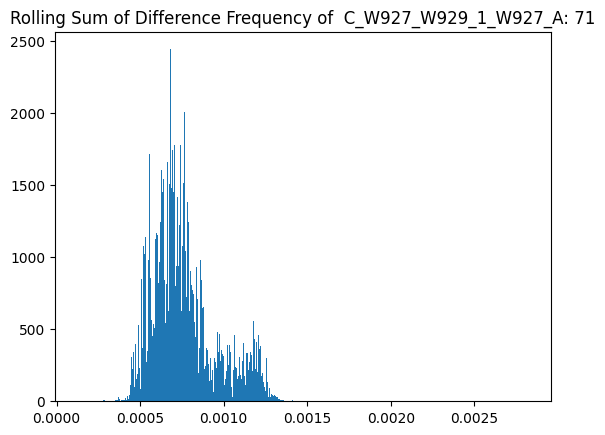

******************************************************************************


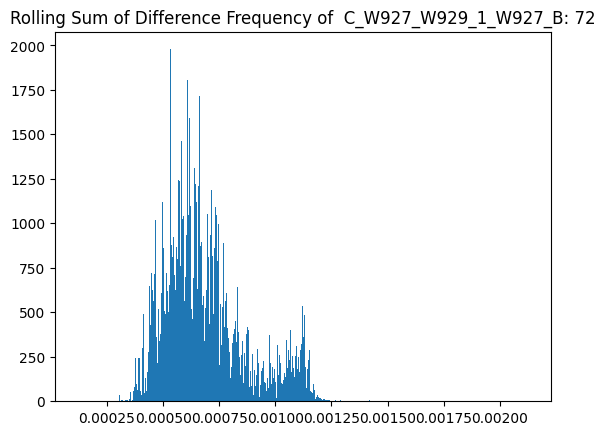

******************************************************************************


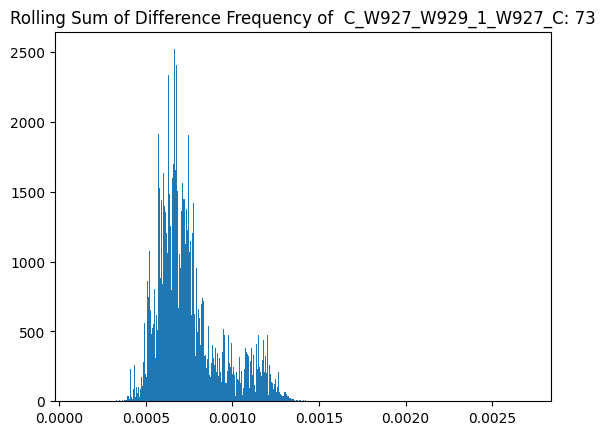

******************************************************************************


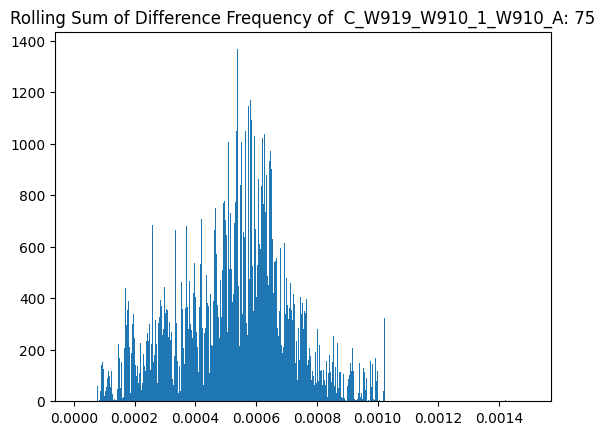

******************************************************************************


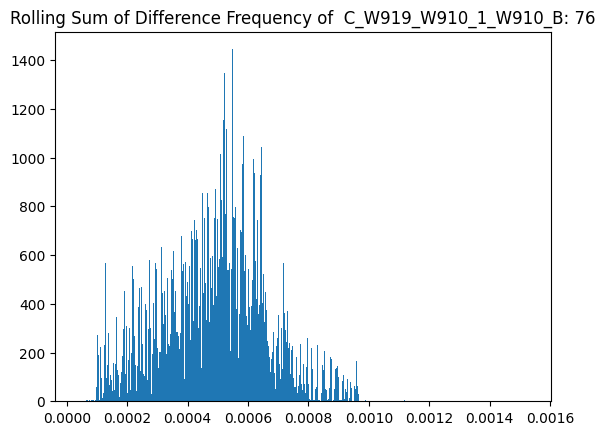

******************************************************************************


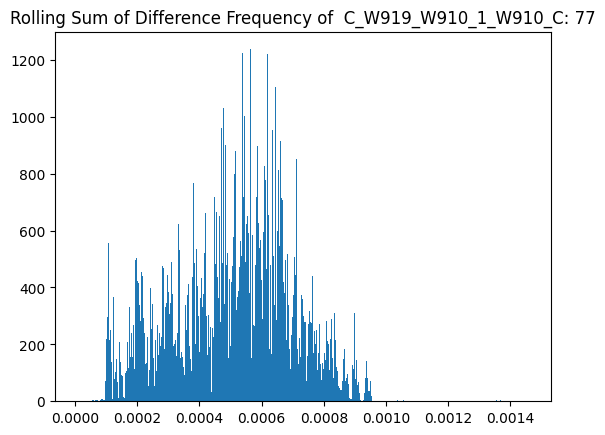

******************************************************************************


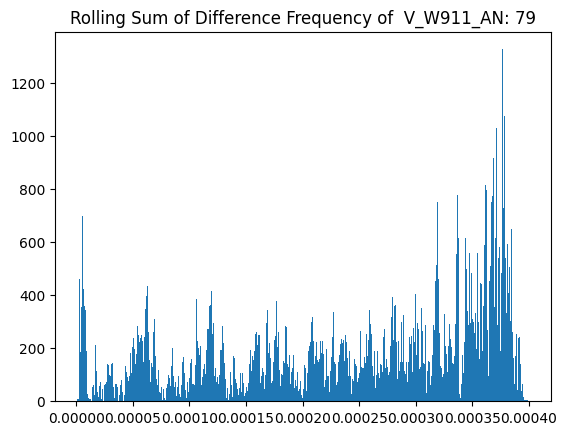

******************************************************************************


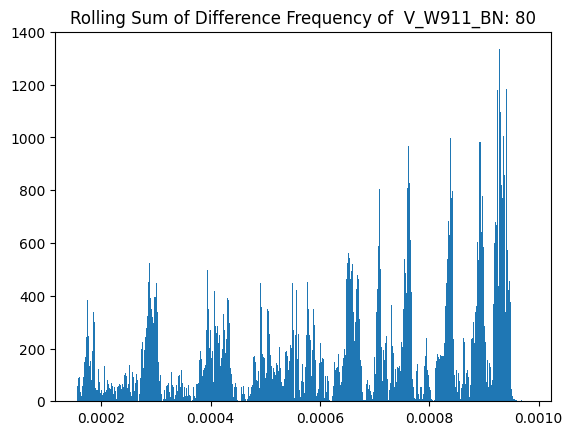

******************************************************************************


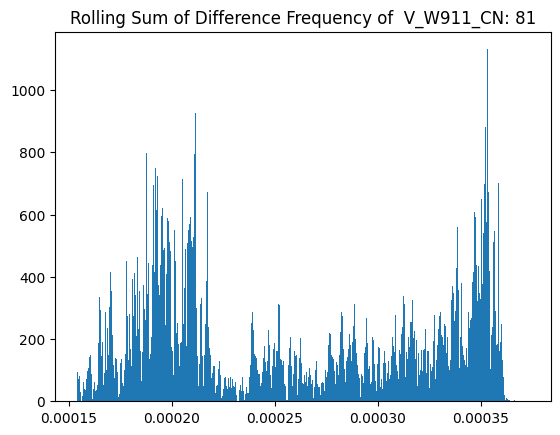

******************************************************************************


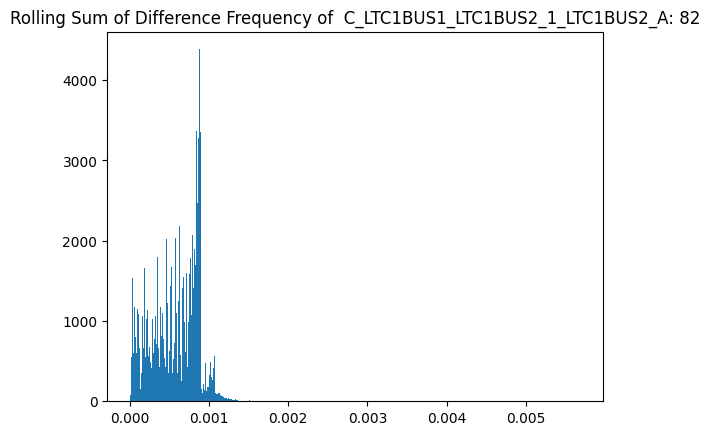

******************************************************************************


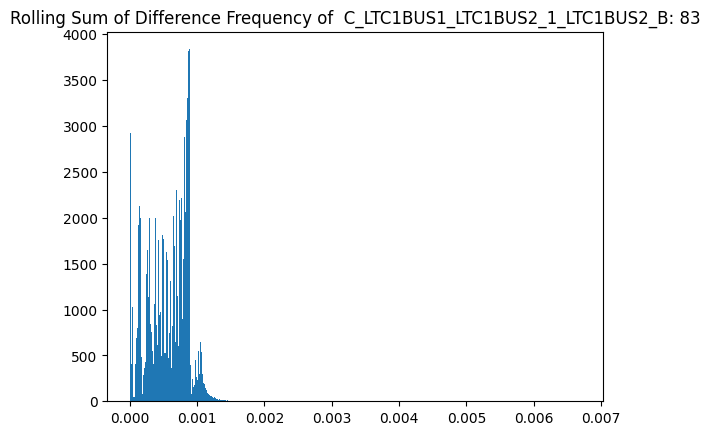

******************************************************************************


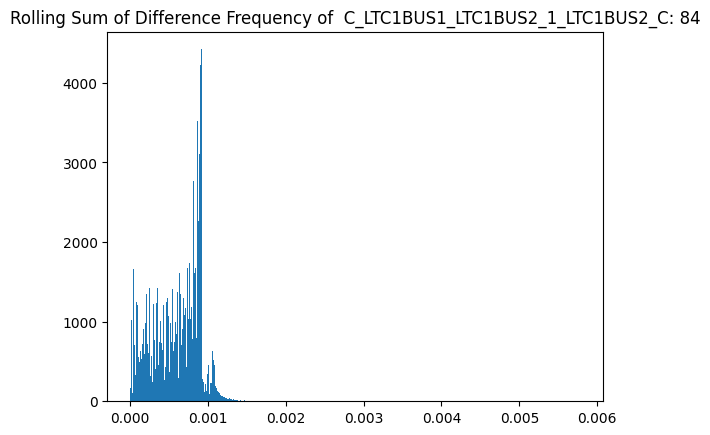

******************************************************************************


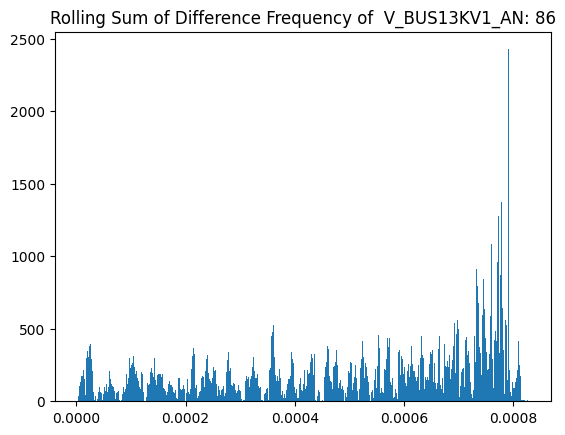

******************************************************************************


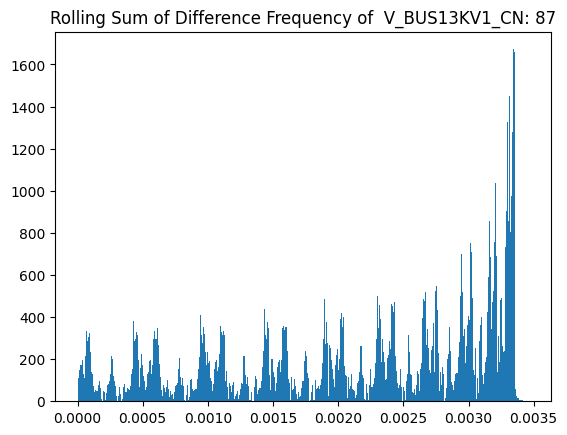

******************************************************************************


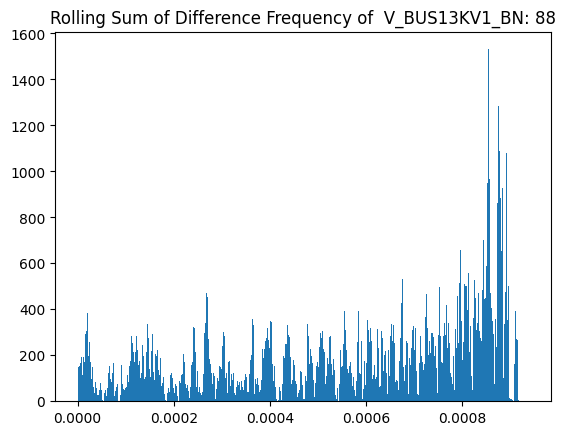

******************************************************************************


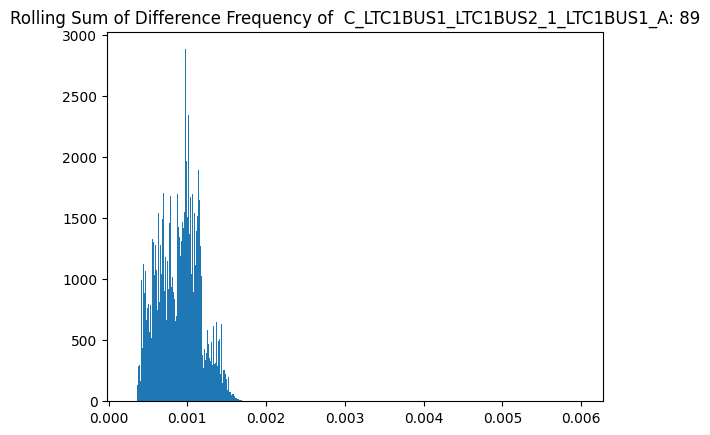

******************************************************************************


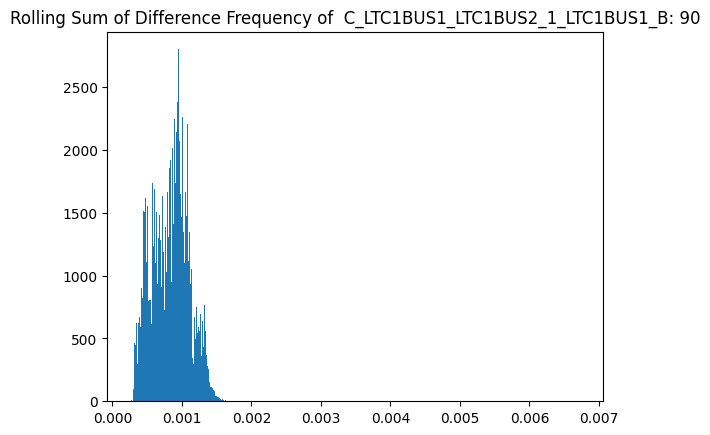

******************************************************************************


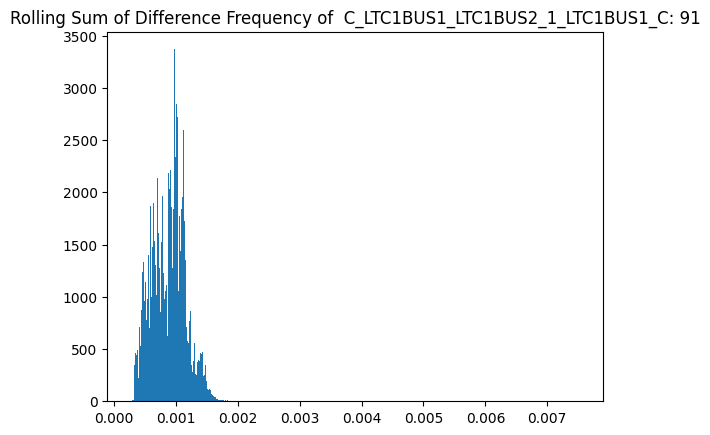

******************************************************************************


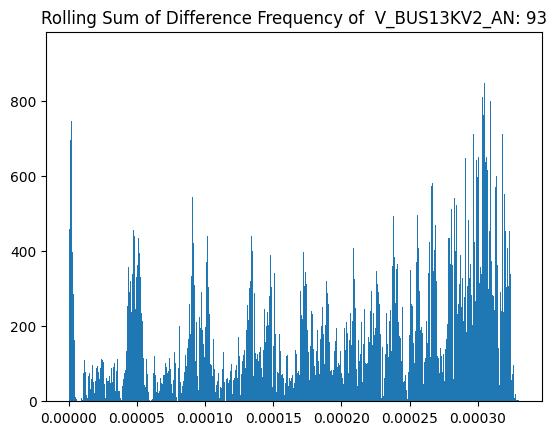

******************************************************************************


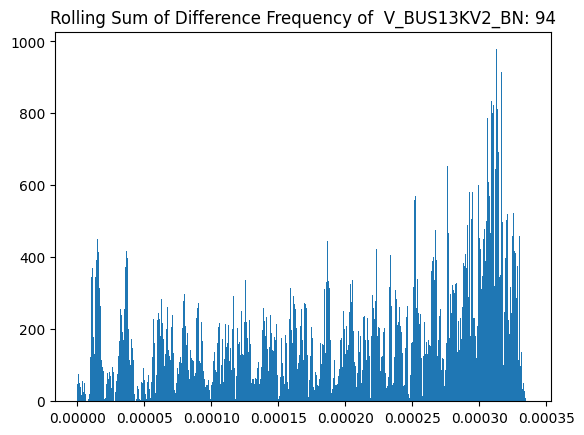

******************************************************************************


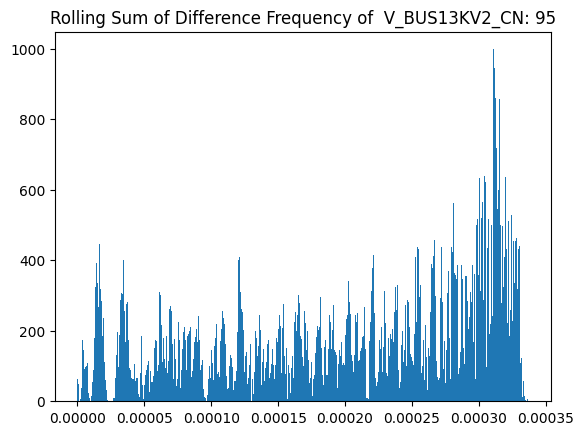

******************************************************************************


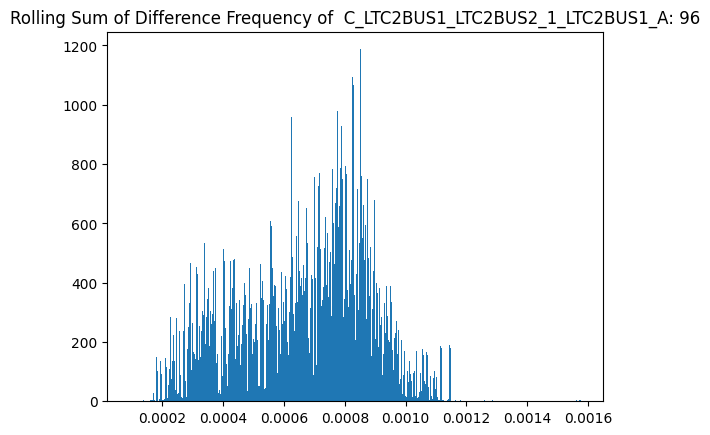

******************************************************************************


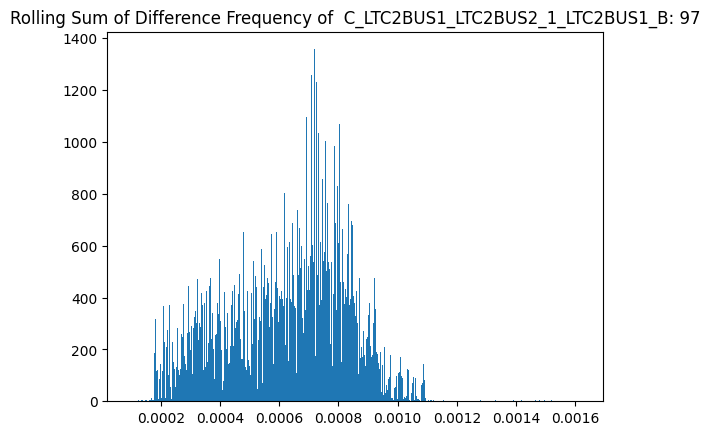

******************************************************************************


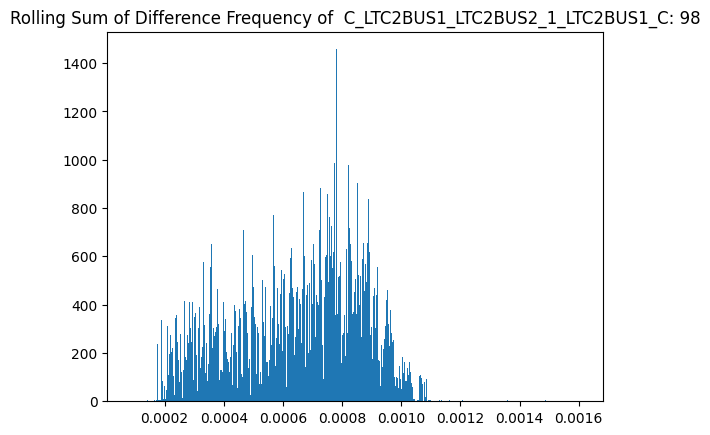

******************************************************************************


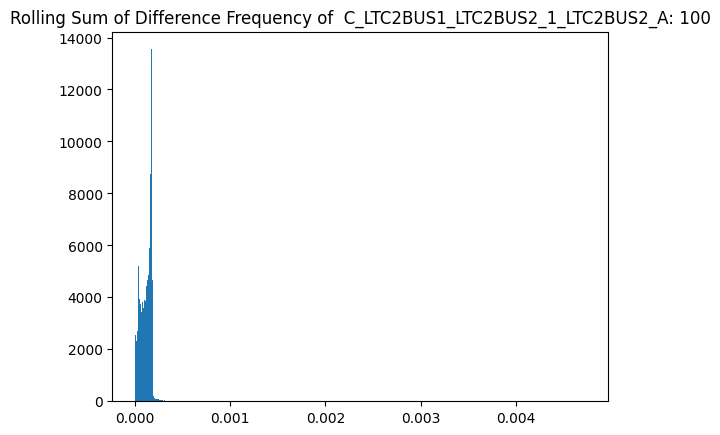

******************************************************************************


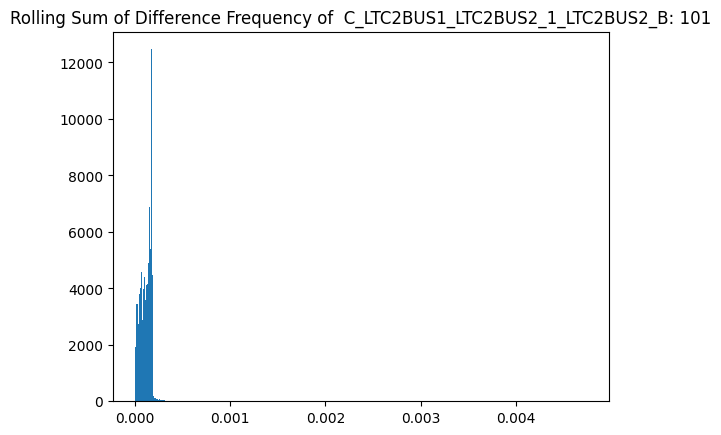

******************************************************************************


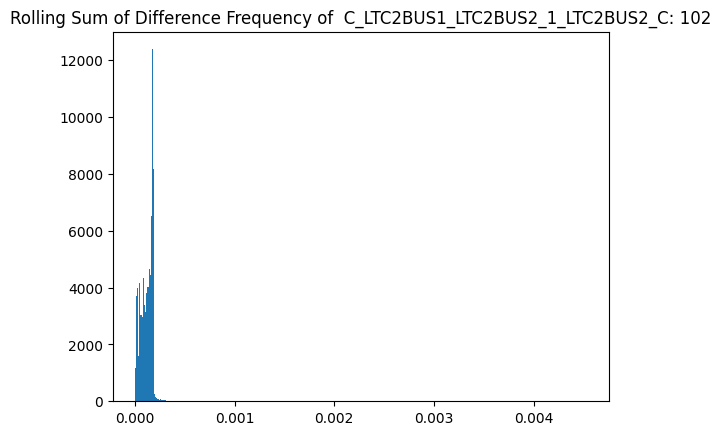

******************************************************************************


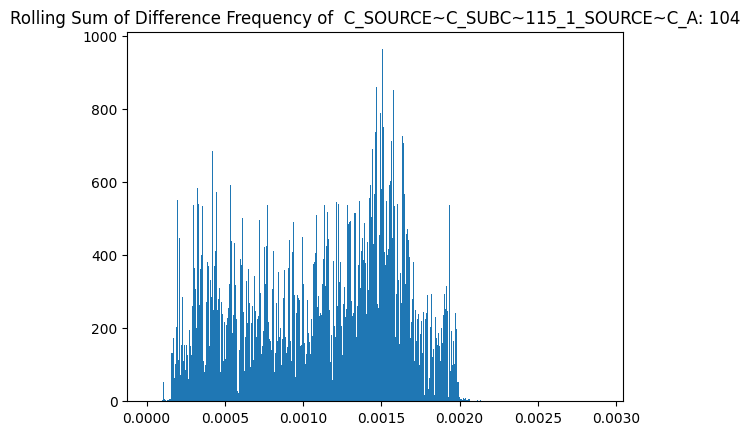

******************************************************************************


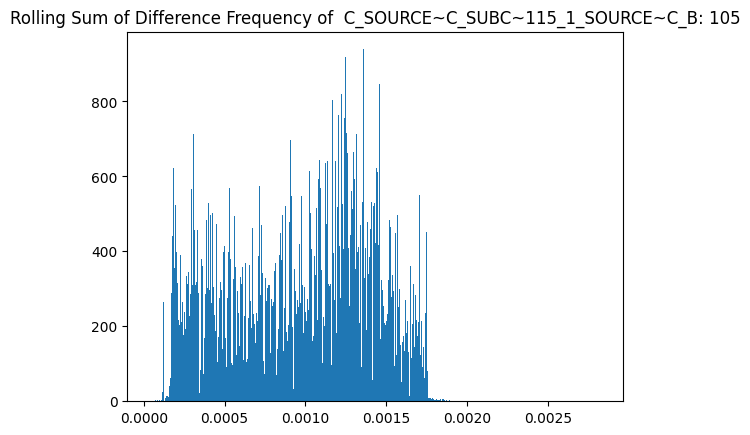

******************************************************************************


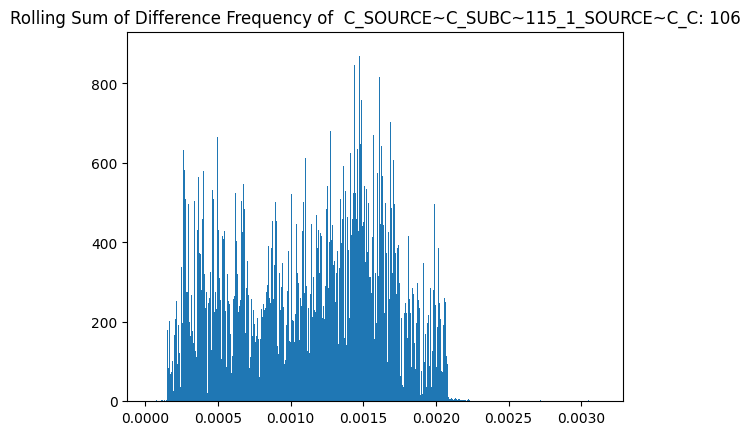

******************************************************************************


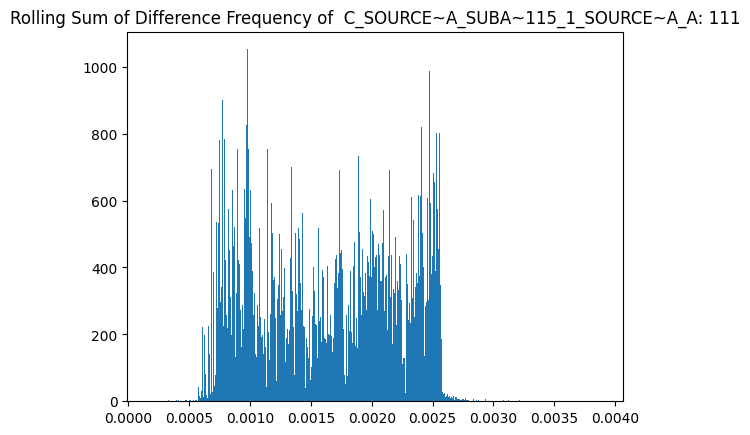

******************************************************************************


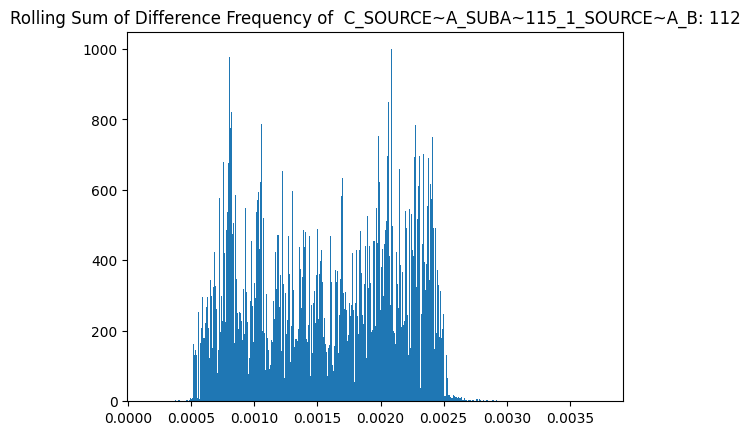

******************************************************************************


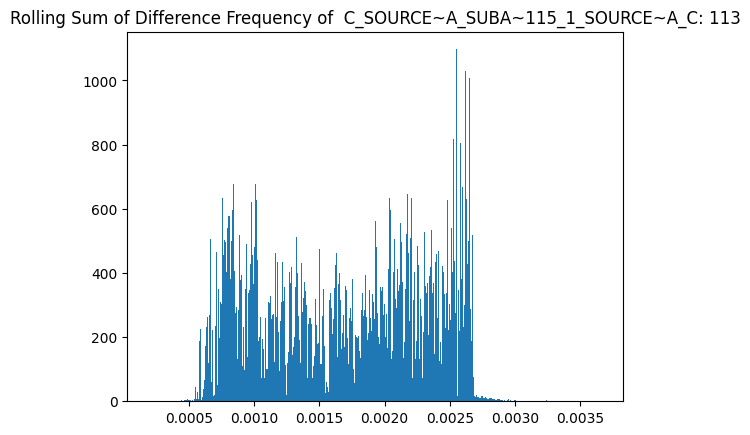

******************************************************************************


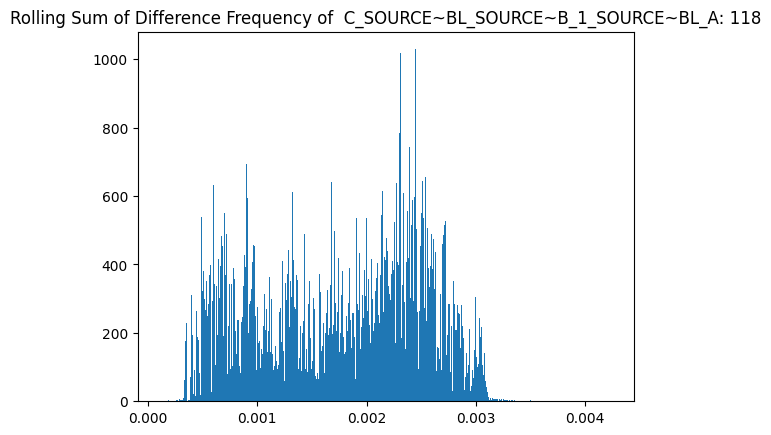

******************************************************************************


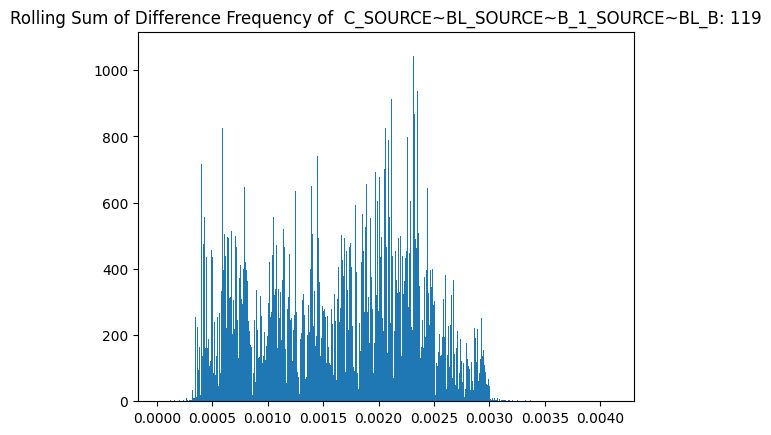

******************************************************************************


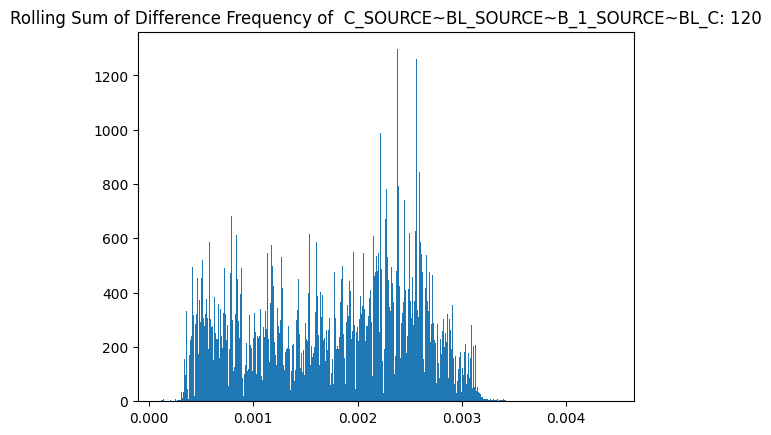

******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
****************************************************

In [8]:
window = 350
w = 1
cols = data.columns

corr_fn = correlation_pair
thresholds_corr, corr_multi_list = get_threshold_stat_only(data, corr_fn, cols,
              window=window, w=w, adj_list=adj_list, quantile=1, axis=1, stat_list=None, plot=True, collate_fn="sum")
thresholds_corr_99, corr_multi_list = get_threshold_stat_only(data, corr_fn, cols,
              window=window, w=w, adj_list=adj_list, quantile=0.99, axis=1, stat_list=corr_multi_list, collate_fn="sum")
thresholds_corr_95, corr_multi_list = get_threshold_stat_only(data, corr_fn, cols,
              window=window, w=w, adj_list=adj_list, quantile=0.95, axis=1, stat_list=corr_multi_list, collate_fn="sum")

In [9]:
len(thresholds_corr)

96

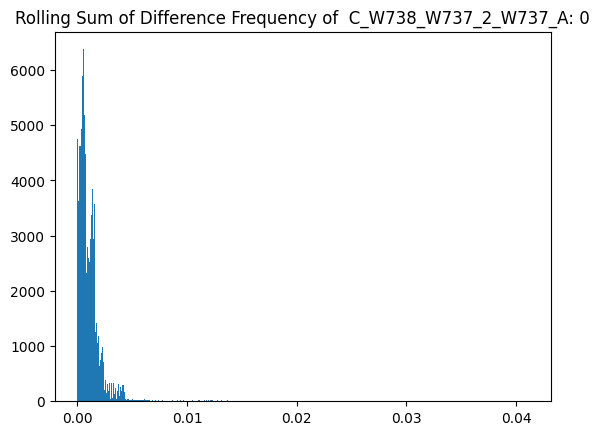

******************************************************************************


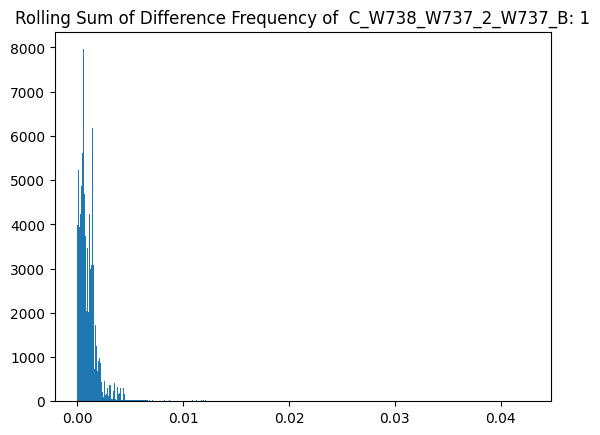

******************************************************************************


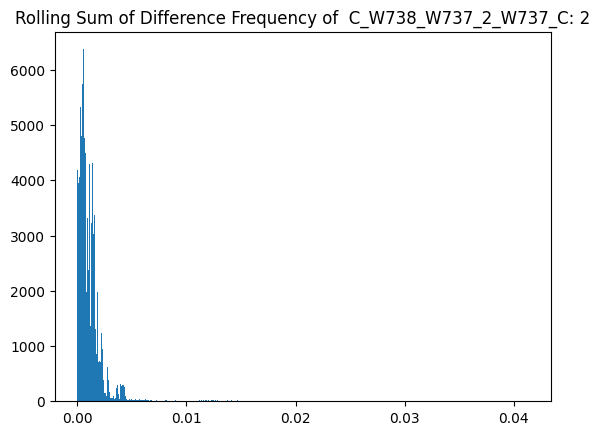

******************************************************************************


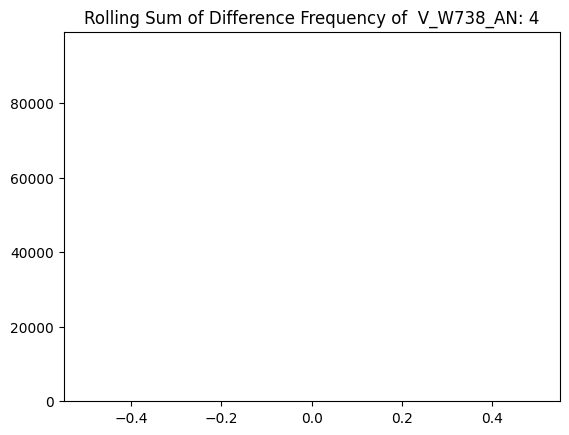

******************************************************************************


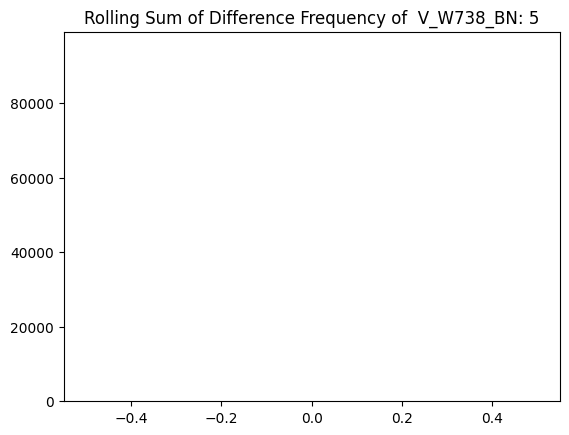

******************************************************************************


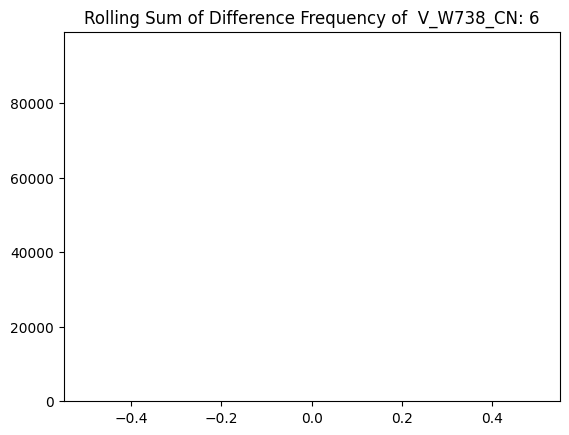

******************************************************************************


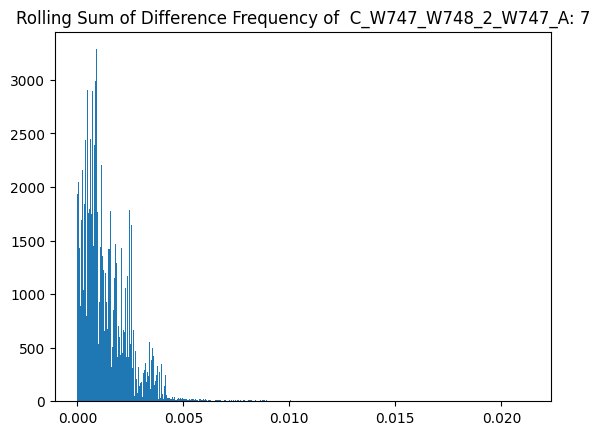

******************************************************************************


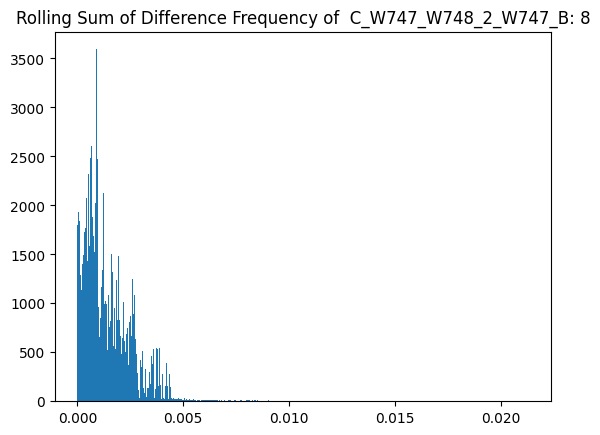

******************************************************************************


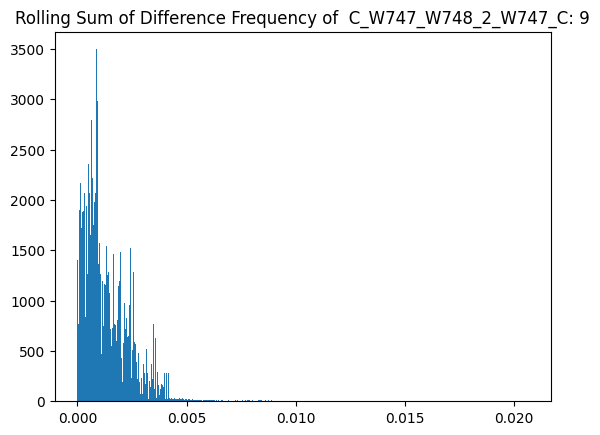

******************************************************************************


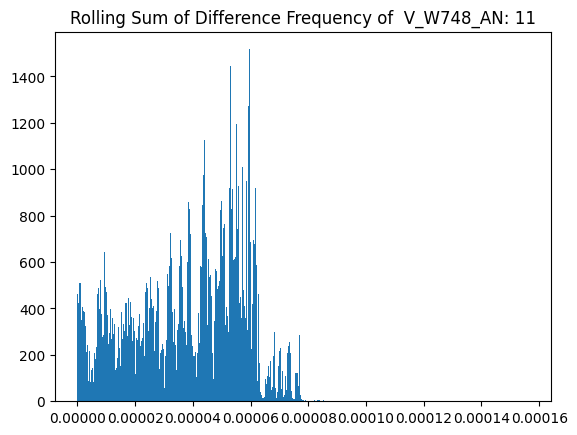

******************************************************************************


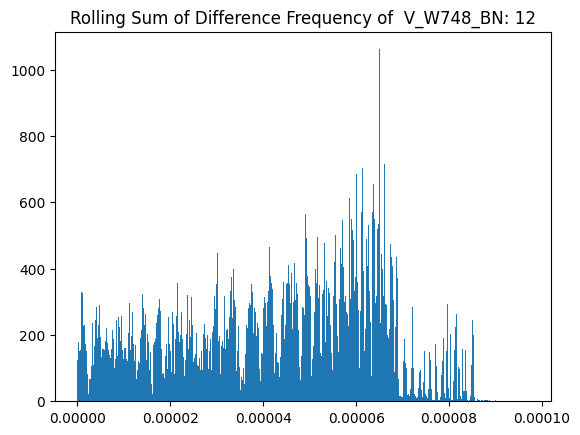

******************************************************************************


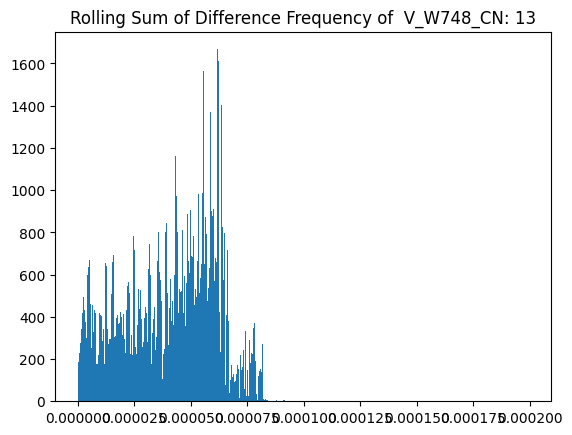

******************************************************************************


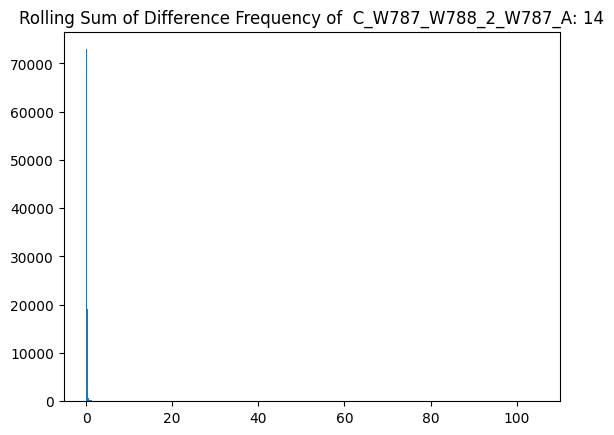

******************************************************************************


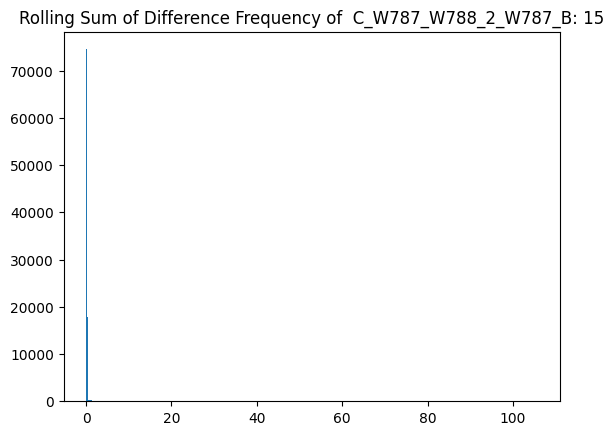

******************************************************************************


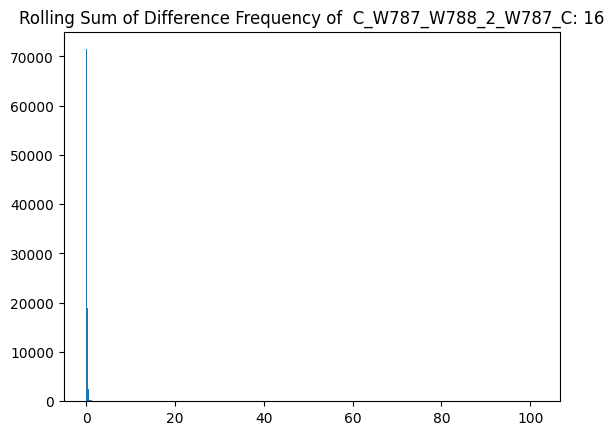

******************************************************************************


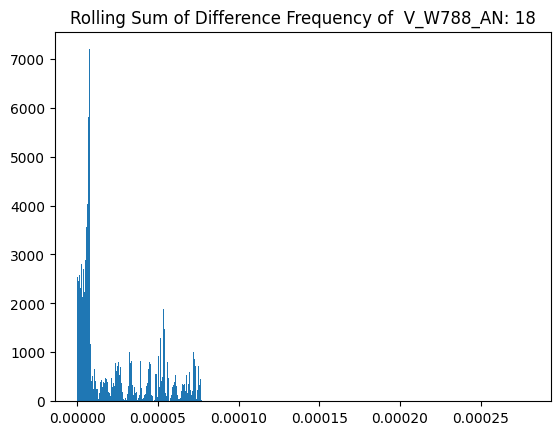

******************************************************************************


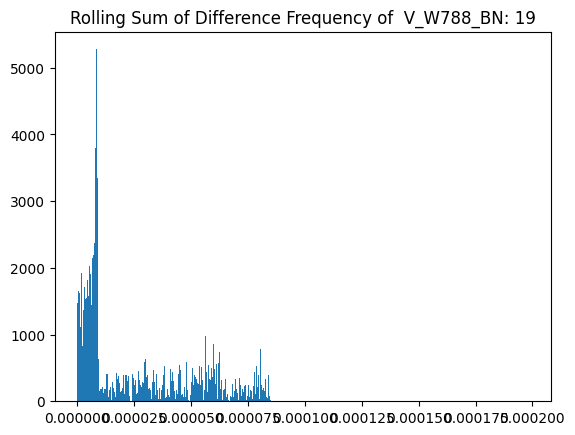

******************************************************************************


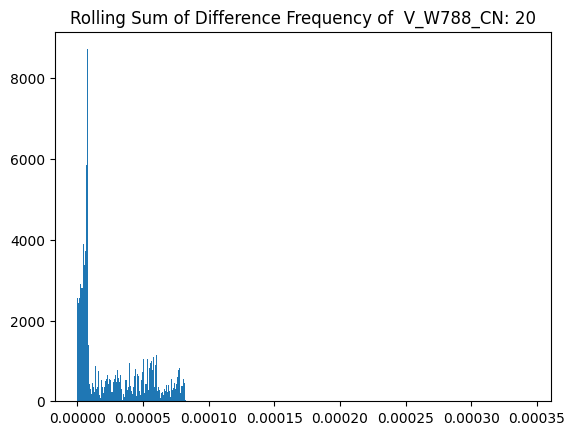

******************************************************************************


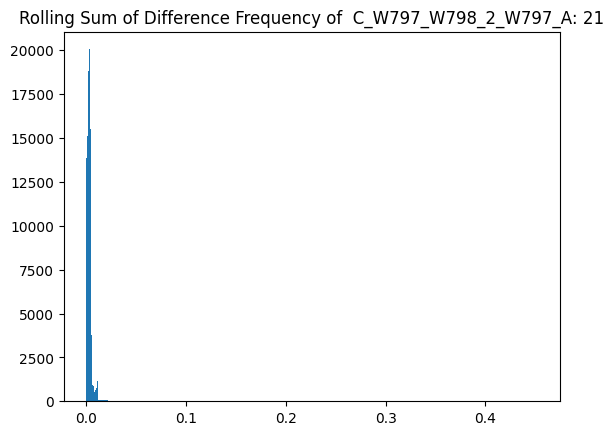

******************************************************************************


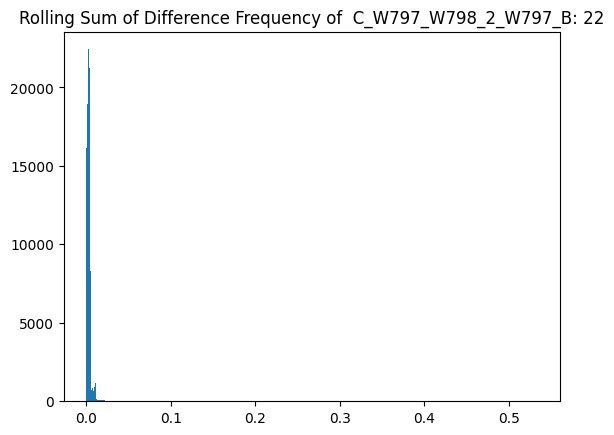

******************************************************************************


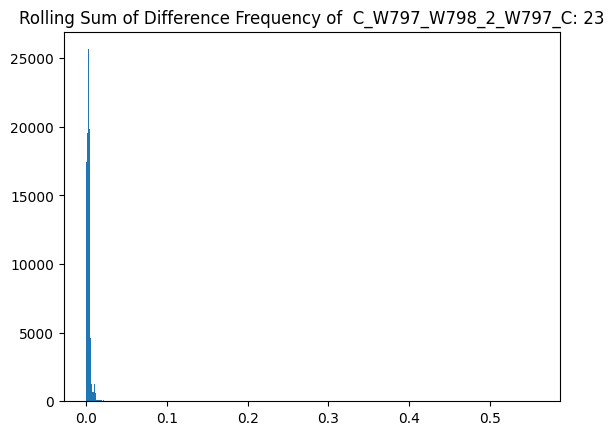

******************************************************************************


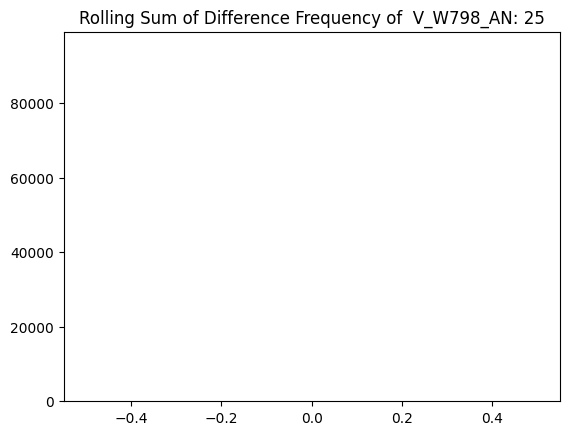

******************************************************************************


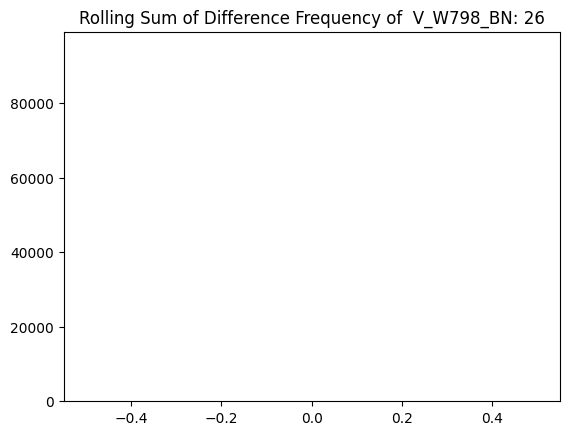

******************************************************************************


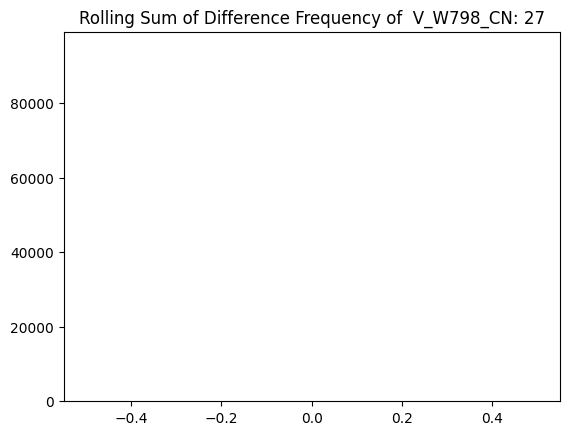

******************************************************************************


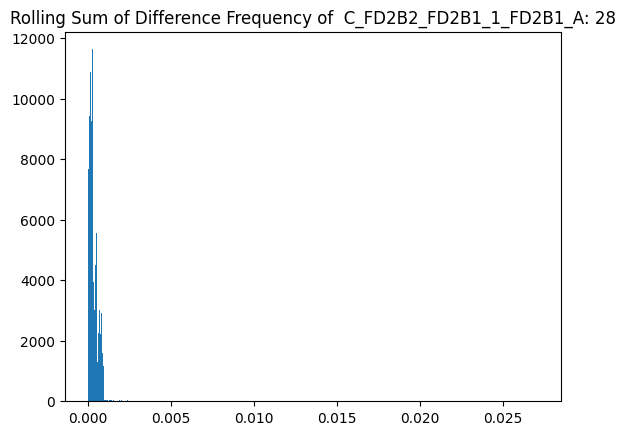

******************************************************************************


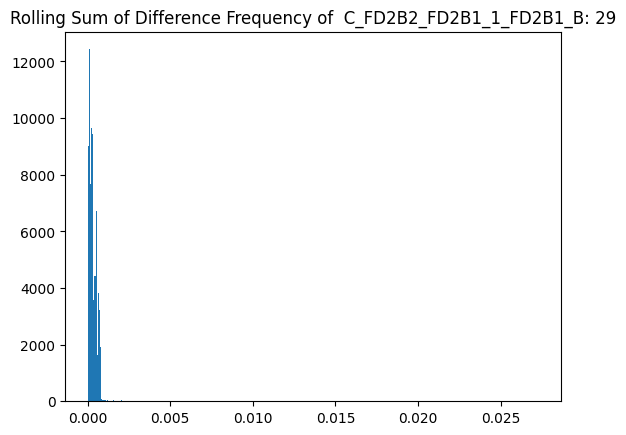

******************************************************************************


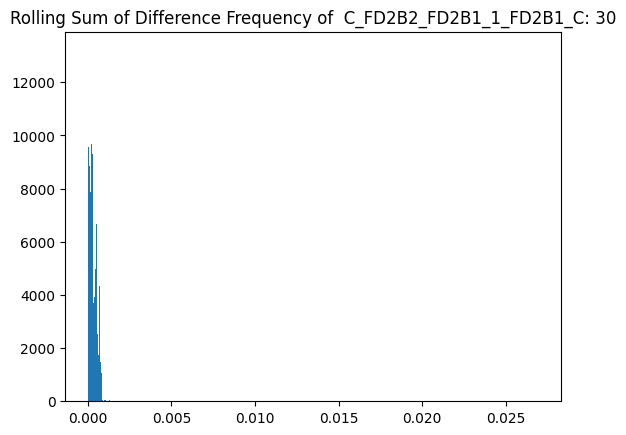

******************************************************************************


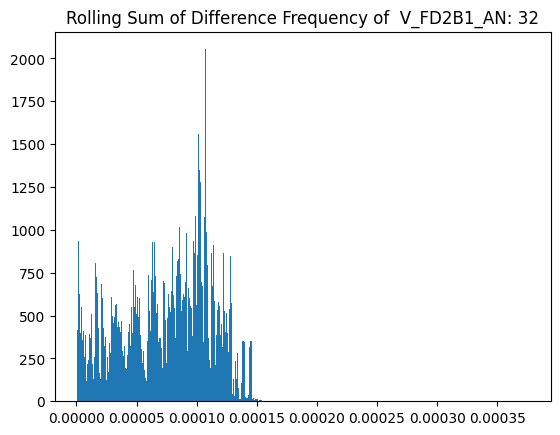

******************************************************************************


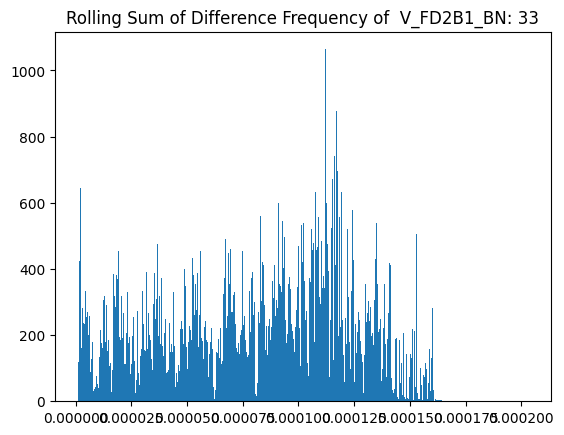

******************************************************************************


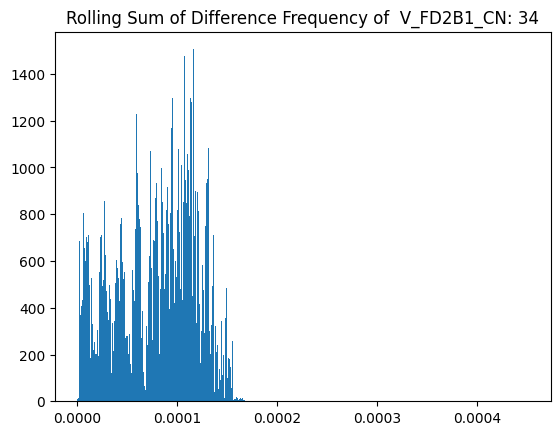

******************************************************************************


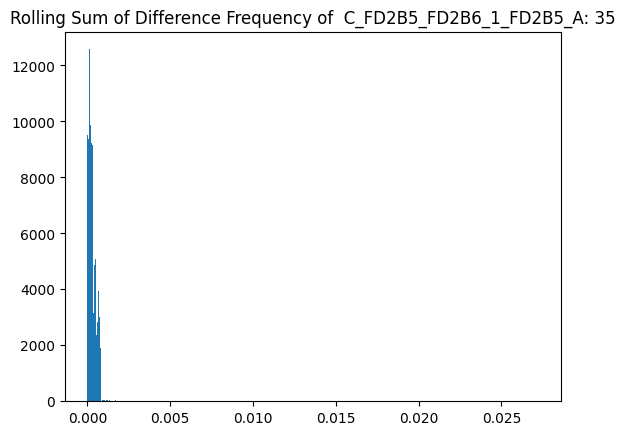

******************************************************************************


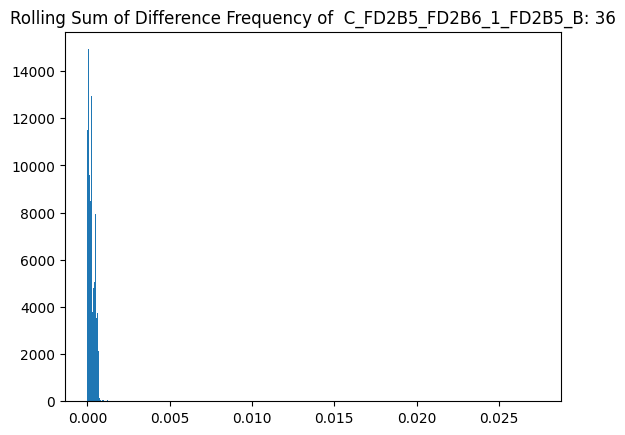

******************************************************************************


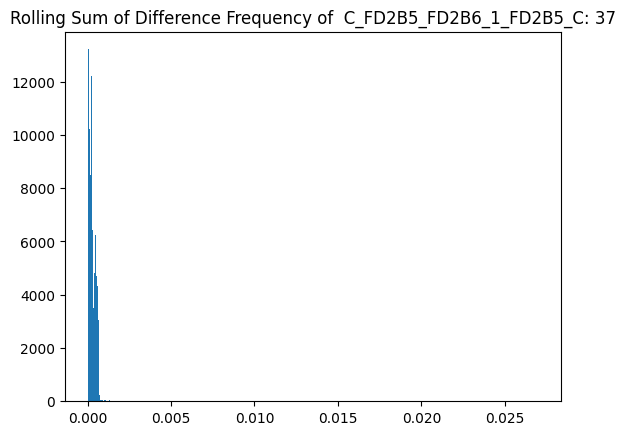

******************************************************************************


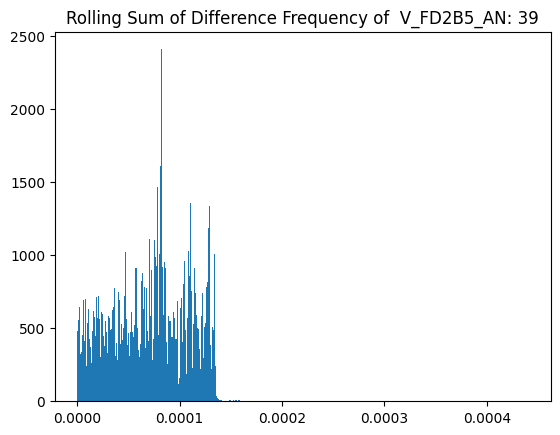

******************************************************************************


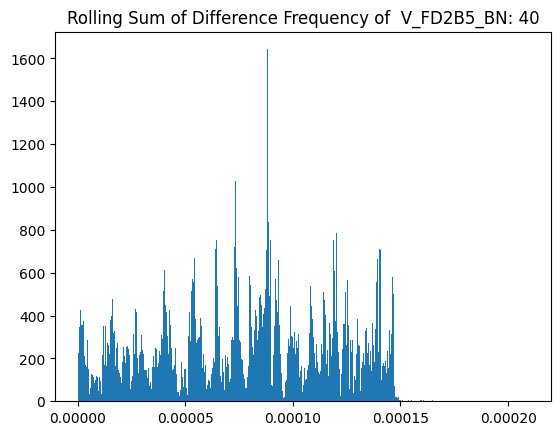

******************************************************************************


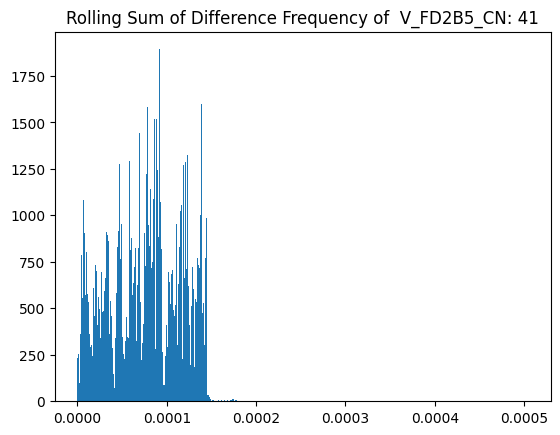

******************************************************************************


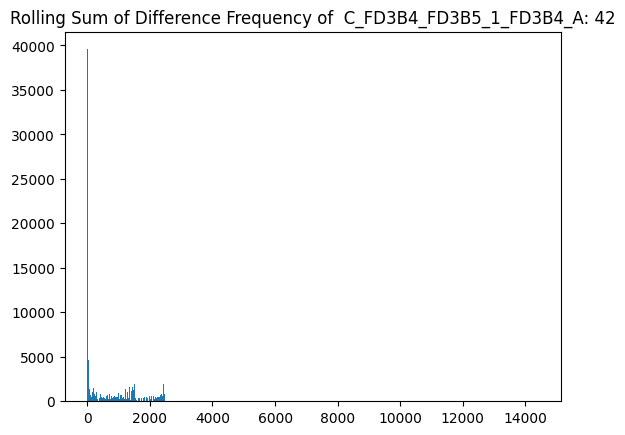

******************************************************************************


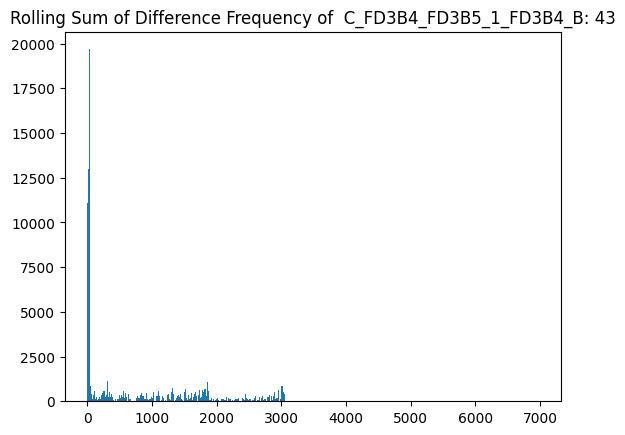

******************************************************************************


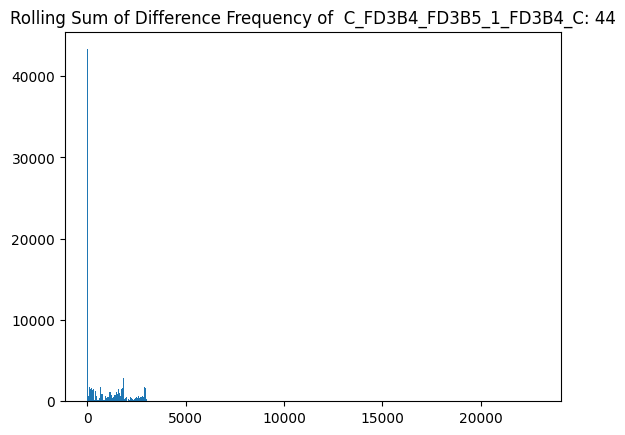

******************************************************************************


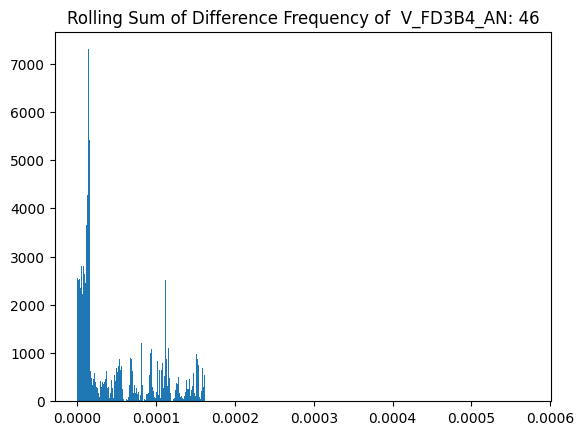

******************************************************************************


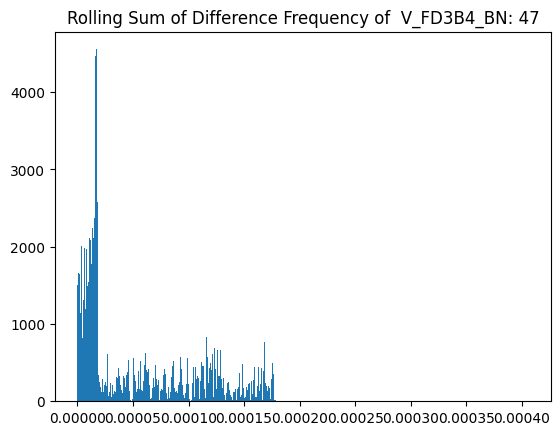

******************************************************************************


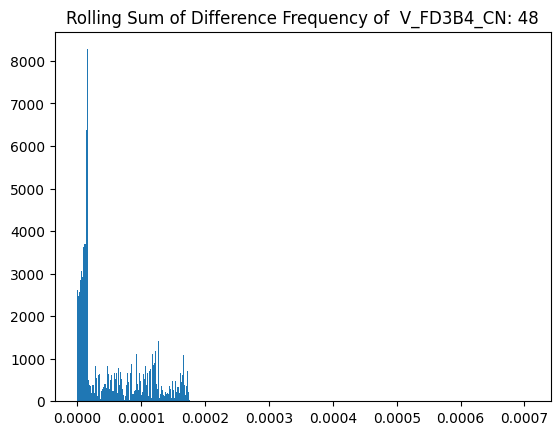

******************************************************************************


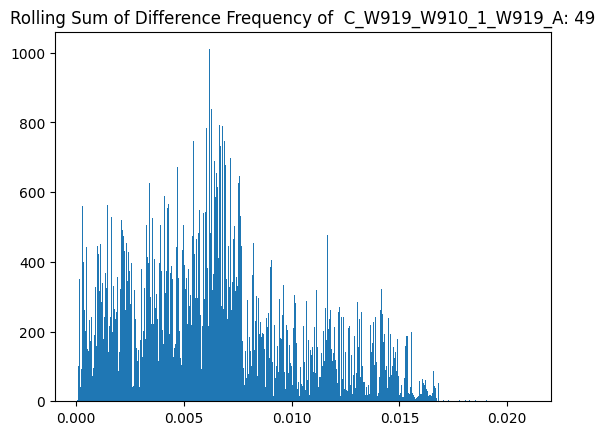

******************************************************************************


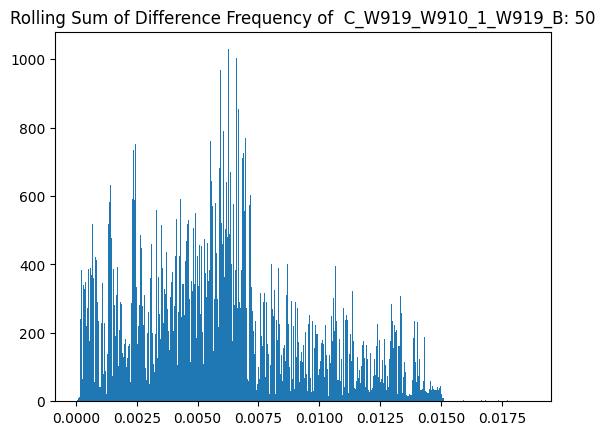

******************************************************************************


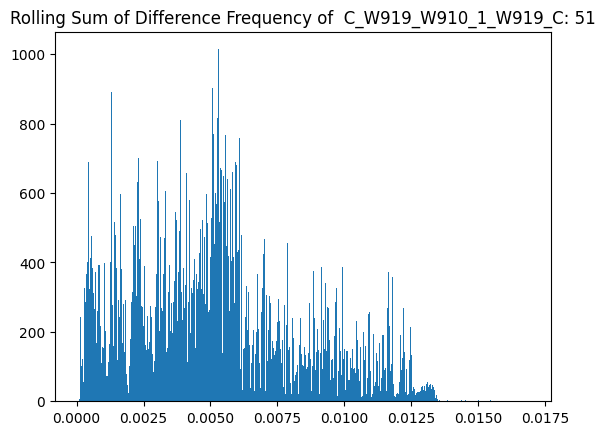

******************************************************************************


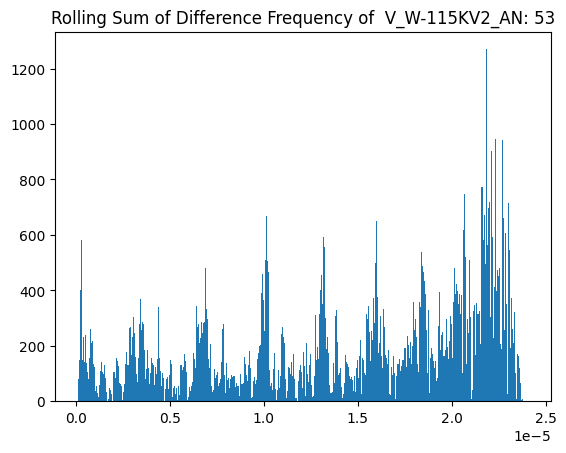

******************************************************************************


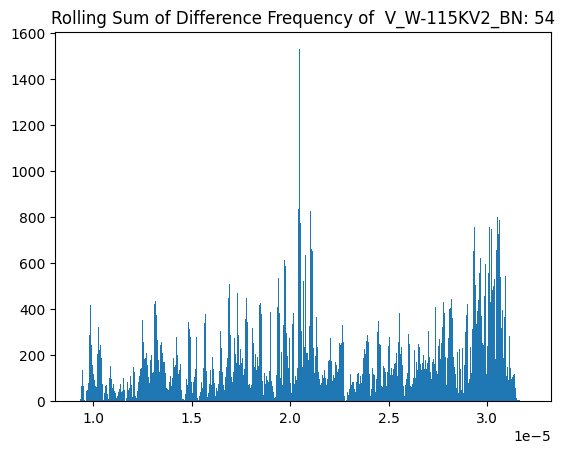

******************************************************************************


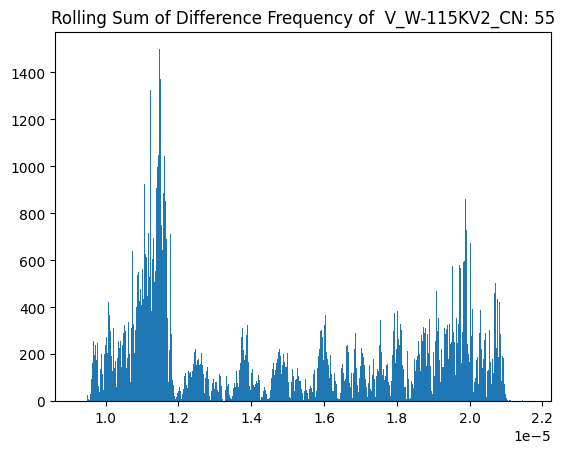

******************************************************************************


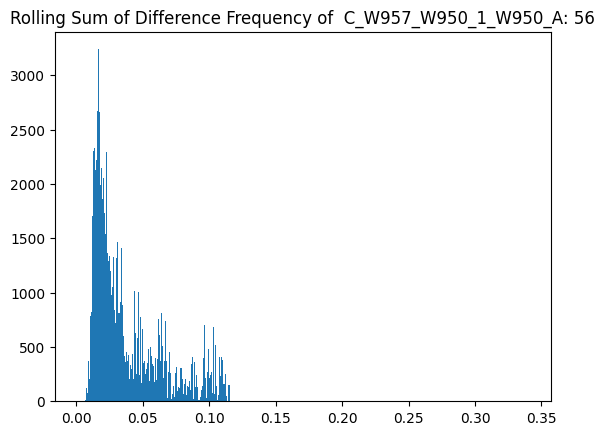

******************************************************************************


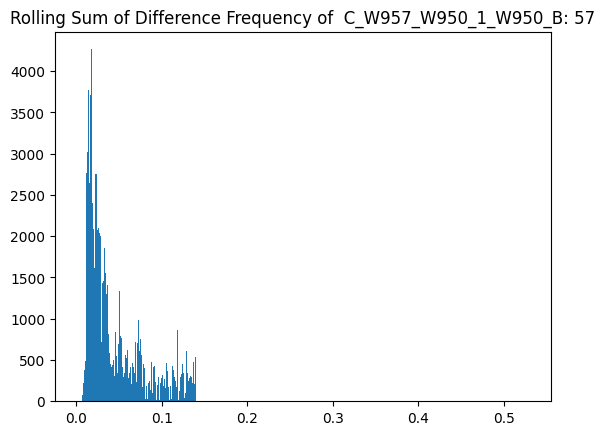

******************************************************************************


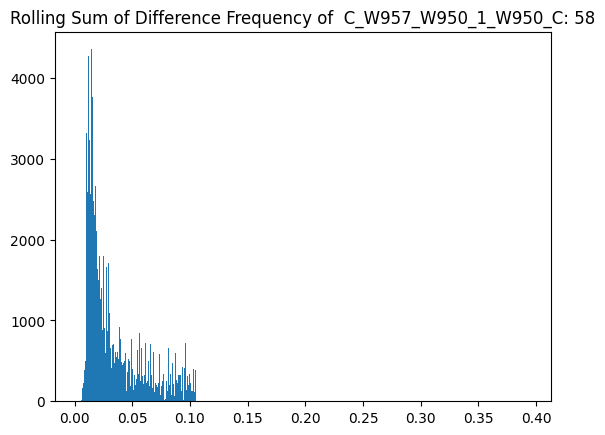

******************************************************************************


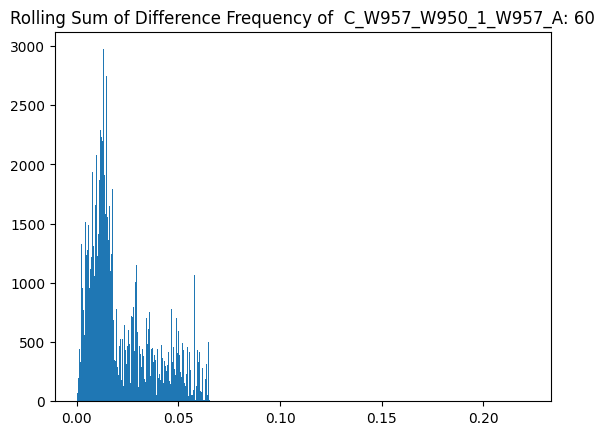

******************************************************************************


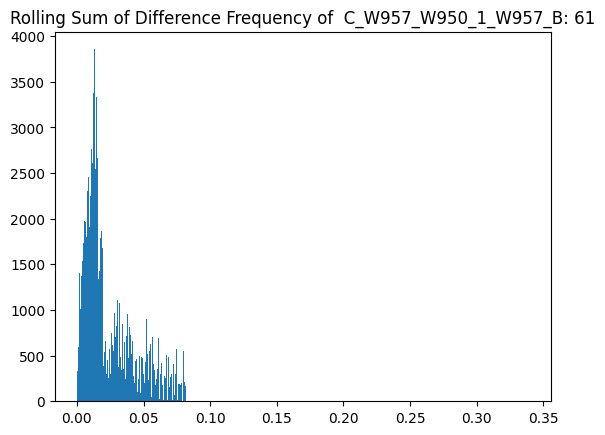

******************************************************************************


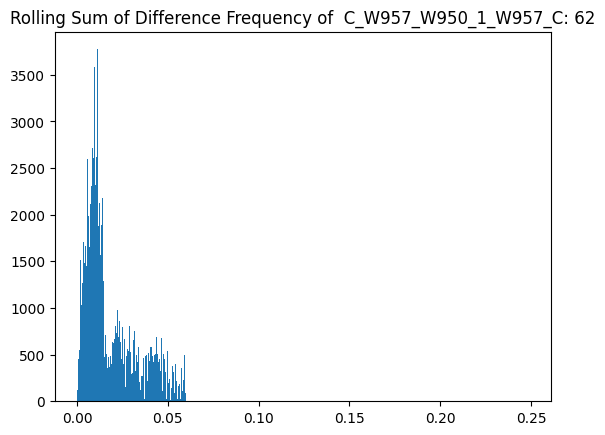

******************************************************************************


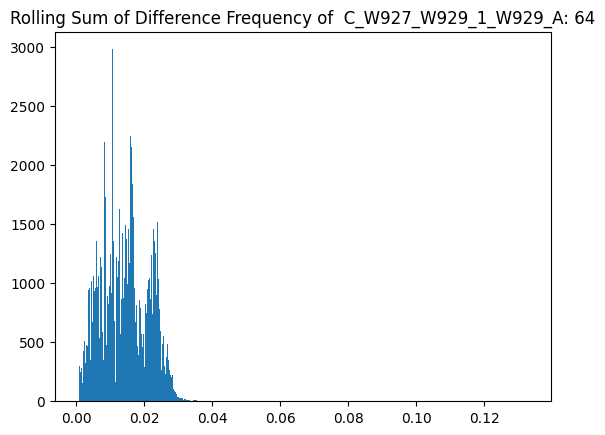

******************************************************************************


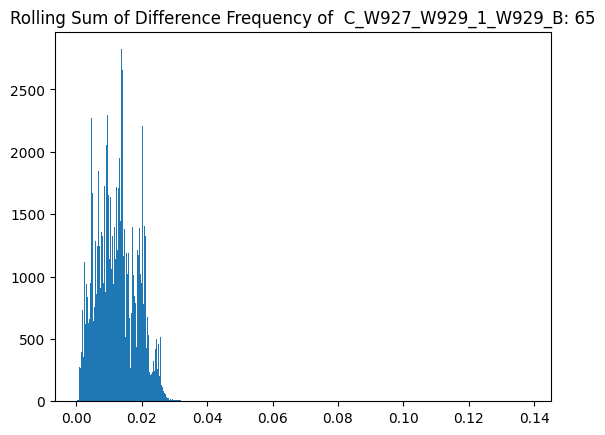

******************************************************************************


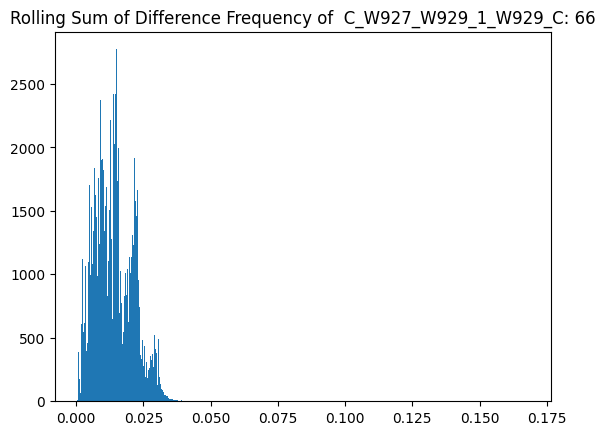

******************************************************************************


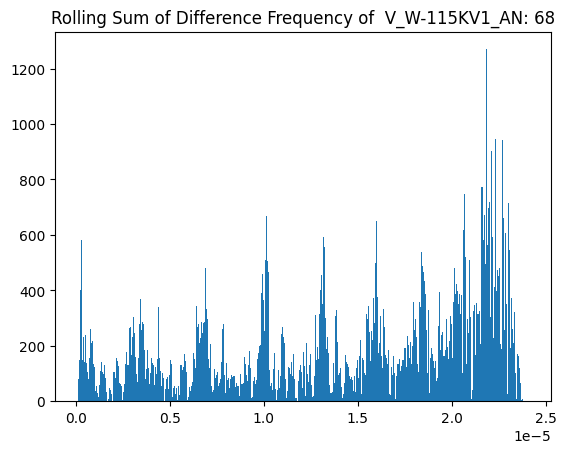

******************************************************************************


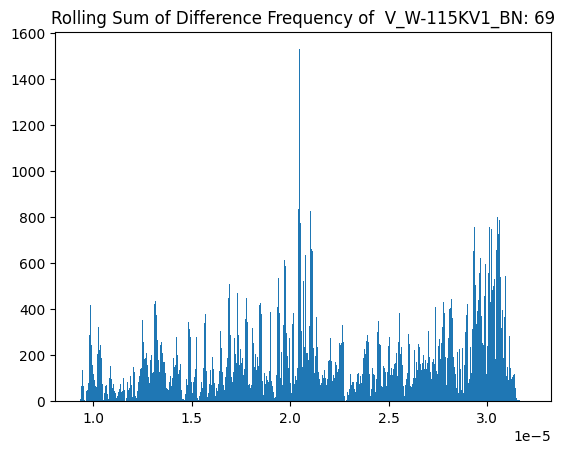

******************************************************************************


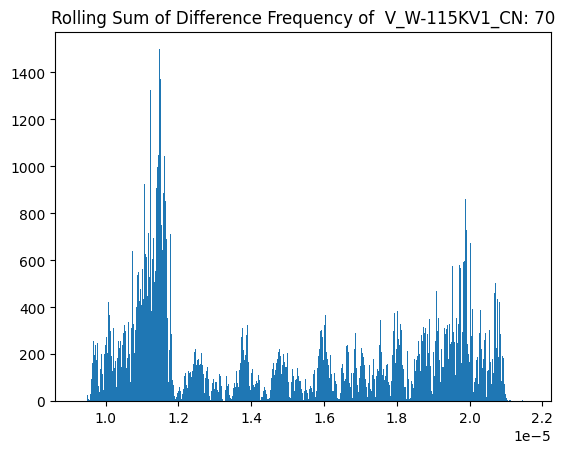

******************************************************************************


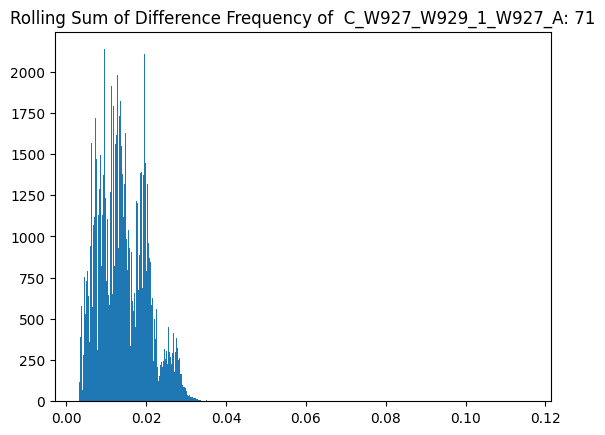

******************************************************************************


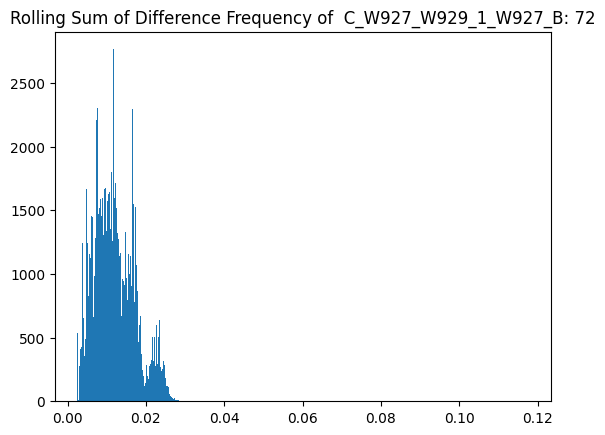

******************************************************************************


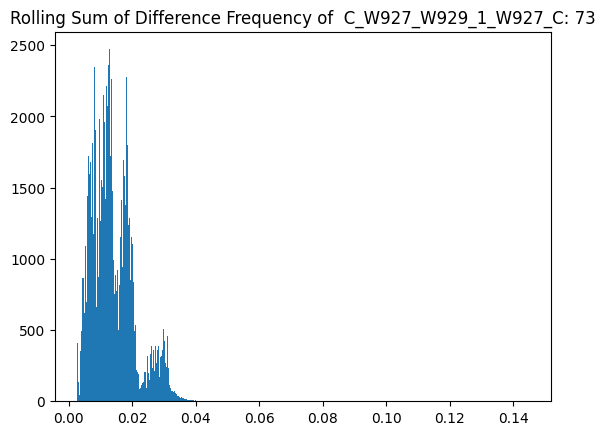

******************************************************************************


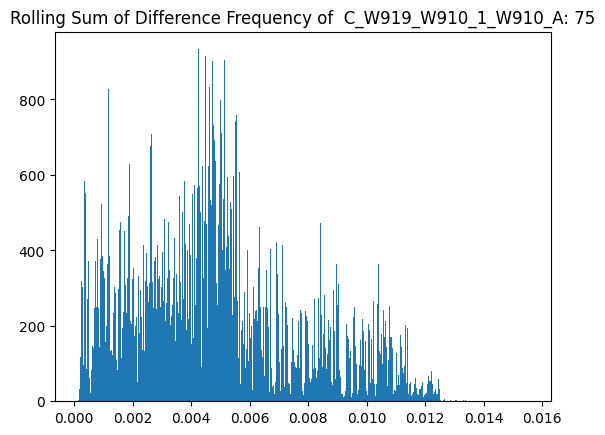

******************************************************************************


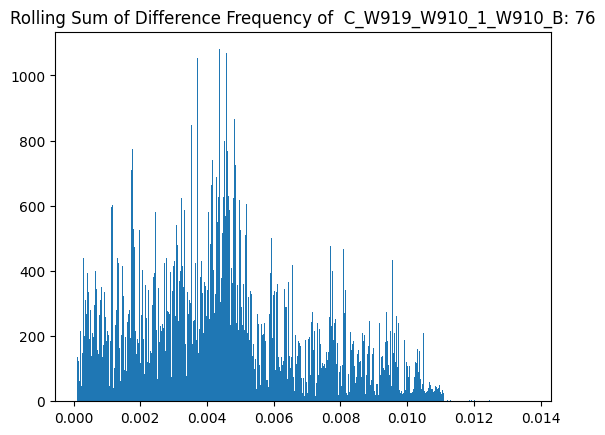

******************************************************************************


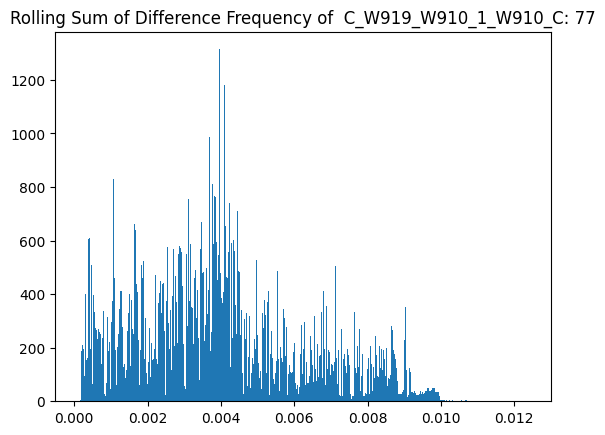

******************************************************************************


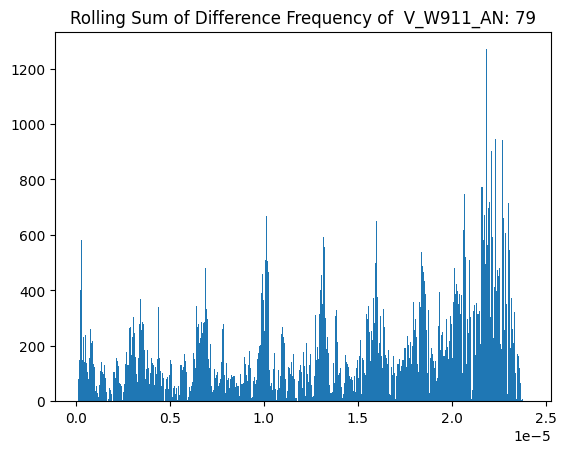

******************************************************************************


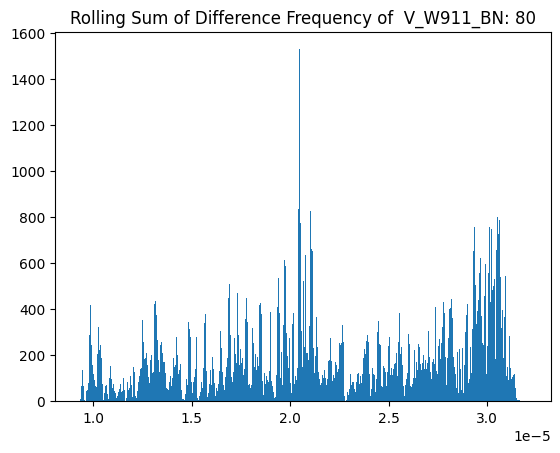

******************************************************************************


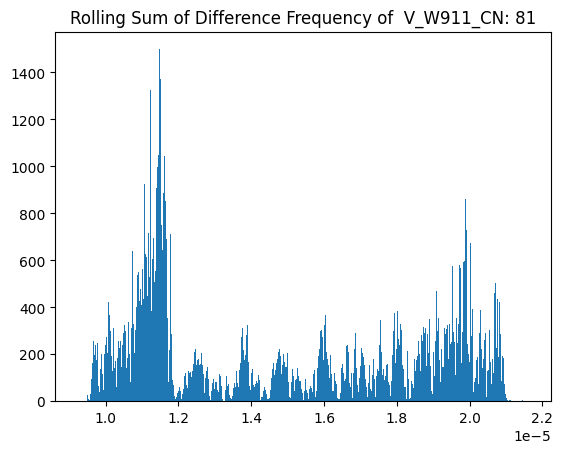

******************************************************************************


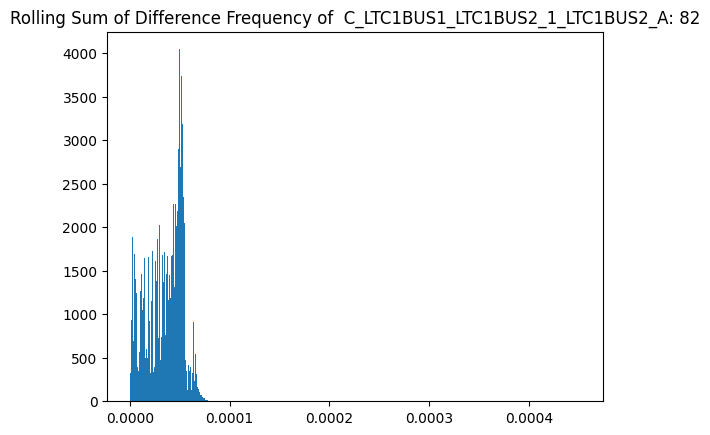

******************************************************************************


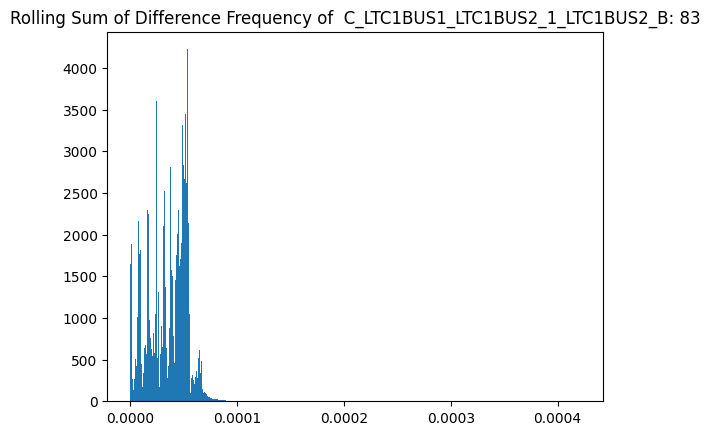

******************************************************************************


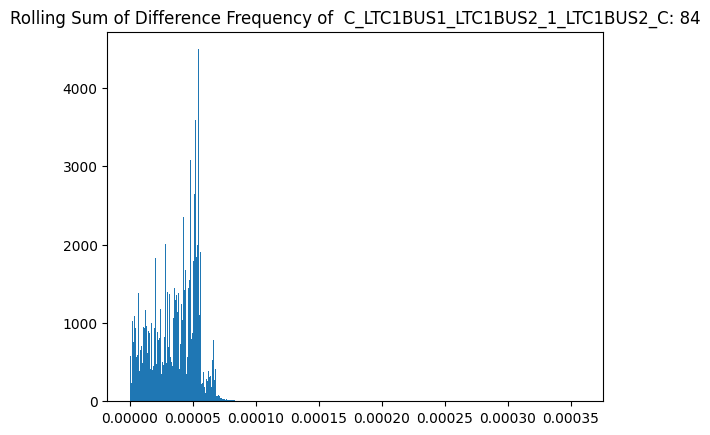

******************************************************************************


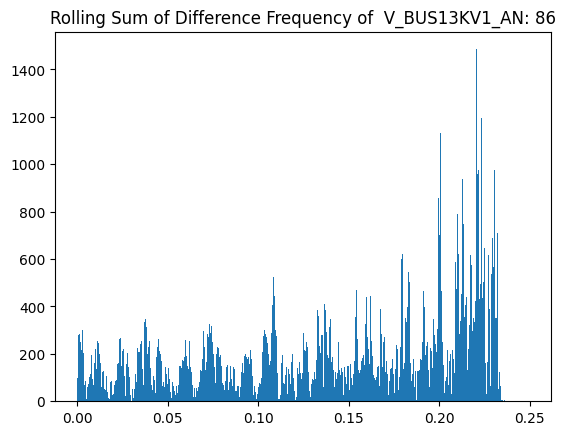

******************************************************************************


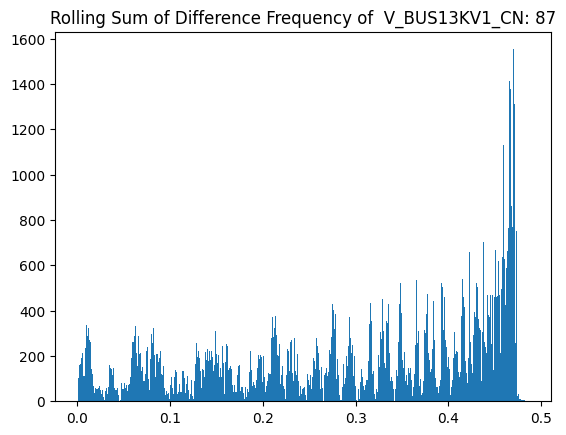

******************************************************************************


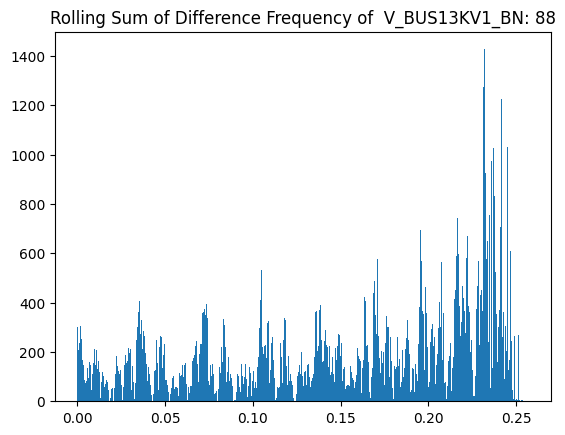

******************************************************************************


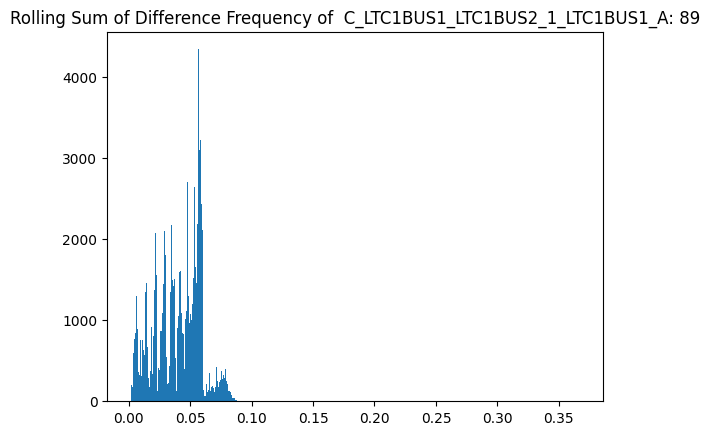

******************************************************************************


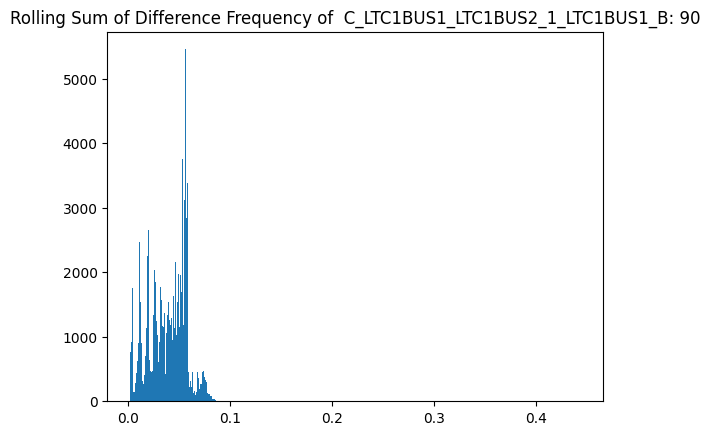

******************************************************************************


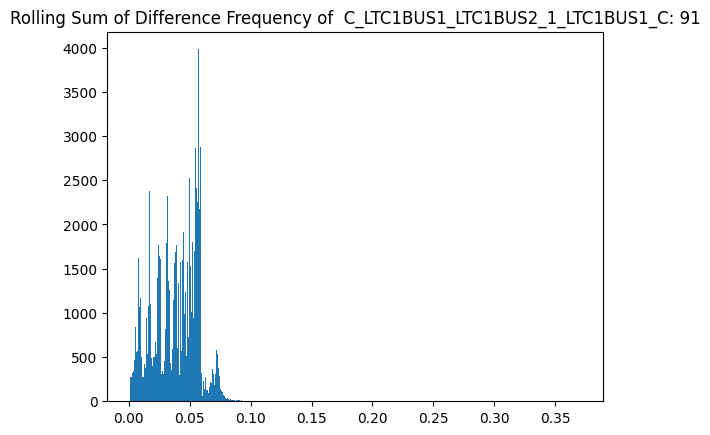

******************************************************************************


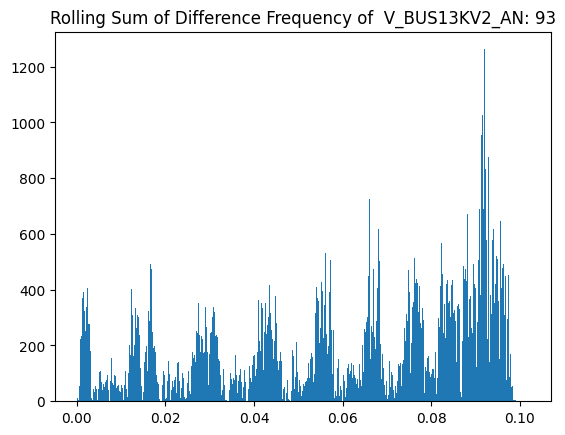

******************************************************************************


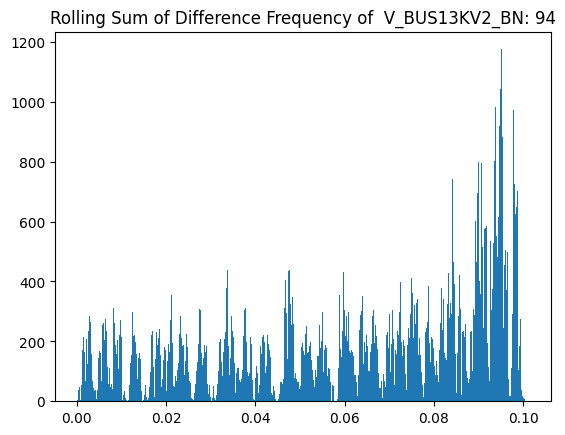

******************************************************************************


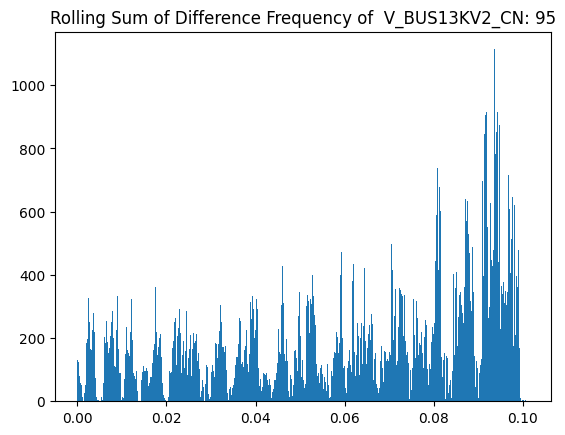

******************************************************************************


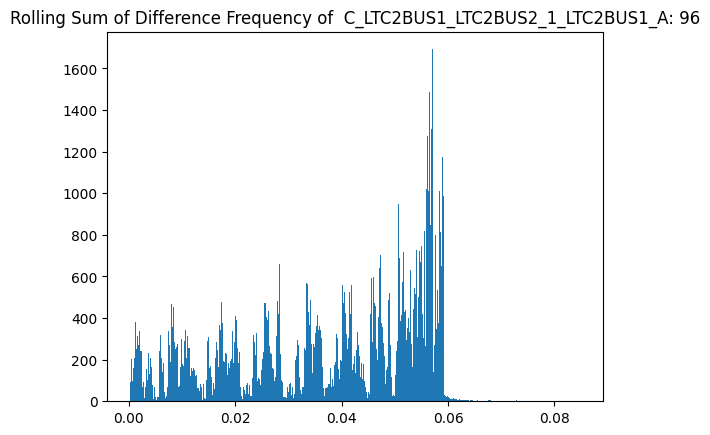

******************************************************************************


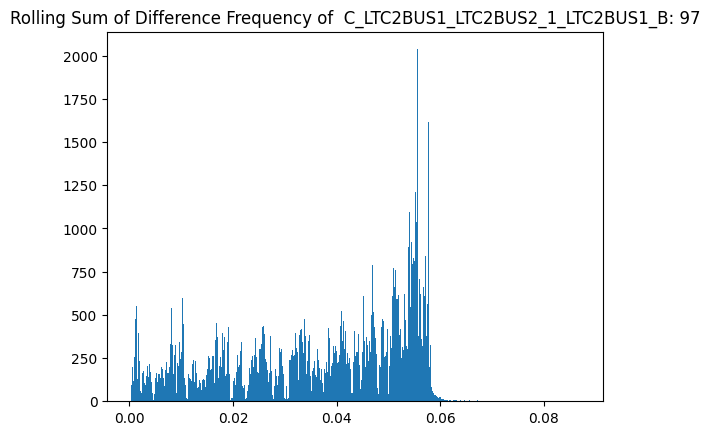

******************************************************************************


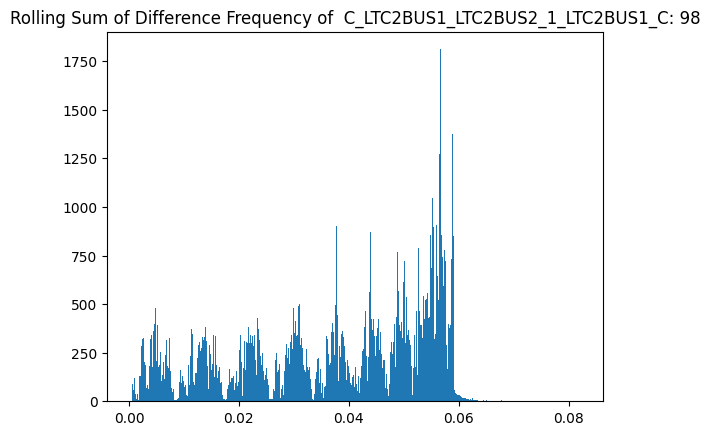

******************************************************************************


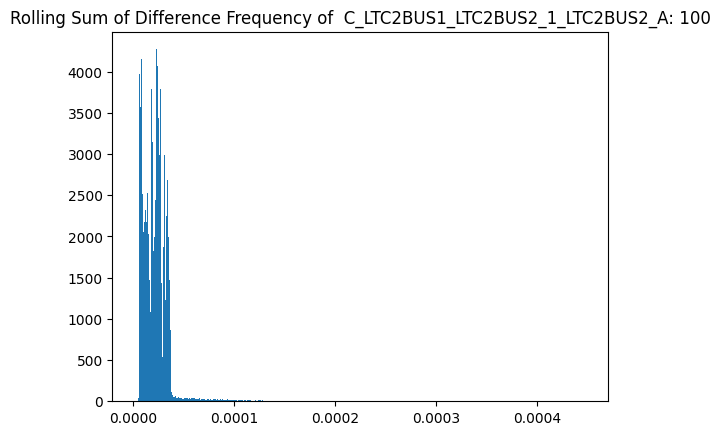

******************************************************************************


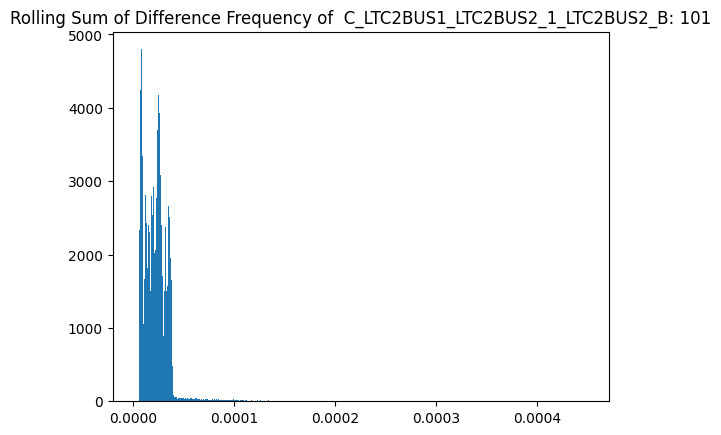

******************************************************************************


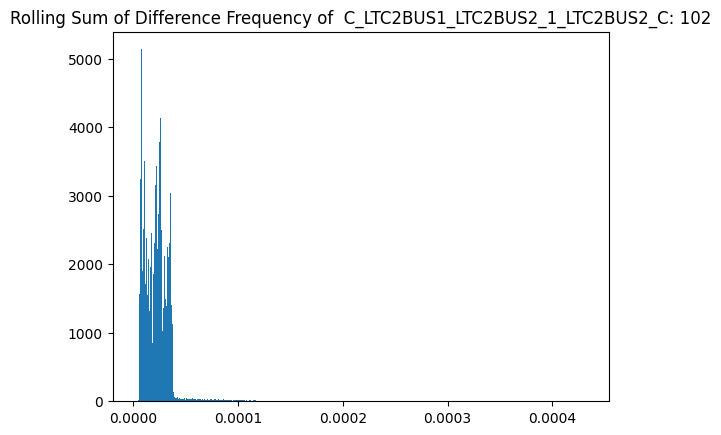

******************************************************************************


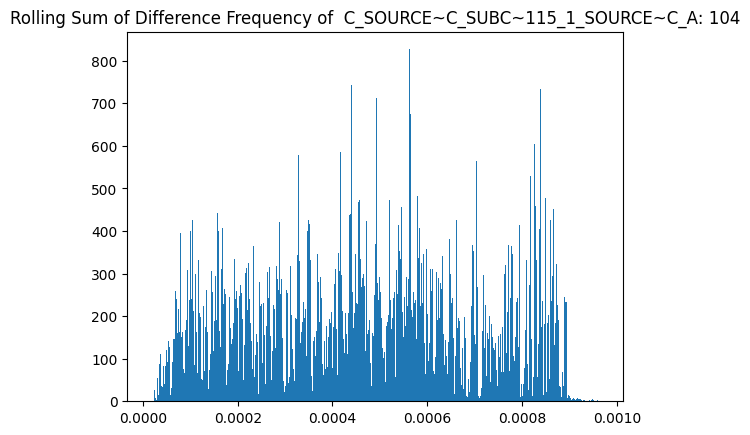

******************************************************************************


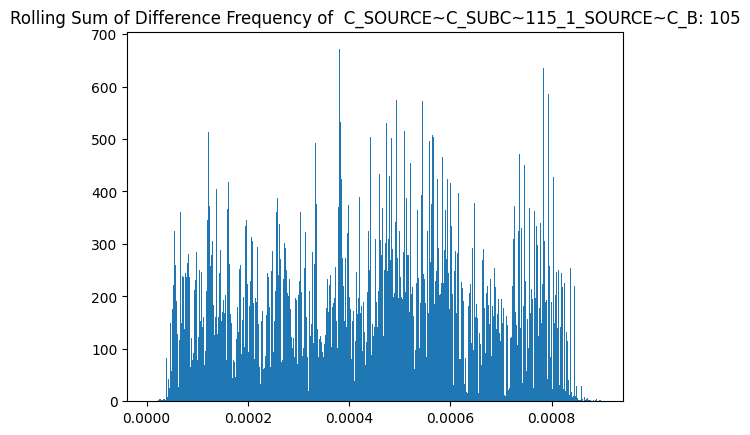

******************************************************************************


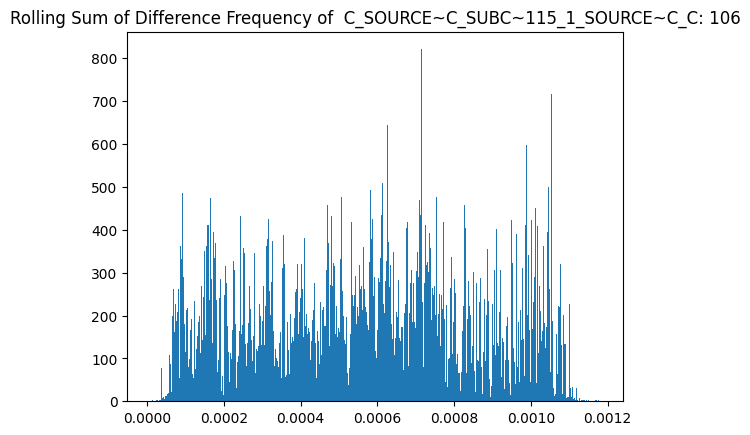

******************************************************************************


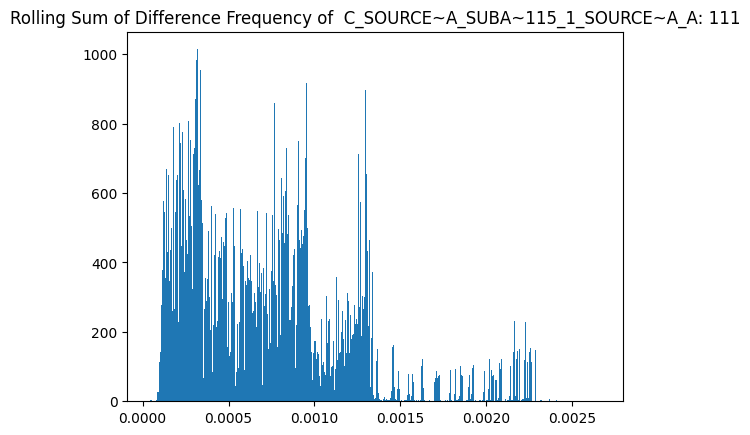

******************************************************************************


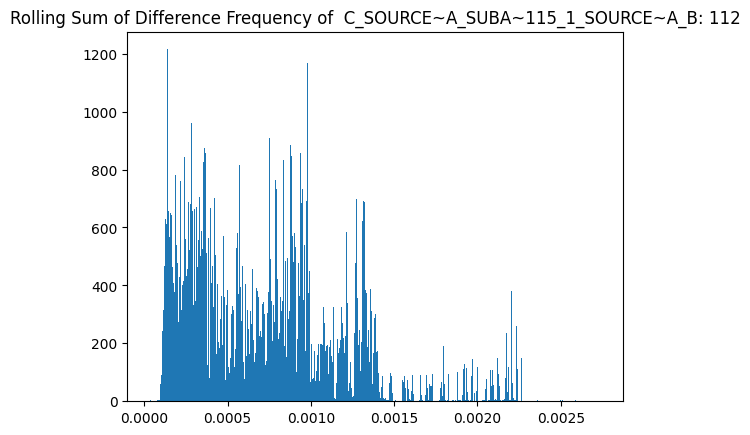

******************************************************************************


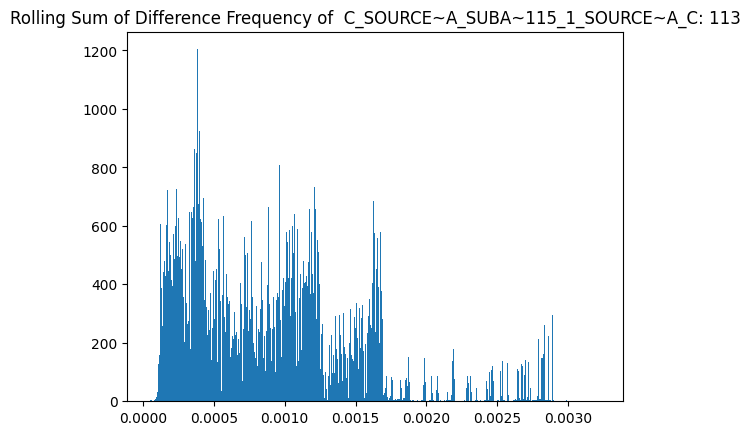

******************************************************************************


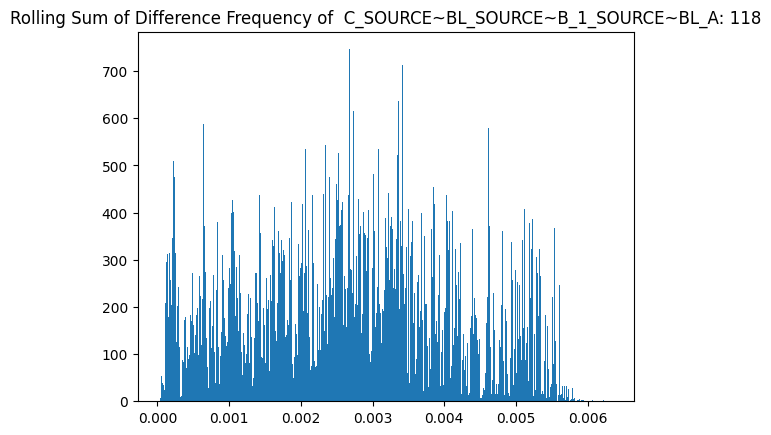

******************************************************************************


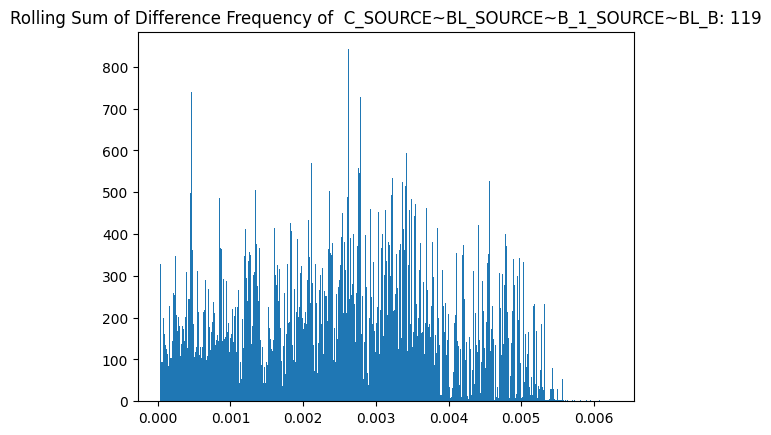

******************************************************************************


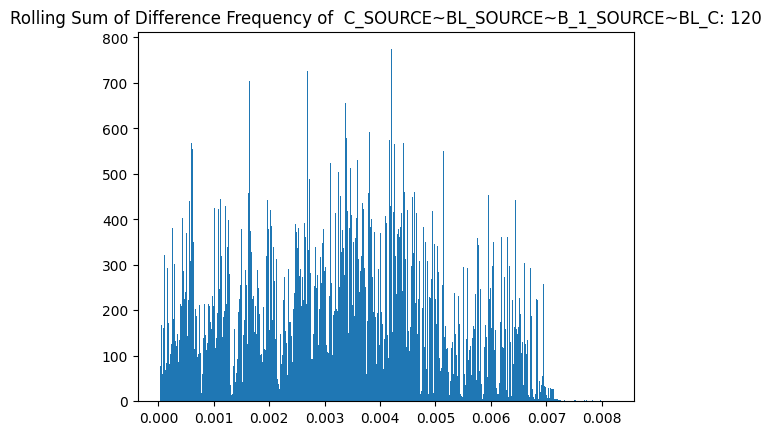

******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
****************************************************

In [10]:
window = 350
w = 1

var_fn = var_pair
thresholds_var, var_multi_list = get_threshold_stat_only(data, var_fn, cols,
              window=window, w=w, adj_list=adj_list, quantile=1, axis=1, stat_list=None, plot=True, collate_fn="sum")
thresholds_var_99, var_multi_list = get_threshold_stat_only(data, var_fn, cols,
              window=window, w=w, adj_list=adj_list, quantile=0.99, axis=1, stat_list=var_multi_list, collate_fn="sum")
thresholds_var_95, var_multi_list = get_threshold_stat_only(data, var_fn, cols,
              window=window, w=w, adj_list=adj_list, quantile=0.95, axis=1, stat_list=var_multi_list, collate_fn="sum")

In [11]:
len(thresholds_var_95)

96

In [12]:
# with open("models/" + "thresholds_corr_A.npy", 'wb') as f:
#     np.save(f, thresholds_corr)
# with open("models/" + "thresholds_corr_99_A.npy", 'wb') as f:
#     np.save(f, thresholds_corr_99)
# with open("models/" + "thresholds_corr_95_A.npy", 'wb') as f:
#     np.save(f, thresholds_corr_95)

# with open("models/" + "thresholds_var_A.npy", 'wb') as f:
#     np.save(f, thresholds_var)
# with open("models/" + "thresholds_var_99_A.npy", 'wb') as f:
#     np.save(f, thresholds_var_99)
# with open("models/" + "thresholds_var_95_A.npy", 'wb') as f:
#     np.save(f, thresholds_var_95)

In [13]:
with open("models/" + "thresholds_corr_A.npy", 'rb') as f:
    thresholds_corr = np.load(f)
with open("models/" + "thresholds_corr_99_A.npy", 'rb') as f:
    thresholds_corr_99 = np.load(f)
with open("models/" + "thresholds_corr_95_A.npy", 'rb') as f:
    thresholds_corr_95 = np.load(f)

with open("models/" + "thresholds_var_A.npy", 'rb') as f:
    thresholds_var = np.load(f)
with open("models/" + "thresholds_var_99_A.npy", 'rb') as f:
    thresholds_var_99 = np.load(f)
with open("models/" + "thresholds_var_95_A.npy", 'rb') as f:
    thresholds_var_95 = np.load(f)

FileNotFoundError: ignored

### Testing Data

In [14]:
data_dir = "../Data/Data_Power/Aug2023Data/"
test_path = "Event 4.CSV"
df_test = pd.read_csv("/content/drive/MyDrive/Event 4N.CSV", skiprows=[0,1,2,4])

df_test

,Time,C_W738_W737_2_W737_A,C_W738_W737_2_W737_B,C_W738_W737_2_W737_C,C_W738_W737_2_W737_N,V_W738_AN,V_W738_BN,V_W738_CN,C_W747_W748_2_W747_A,C_W747_W748_2_W747_B,...,V_SOURCE-A_AN,V_SOURCE-A_BN,V_SOURCE-A_CN,C_SOURCE~BL_SOURCE~B_1_SOURCE~BL_A,C_SOURCE~BL_SOURCE~B_1_SOURCE~BL_B,C_SOURCE~BL_SOURCE~B_1_SOURCE~BL_C,C_SOURCE~BL_SOURCE~B_1_SOURCE~BL_N,V_SOURCE-BL_AN,V_SOURCE-BL_BN,V_SOURCE-BL_CN
0,0,0.001789,0.002054,0.004035,-0.000020,0.148158,0.127625,0.075987,0.003721,-0.001659,...,0.927593,-0.703249,-0.719288,0.002209,-0.000666,0.001731,0.000053,1.686289,-1.712977,-1.708608
1,208,0.001789,0.002054,0.004035,-0.000020,0.148158,0.127625,0.075987,0.003721,-0.001659,...,76764.710000,-33655.210000,-41529.950000,230.466800,-108.023300,-128.021700,3.067799,76763.120000,-33655.290000,-41528.560000
2,417,0.735900,-0.033837,-0.727117,0.013513,195.290700,8.624437,-201.431300,0.767495,-0.031163,...,90973.690000,-35219.500000,-55234.260000,264.724700,-111.345300,-162.266000,5.679017,90974.350000,-35219.760000,-55232.390000
3,625,20.512150,-0.392749,-20.760670,0.259912,4755.236000,236.268200,-4979.199000,22.060590,-0.038539,...,91933.620000,-29716.290000,-62277.850000,263.986100,-95.315260,-177.941700,6.235758,91936.770000,-29716.400000,-62279.880000
4,833,68.175680,3.106635,-72.555460,0.436005,10822.790000,1045.943000,-11863.060000,76.573980,4.364873,...,90468.290000,-22871.400000,-67844.650000,255.996100,-75.519380,-189.109500,5.962640,90704.320000,-22984.300000,-67967.020000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96000,19999872,248.883500,-86.692930,-162.175200,-0.004861,10469.200000,-1303.779000,-9165.100000,184.898700,-48.918630,...,94555.620000,-51622.290000,-43015.850000,38.997370,21.948360,-61.343400,0.312038,94477.830000,-51691.770000,-42864.680000
96001,20000080,244.532500,-67.715510,-176.700700,-0.023235,10081.940000,-414.446000,-9667.895000,180.346900,-34.218460,...,94657.370000,-45246.390000,-49497.290000,34.394340,26.834710,-61.383330,0.143125,94588.610000,-45323.100000,-49344.490000
96002,20000289,238.686500,-48.343280,-190.124700,-0.041279,9632.072000,476.657100,-10110.340000,174.684200,-19.326520,...,94175.710000,-38588.510000,-55671.820000,29.567510,31.567270,-61.050560,-0.026838,94117.790000,-38677.540000,-55519.690000
96003,20000497,231.372200,-28.683920,-202.369000,-0.058938,9122.629000,1364.928000,-10489.990000,167.956800,-4.331313,...,93110.630000,-31696.140000,-61502.990000,24.561630,36.124050,-60.353960,-0.197012,93065.360000,-31793.140000,-61352.210000


In [15]:
data_test = preprocess(df_test, time=0.25e6)
cols = data_test.columns

data_test

,C_W738_W737_2_W737_A,C_W738_W737_2_W737_B,C_W738_W737_2_W737_C,C_W738_W737_2_W737_N,V_W738_AN,V_W738_BN,V_W738_CN,C_W747_W748_2_W747_A,C_W747_W748_2_W747_B,C_W747_W748_2_W747_C,...,V_SOURCE-A_AN,V_SOURCE-A_BN,V_SOURCE-A_CN,C_SOURCE~BL_SOURCE~B_1_SOURCE~BL_A,C_SOURCE~BL_SOURCE~B_1_SOURCE~BL_B,C_SOURCE~BL_SOURCE~B_1_SOURCE~BL_C,C_SOURCE~BL_SOURCE~B_1_SOURCE~BL_N,V_SOURCE-BL_AN,V_SOURCE-BL_BN,V_SOURCE-BL_CN
1201,241.3096,-55.413830,-185.7377,-0.031542,9811.672,161.2130,-9973.563,177.0295,-24.578160,-152.3945,...,94436.90,-41221.39,-53301.67,29.686870,31.72985,-61.42770,0.040601,94377.43,-41301.15,-53155.53
1202,234.4698,-35.763440,-198.4305,-0.051236,9321.225,1055.1480,-10377.550,170.6262,-9.546074,-161.0067,...,93599.08,-34412.12,-59272.62,24.733210,36.21194,-60.71335,-0.129573,93550.03,-34499.83,-59129.97
1203,226.1797,-15.906680,-209.9047,-0.070546,8773.790,1942.0030,-10716.800,163.1736,5.537642,-168.6231,...,92184.62,-27392.11,-64878.93,19.630350,40.47431,-59.63074,-0.299116,92147.95,-27487.37,-64740.96
1204,216.5110,4.039804,-220.0629,-0.089470,8172.820,2816.1130,-10989.860,154.7181,20.577100,-175.1878,...,90203.71,-20202.91,-70084.14,14.408110,44.49500,-58.18873,-0.466768,90174.65,-20308.77,-69950.42
1205,205.4993,23.959370,-228.8757,-0.107734,7521.338,3672.8740,-11194.780,145.3136,35.483800,-180.6770,...,87663.12,-12889.03,-74857.86,9.088895,48.25644,-56.40065,-0.631690,87647.44,-13002.11,-74727.20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96000,248.8835,-86.692930,-162.1752,-0.004861,10469.200,-1303.7790,-9165.100,184.8987,-48.918630,-135.9190,...,94555.62,-51622.29,-43015.85,38.997370,21.94836,-61.34340,0.312038,94477.83,-51691.77,-42864.68
96001,244.5325,-67.715510,-176.7007,-0.023235,10081.940,-414.4460,-9667.895,180.3469,-34.218460,-146.0529,...,94657.37,-45246.39,-49497.29,34.394340,26.83471,-61.38333,0.143125,94588.61,-45323.10,-49344.49
96002,238.6865,-48.343280,-190.1247,-0.041279,9632.072,476.6571,-10110.340,174.6842,-19.326520,-155.2865,...,94175.71,-38588.51,-55671.82,29.567510,31.56727,-61.05056,-0.026838,94117.79,-38677.54,-55519.69
96003,231.3722,-28.683920,-202.3690,-0.058938,9122.629,1364.9280,-10489.990,167.9568,-4.331313,-163.5402,...,93110.63,-31696.14,-61502.99,24.561630,36.12405,-60.35396,-0.197012,93065.36,-31793.14,-61352.21


In [16]:
print(all_attack_times)

all_attack_indices = set()

for start, end in all_attack_times:
    attack_indices = df_test.index[(df_test['Time'] >= start * 1e6) & (df_test['Time'] <= end * 1e6)] - 1201
    all_attack_indices.add((attack_indices[0], attack_indices[-1]))

all_attack_indice = sorted(list(all_attack_indices))

attacks_in = {}
co = 0
for key, value in attacks.items():
    attacks_in[sorted(all_attack_indice)[co][0]] = value
    co+=1

all_attack_indices

{(6.2, 7.1), (3.8, 4.5), (14.6, 15.8), (2.2, 3.5), (4.5, 5.9), (8.5, 9.4), (16.5, 17.5), (11.7, 12.7)}


{(9360, 15599),
 (17040, 20399),
 (20400, 27119),
 (28560, 32879),
 (39600, 43919),
 (54960, 59759),
 (68880, 74639),
 (78000, 82799)}

In [17]:
# cov_list = []

# for var1_index, var2_indices in adj_list.items():

#     var1_index -= 1
#     var2_indices = np.array(var2_indices) - 1

#     cov_list.append(
#         stat_diff(data_test, var1_index, var2_indices, window=window, stat_fn=covariance_pair, fn="sum")
#     )

# rsum_list_cov = np.array(cov_list)

In [18]:
import time

window = 350
w = 1

start_time = time.time()

corr_list = []

for var1_index, var2_indices in adj_list.items():

    var1_index -= 1
    var2_indices = np.array(var2_indices) - 1

    corr_list.append(
        stat_diff(data_test, var1_index, var2_indices, window=window, stat_fn=correlation_pair, fn="sum")
    )

rsum_list_corr = np.array(corr_list)



var_list = []

for var1_index, var2_indices in adj_list.items():

    var1_index -= 1
    var2_indices = np.array(var2_indices) - 1

    var_list.append(
        stat_diff(data_test, var1_index, var2_indices, window=window, stat_fn=var_pair, fn="sum")
    )

rsum_list_var = np.array(var_list)

end_time = time.time()

time_taken_total = end_time - start_time
avg_time = time_taken_total / (len(data_test) - window - w + 1)
print(time_taken_total, avg_time)
# in seconds

7.306620121002197 7.735638639975224e-05


In [19]:
total_normal = rsum_list_var.shape[1] + 1
for start, end in all_attack_indices:
    total_normal -= (end - start + 1 + 2 * (window + w - 1))
print(total_normal)

48535


In [20]:
# thresholds_cov = np.array(thresholds_cov)
# thresholds_cov_99 = np.array(thresholds_cov_99)
# thresholds_cov_95 = np.array(thresholds_cov_95)

thresholds_corr = np.array(thresholds_corr)
thresholds_corr_99 = np.array(thresholds_corr_99)
thresholds_corr_95 = np.array(thresholds_corr_95)

thresholds_var = np.array(thresholds_var)
thresholds_var_99 = np.array(thresholds_var_99)
thresholds_var_95 = np.array(thresholds_var_95)

# Covariance

In [21]:
# quantiles = [1., 0.99, 0.95]
# rsum_list = rsum_list_cov

# print("Covariance")


# for i, threshold in enumerate([thresholds_cov, thresholds_cov_99, thresholds_cov_95]):
#     print("Threshold:", quantiles[i])

#     for persistency in [1, 3, 5]:
#         print("Persistency:", persistency)


#         # each row is sensor, each col is timestep
#         violations = (rsum_list > threshold.reshape(-1, 1))
#         ADD = detection_delay(violations.any(axis=0), sorted(list(all_attack_indices)), window, w, persistency)
#         print("DD:", ADD)
#         LD = localisation_delay(violations, sorted(list(all_attack_indices)), window, w, persistency)
#         print("LD:", LD)
#         fpr = FPR(violations.any(axis=0), all_attack_indices, window, w, total_normal, persistency)
#         print("FPR", fpr)

#         fpr_l = []
#         for v in violations:
#             fpr_l.append(FPR(v, all_attack_indices, window, w, total_normal, persistency=persistency))
#         print("FPR Localisation (Mean):", np.mean(fpr_l))
#         print("####################################################")
#         print("FPR Localisation:", fpr_l)
#         print("****************************************************")
#     print("!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!")
#     print()

# Correlation

In [22]:
quantiles = [1., 0.99, 0.95]

rsum_list = rsum_list_corr

print("Correlation")

for i, threshold in enumerate([thresholds_corr, thresholds_corr_99, thresholds_corr_95]):
    print("Threshold:", quantiles[i])

    for persistency in [1, 3, 5]:
        print("Persistency:", persistency)


        # each row is sensor, each col is timestep
        violations = (rsum_list > threshold.reshape(-1, 1))
        ADD = detection_delay(violations.any(axis=0), sorted(list(all_attack_indices)), window, w, persistency)
        print("DD:", ADD)
        LD = localisation_delay(violations, sorted(list(all_attack_indices)), window, w, persistency)
        print("LD:", LD)
        fpr = FPR(violations.any(axis=0), all_attack_indices, window, w, total_normal, persistency)
        print("FPR", fpr)

        fpr_l = []
        for v in violations:
            fpr_l.append(FPR(v, all_attack_indices, window, w, total_normal, persistency=persistency))
        print("FPR Localisation (Mean):", np.mean(fpr_l), "+-", np.std(fpr_l))
        print("####################################################")
        print("FPR Localisation:", fpr_l)
        print("****************************************************")
    print("!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!")
    print()

Correlation
Threshold: 1.0
Persistency: 1
DD: [0, 0, 0, 0, 0, 0, 0, 0]
LD: [[nan, nan, nan], [0], [0, 0, 0], [nan], [nan, nan, nan, 15, 0, 0], [nan, nan, nan], [0], [nan, nan, nan, 0, 0, 0]]
FPR 0.9995673136358018
FPR Localisation (Mean): 0.03725180629386959 +- 0.15106561154733092
####################################################
FPR Localisation: [0.0, 0.0, 0.0, 0.0, 0.9993406683974121, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.120822516174228e-05, 0.0, 0.0, 0.0, 0.23288828450158652, 0.2329088886141674, 0.22130877323113693, 0.0, 0.0, 0.0, 0.0, 0.9993406683974121, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.120822516174228e-05, 0.0, 0.0, 0.0, 0.0, 0.0, 4.120822516174228e-05, 0.0, 0.0, 0.0, 0.22672765483990603, 0.2329088886141674, 0.2212675650059752, 0.0, 0.0, 2.060411258087114e-05, 0.0, 0.0, 2.060411258087114e-05, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.060411258087114e-05, 0.0, 0.0, 2.060411258087114e-05, 0.0, 0.0, 0.0, 0.0, 0.0, 2.060411258087114e-05, 0.0, 0.0, 2.060411258087114e-05, 0.0, 0.0, 0.0, 0

# Variance

In [23]:
quantiles = [1., 0.99, 0.95]
rsum_list = rsum_list_var

print("Variance")


for i, threshold in enumerate([thresholds_var, thresholds_var_99, thresholds_var_95]):
    print("Threshold:", quantiles[i])

    for persistency in [1, 3, 5]:
        print("Persistency:", persistency)


        # each row is sensor, each col is timestep
        violations = (rsum_list > threshold.reshape(-1, 1))
        ADD = detection_delay(violations.any(axis=0), sorted(list(all_attack_indices)), window, w, persistency)
        print("DD:", ADD)
        LD = localisation_delay(violations, sorted(list(all_attack_indices)), window, w, persistency)
        print("LD:", LD)
        fpr = FPR(violations.any(axis=0), all_attack_indices, window, w, total_normal, persistency)
        print("FPR", fpr)

        fpr_l = []
        for v in violations:
            fpr_l.append(FPR(v, all_attack_indices, window, w, total_normal, persistency=persistency))
        print("FPR Localisation (Mean):", np.mean(fpr_l), "+-", np.std(fpr_l))
        print("####################################################")
        print("FPR Localisation:", fpr_l)
        print("****************************************************")
    print("!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!")
    print()

Variance
Threshold: 1.0
Persistency: 1
DD: [0, 0, 0, 0, 0, 0, 0, 0]
LD: [[nan, nan, nan], [nan], [0, 0, 0], [nan], [nan, nan, nan, 0, 0, 0], [nan, nan, nan], [nan], [nan, nan, nan, 0, 0, 0]]
FPR 1.0
FPR Localisation (Mean): 0.041429290119641214 +- 0.1524243470971856
####################################################
FPR Localisation: [0.0, 0.0, 0.0, 0.1633494045411464, 1.0, 0.21663163967527918, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.2148184777681625, 0.21667284790044092, 0.20437219268966086, 0.0, 0.0, 0.0, 0.1633494045411464, 1.0, 0.21663163967527918, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.19211274570404252, 0.209626241397783, 0.17950302880454938, 0.0, 0.0, 0.0, 0.0, 0.0, 2.060411258087114e-05, 0.0, 0.0, 0.0, 6.181233774261343e-05, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.060411258087114e-05, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.060411258087114e-05, 0.0, 0.0, 0.0, 0.0, 0.0, 2.060411258087114e-05, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0

# Combined (Correlation and Variance Ratio)

In [24]:
print("Combined")

t_corr = [thresholds_corr, thresholds_corr_99, thresholds_corr_95]
# t_cov = [thresholds_cov, thresholds_cov_99, thresholds_cov_95]
t_var = [thresholds_var, thresholds_var_99, thresholds_var_95]

time_total = []

for i in range(len(t_corr)):
    print("Threshold:", quantiles[i])

    for persistency in [1, 3, 5, 10]:
        print("Persistency:", persistency)


        # each row is sensor, each col is timestep
        violations = np.logical_or((rsum_list_corr > t_corr[i].reshape(-1, 1)), (rsum_list_var > t_var[i].reshape(-1, 1)))
#         violations = np.logical_or((rsum_list_corr > t_corr[i].reshape(-1, 1)), (rsum_list_cov > t_cov[i].reshape(-1, 1)))
        ADD = detection_delay(violations.any(axis=0), sorted(list(all_attack_indices)), window, w, persistency)
        print("DD:", ADD)
        ADD = [i if i is not None else np.nan for i in ADD]
        dd_mean = np.nanmean(ADD)
#         if None in ADD:
#             dd_mean = None
#         else:
#             dd_mean = np.mean(ADD)
        print("Average DD:", dd_mean, np.nanstd(ADD))
        LD = localisation_delay(violations, sorted(list(all_attack_indices)), window, w, persistency)
        print("LD:", LD)
        lds = [ld if ld is not None else np.nan for sublist in LD for ld in sublist]
        ld_mean = np.nanmean(lds)
#         if None in lds:
#             ld_mean = None
#         else:
#             ld_mean = np.mean(lds)
        print("Average LD:", ld_mean, "+-", np.nanstd(lds))
        fpr = FPR(violations.any(axis=0), all_attack_indices, window, w, total_normal, persistency)
        print("FPR", fpr)

        fpr_l = []
        for v in violations:
            fpr_l.append(FPR(v, all_attack_indices, window, w, total_normal, persistency=persistency))
        print("FPR Localisation (Mean):", np.mean(fpr_l), "+-", np.std(fpr_l))
        print("####################################################")
        print("FPR Localisation:", fpr_l)
        print("****************************************************")
    print("!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!")
    print()

Combined
Threshold: 1.0
Persistency: 1
DD: [0, 0, 0, 0, 0, 0, 0, 0]
Average DD: 0.0 0.0
LD: [[nan, nan, nan], [0], [0, 0, 0], [nan], [nan, nan, nan, 0, 0, 0], [nan, nan, nan], [0], [nan, nan, nan, 0, 0, 0]]
Average LD: 0.0 +- 0.0
FPR 1.0
FPR Localisation (Mean): 0.0454891588027637 +- 0.1544019443946217
####################################################
FPR Localisation: [0.0, 0.0, 0.0, 0.1633494045411464, 1.0, 0.21663163967527918, 0.0, 0.0, 0.0, 0.0, 0.0, 4.120822516174228e-05, 0.0, 0.0, 0.0, 0.2329088886141674, 0.2329088886141674, 0.2329088886141674, 0.0, 0.0, 0.0, 0.1633494045411464, 1.0, 0.21663163967527918, 0.0, 0.0, 0.0, 0.0, 0.0, 4.120822516174228e-05, 0.0, 0.0, 0.0, 0.0, 0.0, 4.120822516174228e-05, 0.0, 0.0, 0.0, 0.2329088886141674, 0.2329088886141674, 0.2329088886141674, 0.0, 0.0, 2.060411258087114e-05, 0.0, 0.0, 2.060411258087114e-05, 0.0, 0.0, 0.0, 6.181233774261343e-05, 0.0, 0.0, 0.0, 0.0, 2.060411258087114e-05, 0.0, 0.0, 2.060411258087114e-05, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0

In [25]:
all_sensors =[]
for i in attacks.values():
    for a in i:
        all_sensors += a
all_sensors

[61,
 112,
 72,
 57,
 90,
 62,
 113,
 73,
 58,
 91,
 63,
 114,
 74,
 59,
 92,
 52,
 107,
 78,
 67,
 94,
 80,
 69,
 54,
 5,
 12,
 19,
 26,
 95,
 81,
 70,
 55,
 6,
 13,
 20,
 27,
 96,
 82,
 71,
 56,
 7,
 14,
 21,
 28,
 88,
 81,
 70,
 55,
 76,
 119,
 57,
 50,
 97,
 77,
 120,
 58,
 51,
 98,
 78,
 121,
 59,
 52,
 99,
 80,
 69,
 54,
 94,
 87,
 81,
 70,
 55,
 95,
 88,
 82,
 71,
 56,
 96,
 89,
 29,
 8,
 36,
 30,
 9,
 37,
 31,
 10,
 38,
 38,
 10,
 31,
 15,
 101,
 43,
 16,
 102,
 44,
 17,
 103,
 45,
 19,
 94,
 47,
 20,
 95,
 48,
 21,
 96,
 49]

In [26]:
attack_i = {}
for key, items in attacks_in.items():
  attack_i[key] = []
  for i in items:
    attack_i[key] += i
attack_i

{9360: [61, 112, 72, 57, 90, 62, 113, 73, 58, 91, 63, 114, 74, 59, 92],
 17040: [52, 107, 78, 67],
 20400: [94,
  80,
  69,
  54,
  5,
  12,
  19,
  26,
  95,
  81,
  70,
  55,
  6,
  13,
  20,
  27,
  96,
  82,
  71,
  56,
  7,
  14,
  21,
  28],
 28560: [88, 81, 70, 55],
 39600: [76,
  119,
  57,
  50,
  97,
  77,
  120,
  58,
  51,
  98,
  78,
  121,
  59,
  52,
  99,
  80,
  69,
  54,
  94,
  87,
  81,
  70,
  55,
  95,
  88,
  82,
  71,
  56,
  96,
  89],
 54960: [29, 8, 36, 30, 9, 37, 31, 10, 38],
 68880: [38, 10, 31],
 78000: [15,
  101,
  43,
  16,
  102,
  44,
  17,
  103,
  45,
  19,
  94,
  47,
  20,
  95,
  48,
  21,
  96,
  49]}

In [27]:
# LD_cov = []
# at_neighbor = {}

# rsum_list = rsum_list_cov
# threshold = thresholds_cov_99
# t_list = t_cov
# persistency = 5

# for index, i in enumerate(rsum_list):
#     print("***********************************************************************************************")
#     attack_in = (i > threshold[index]).nonzero()

#     violations = (rsum_list > threshold.reshape(-1, 1))

#     print(f"Sensor: {things[index]} {cols[things[index]-1]}")
#     at_neighbor[things[index]] = attack_in
#     plt.title(f"{cols[things[index]-1]}: {things[index]}")

#     for t in t_list:
#         plt.axhline(t[index], color='orange')

#     plt.axhline(threshold[index], color='red')

#     if things[index] in attack_dict:
#         #if sensor is being attacked

#         # ground truth
#         attack_indices = df_test.index[
#             (df_test['Time'] >= attack_dict[things[index]][0] * 1e6) &
#             (df_test['Time'] <= attack_dict[things[index]][1] * 1e6)] - 1201

#         for start, end in all_attack_indices:

#             # if this is the attack time of the sensor, plot solid red lines
#             if attack_indices[0] == start:
#                 DD = detection_delay(violations[index], [(start, end)], window, w, persistency)[0]
#                 LD_cov.append(DD)
#                 print(f"DD = {DD}")
#                 start_w = start-window-w
#                 end_w = end+window+w-1
#                 plt.axvline(start_w, color='red')
#                 plt.axvline(end_w, color='red')

#             # otherwise, plot pink lines
#             else:
#                 start_w = start-window-w
#                 end_w = end+window+w-1
#                 plt.axvline(start_w, color='pink', alpha=0.75)
#                 plt.axvline(end_w, color='pink', alpha=0.75)

#                 start_w = start-window-w
#                 end_w = end+window+w-1
#                 for starts, ate in attack_i.items():
#                   if starts == start and things[index] in ate:
#                     DD = detection_delay(violations[index], [(start, end)], window, w, persistency)[0]
#                     LD_cov.append(DD)
#                     print(f"DD = {DD}")
#                     plt.axvline(start_w, color='orange', alpha=0.75)
#                     plt.axvline(end_w, color='orange', alpha=0.75)

#     else:
#          for start, end in all_attack_indices:
#             start_w = start-window-w
#             end_w = end+window+w-1
#             plt.axvline(start_w, color='pink', alpha=0.75)
#             plt.axvline(end_w, color='pink', alpha=0.75)
#             for starts, ate in attack_i.items():
#               if starts == start:
#                 if things[index] in ate:
#                   print(things[index])
#                   DD = detection_delay(violations[index], [(start, end)], window, w, persistency)[0]
#                   LD_cov.append(DD)
#                   print(f"DD = {DD}")
#                   plt.axvline(start_w, color='orange', alpha=0.75)
#                   plt.axvline(end_w, color='orange', alpha=0.75)

#     plt.plot(i)
#     plt.show()

# print(LD_cov)

***********************************************************************************************
Sensor: 1  C_W738_W737_2_W737_A


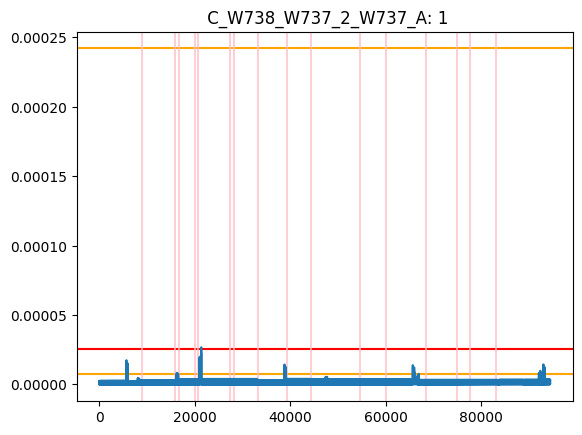

***********************************************************************************************
Sensor: 2  C_W738_W737_2_W737_B


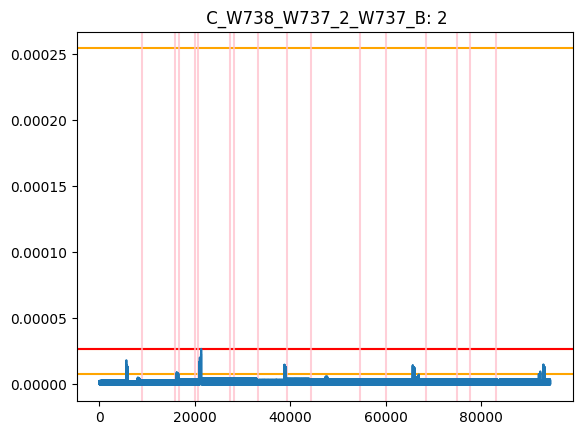

***********************************************************************************************
Sensor: 3  C_W738_W737_2_W737_C


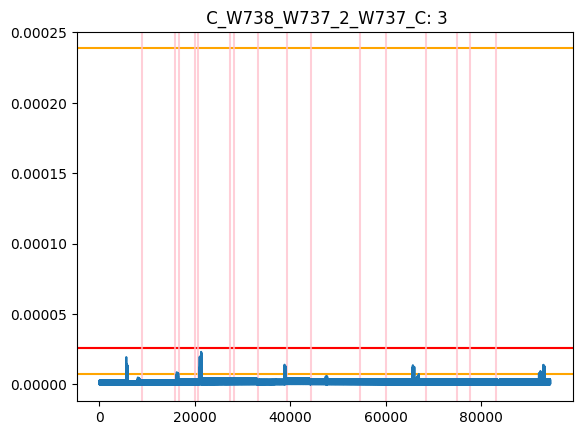

***********************************************************************************************
Sensor: 5  V_W738_AN
5
DD = 4


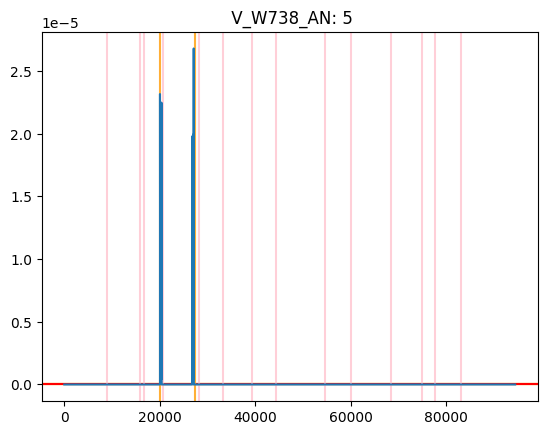

***********************************************************************************************
Sensor: 6  V_W738_BN
6
DD = 4


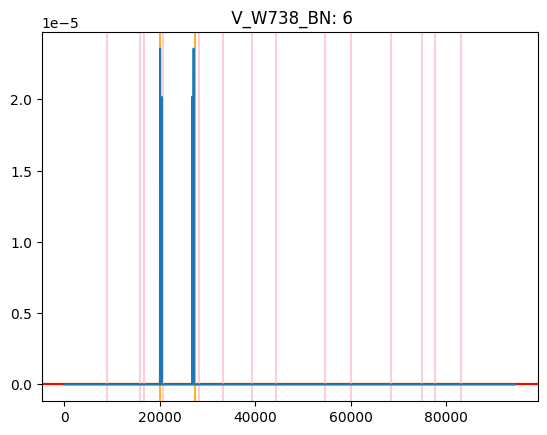

***********************************************************************************************
Sensor: 7  V_W738_CN
7
DD = 4


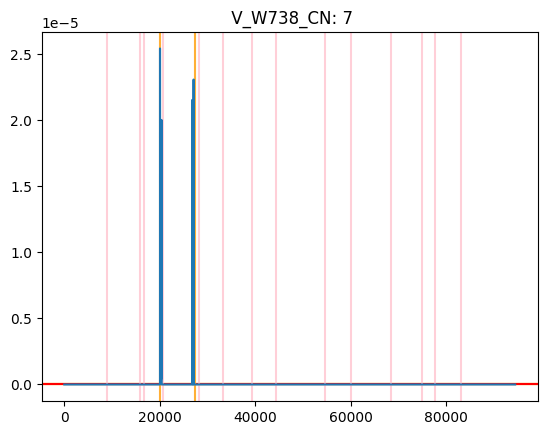

***********************************************************************************************
Sensor: 8  C_W747_W748_2_W747_A
8
DD = None


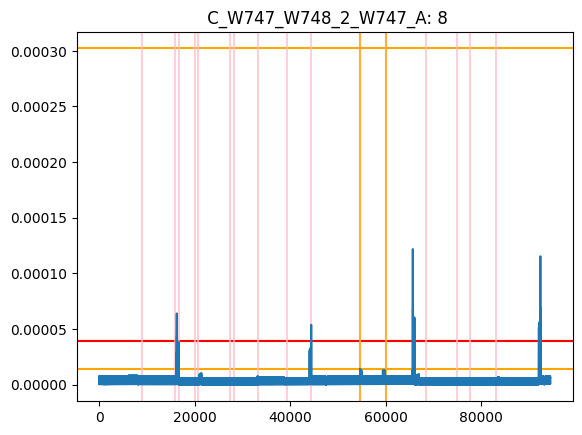

***********************************************************************************************
Sensor: 9  C_W747_W748_2_W747_B
9
DD = None


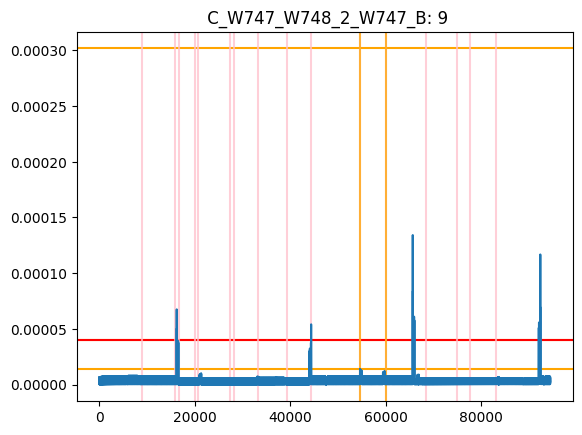

***********************************************************************************************
Sensor: 10  C_W747_W748_2_W747_C
10
DD = None
10
DD = 4


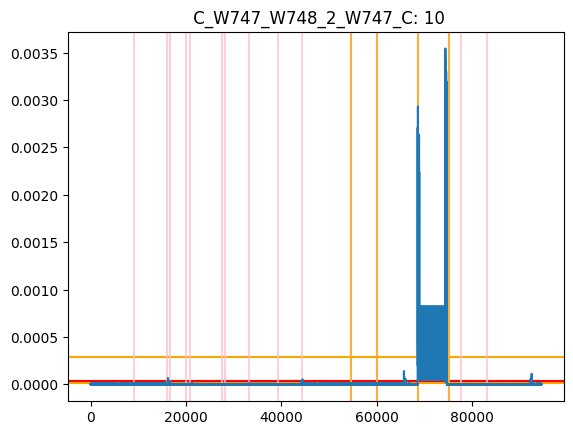

***********************************************************************************************
Sensor: 12  V_W748_AN
12
DD = 4


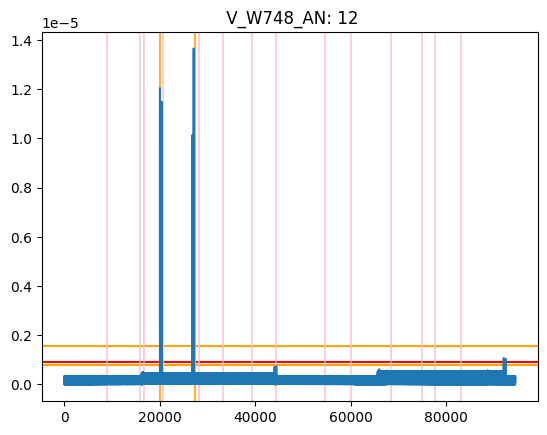

***********************************************************************************************
Sensor: 13  V_W748_BN
13
DD = 7


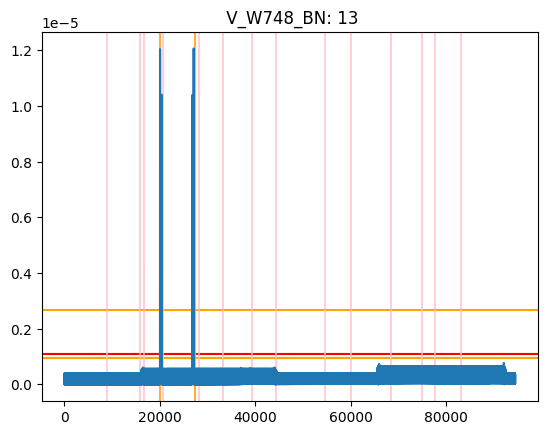

***********************************************************************************************
Sensor: 14  V_W748_CN
14
DD = 4


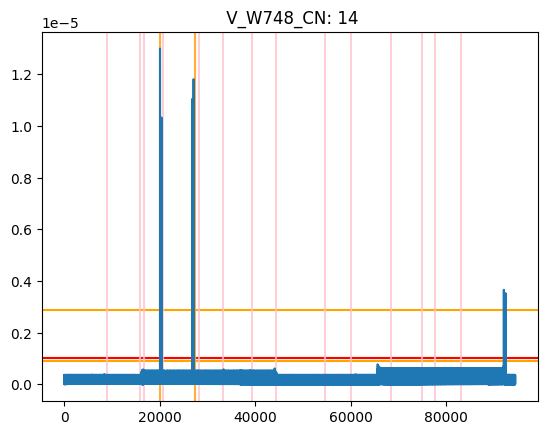

***********************************************************************************************
Sensor: 15  C_W787_W788_2_W787_A
DD = 11


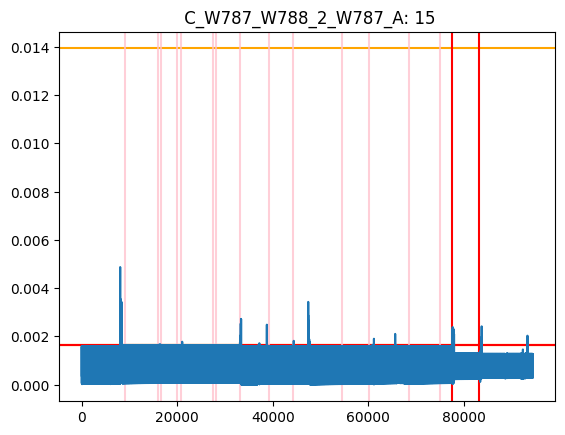

***********************************************************************************************
Sensor: 16  C_W787_W788_2_W787_B
DD = 4


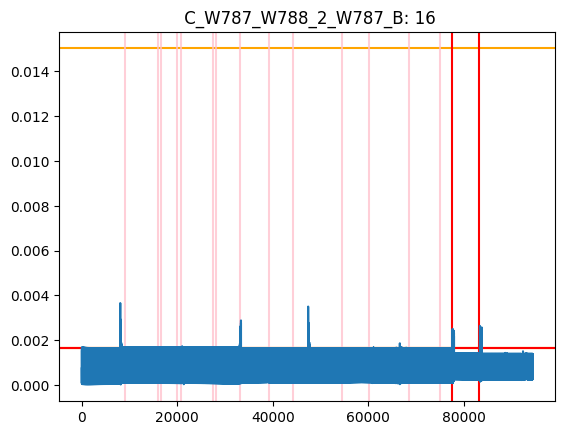

***********************************************************************************************
Sensor: 17  C_W787_W788_2_W787_C
DD = 24


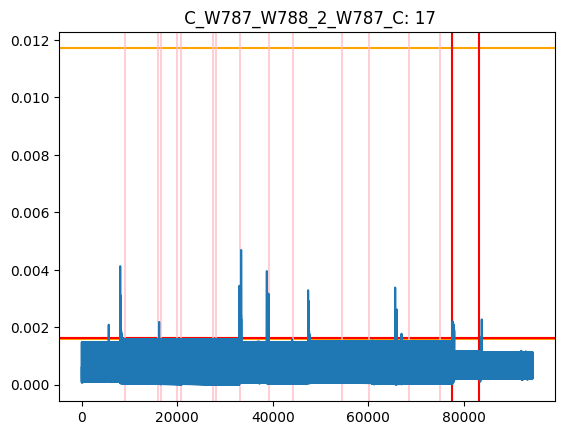

***********************************************************************************************
Sensor: 19  V_W788_AN
DD = 4
DD = 4


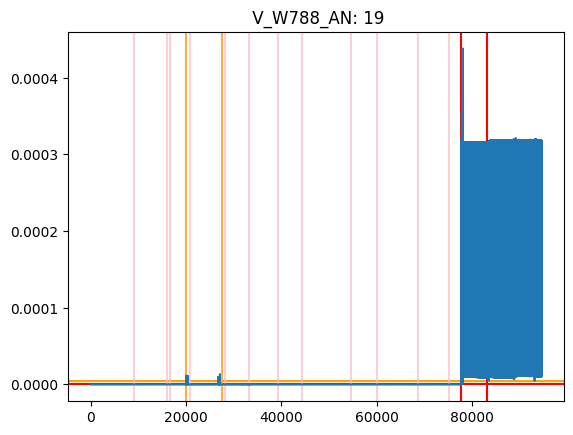

***********************************************************************************************
Sensor: 20  V_W788_BN
DD = 8
DD = 4


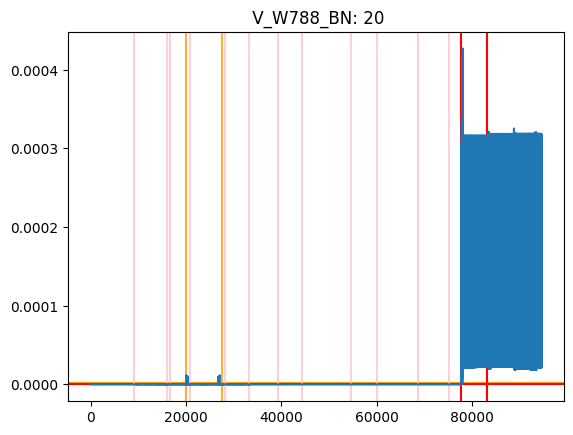

***********************************************************************************************
Sensor: 21  V_W788_CN
DD = 4
DD = 4


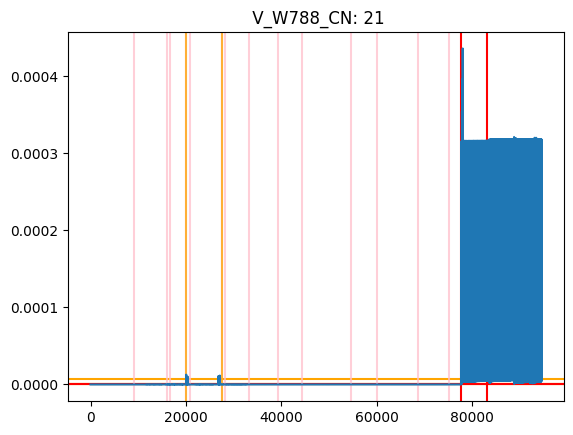

***********************************************************************************************
Sensor: 22  C_W797_W798_2_W797_A


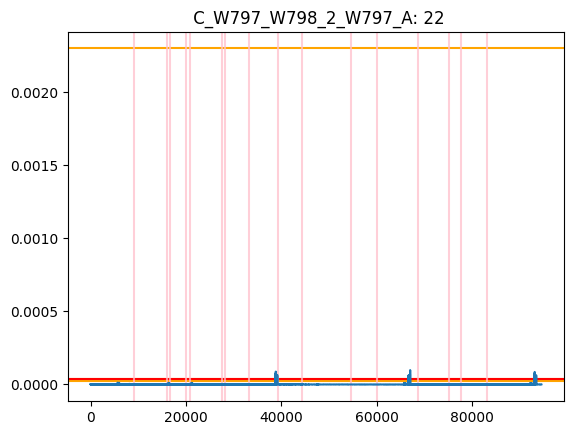

***********************************************************************************************
Sensor: 23  C_W797_W798_2_W797_B


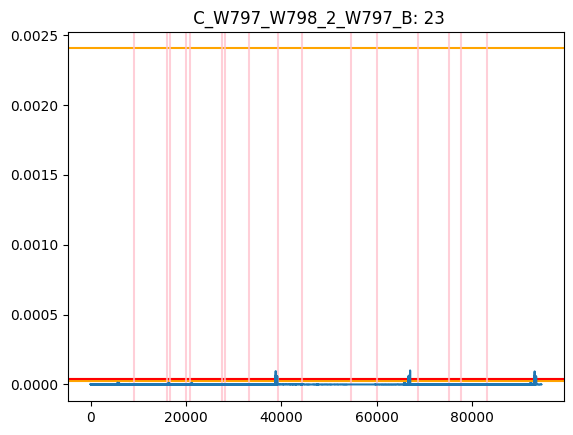

***********************************************************************************************
Sensor: 24  C_W797_W798_2_W797_C


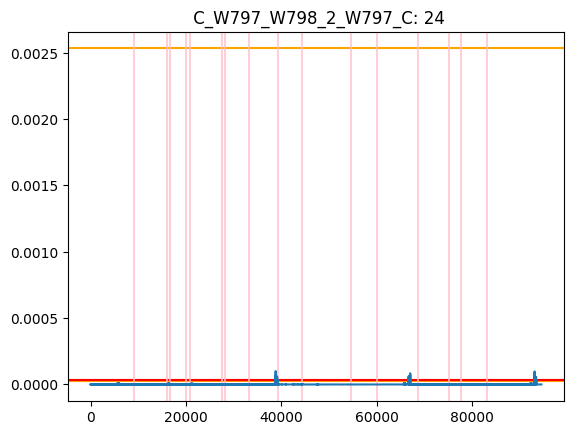

***********************************************************************************************
Sensor: 26  V_W798_AN
26
DD = 4


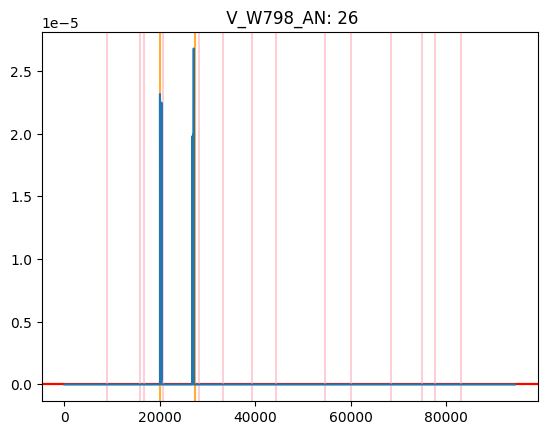

***********************************************************************************************
Sensor: 27  V_W798_BN
27
DD = 4


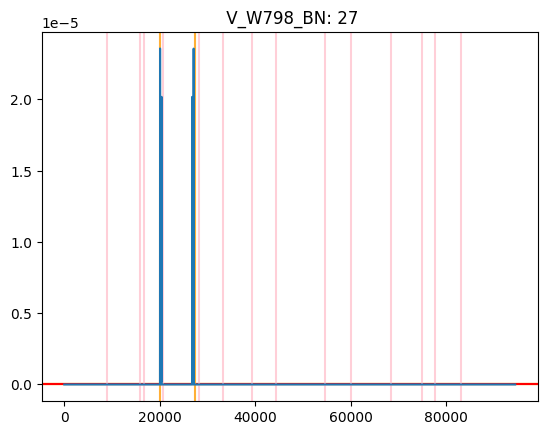

***********************************************************************************************
Sensor: 28  V_W798_CN
28
DD = 4


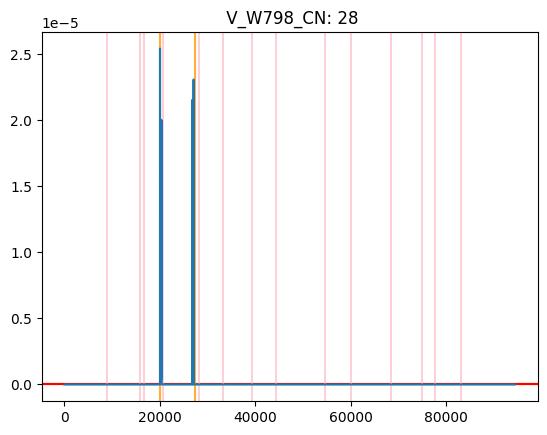

***********************************************************************************************
Sensor: 29  C_FD2B2_FD2B1_1_FD2B1_A
DD = 28


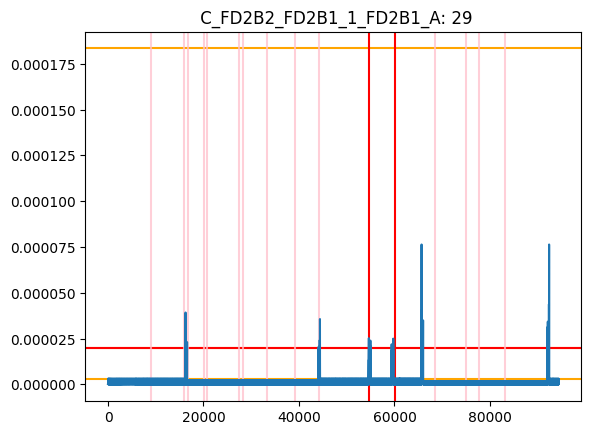

***********************************************************************************************
Sensor: 30  C_FD2B2_FD2B1_1_FD2B1_B
DD = 15


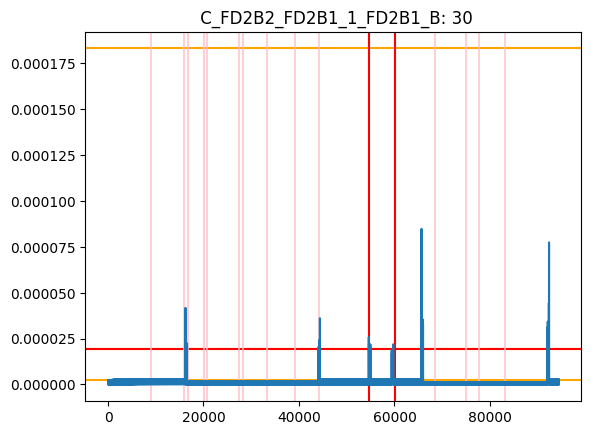

***********************************************************************************************
Sensor: 31  C_FD2B2_FD2B1_1_FD2B1_C
DD = 4
DD = 4


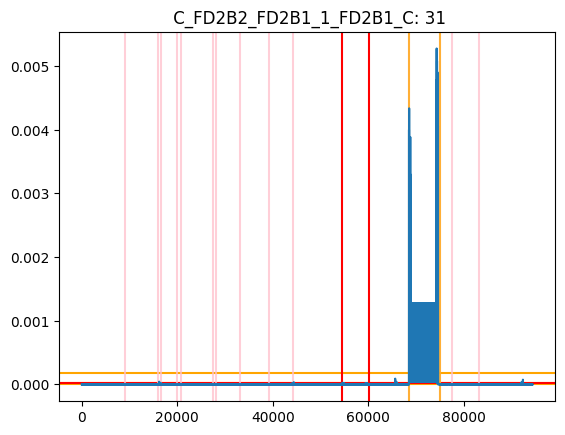

***********************************************************************************************
Sensor: 33  V_FD2B1_AN


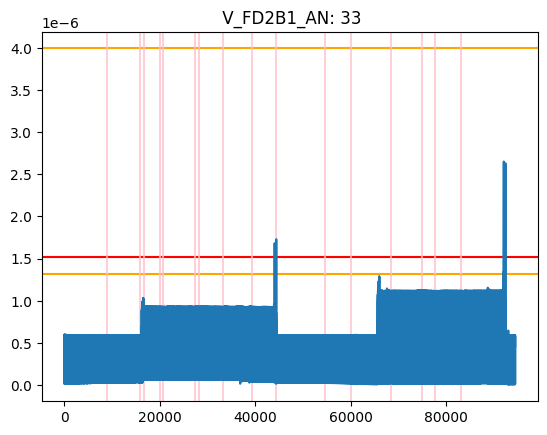

***********************************************************************************************
Sensor: 34  V_FD2B1_BN


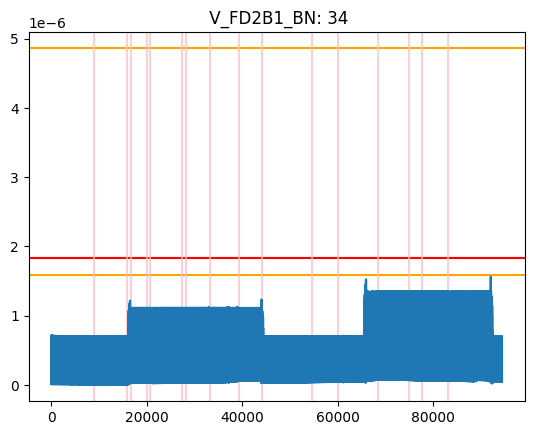

***********************************************************************************************
Sensor: 35  V_FD2B1_CN


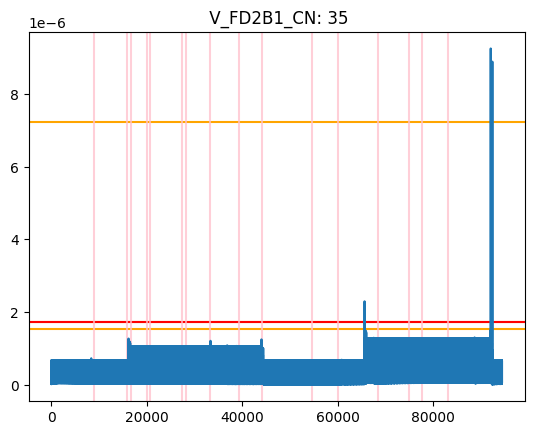

***********************************************************************************************
Sensor: 36  C_FD2B5_FD2B6_1_FD2B5_A
36
DD = None


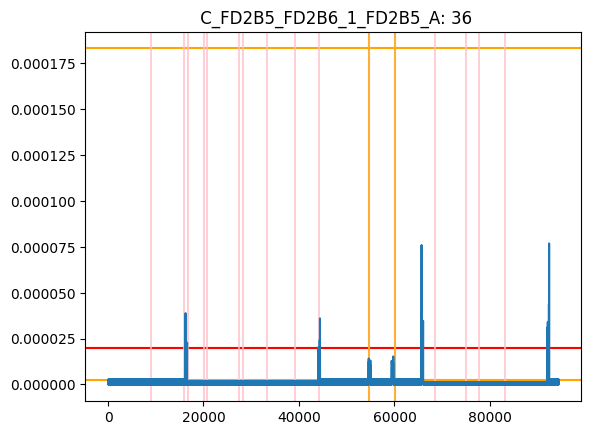

***********************************************************************************************
Sensor: 37  C_FD2B5_FD2B6_1_FD2B5_B
37
DD = None


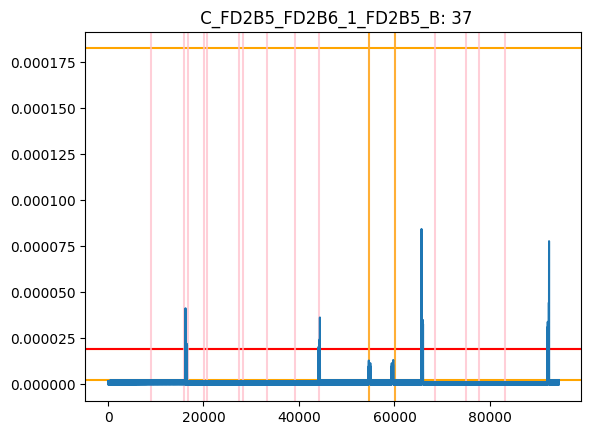

***********************************************************************************************
Sensor: 38  C_FD2B5_FD2B6_1_FD2B5_C
DD = None
DD = 4


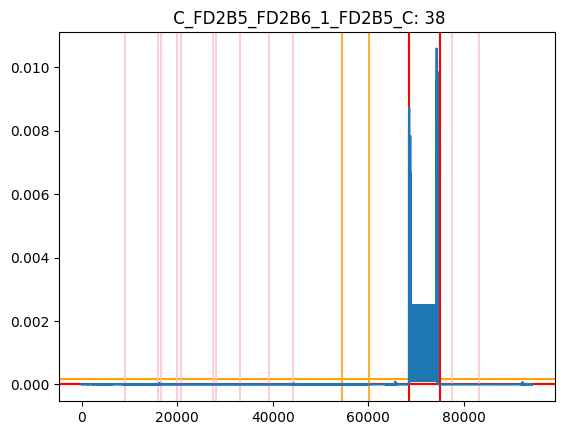

***********************************************************************************************
Sensor: 40  V_FD2B5_AN


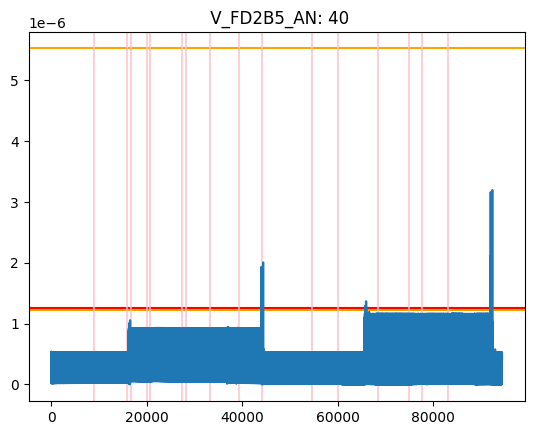

***********************************************************************************************
Sensor: 41  V_FD2B5_BN


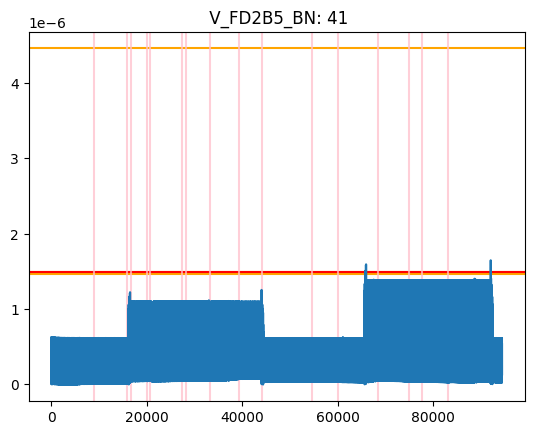

***********************************************************************************************
Sensor: 42  V_FD2B5_CN


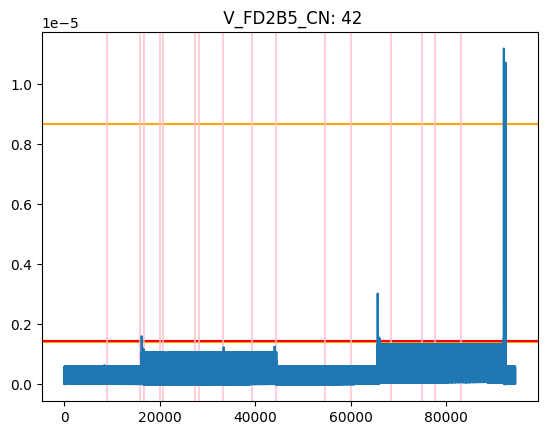

***********************************************************************************************
Sensor: 43  C_FD3B4_FD3B5_1_FD3B4_A
43
DD = 11


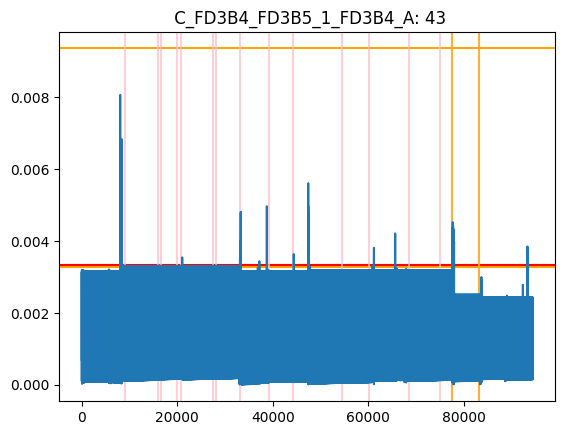

***********************************************************************************************
Sensor: 44  C_FD3B4_FD3B5_1_FD3B4_B
44
DD = 4


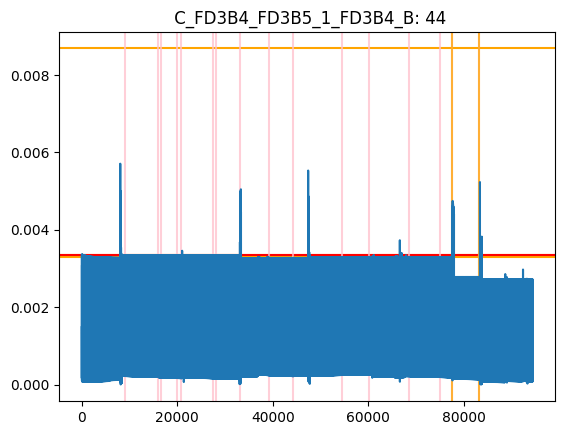

***********************************************************************************************
Sensor: 45  C_FD3B4_FD3B5_1_FD3B4_C
45
DD = 24


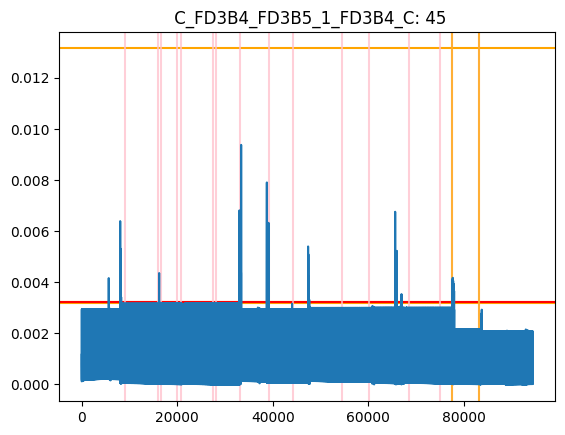

***********************************************************************************************
Sensor: 47  V_FD3B4_AN
47
DD = 4


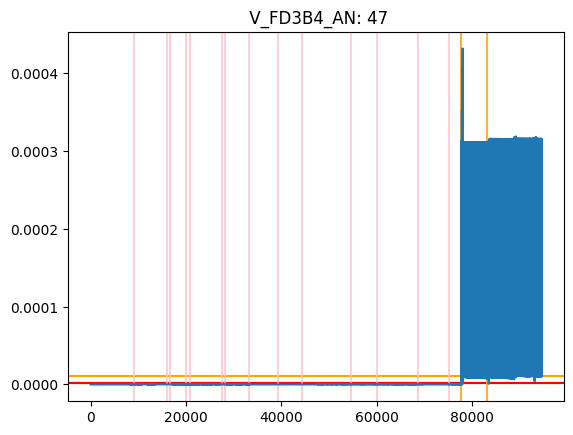

***********************************************************************************************
Sensor: 48  V_FD3B4_BN
48
DD = 4


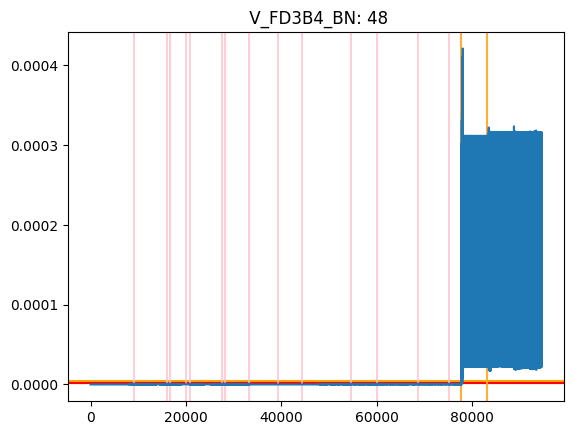

***********************************************************************************************
Sensor: 49  V_FD3B4_CN
49
DD = 4


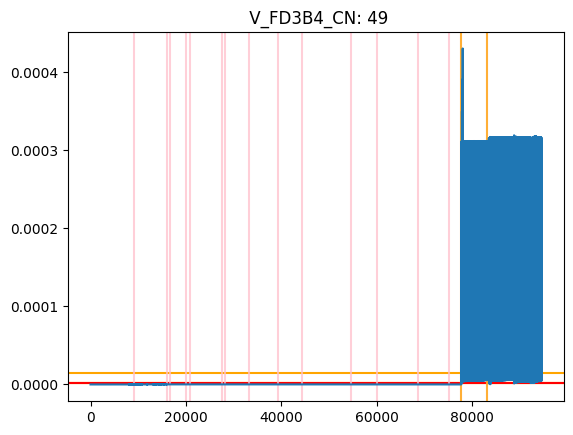

***********************************************************************************************
Sensor: 50  C_W919_W910_1_W919_A
50
DD = None


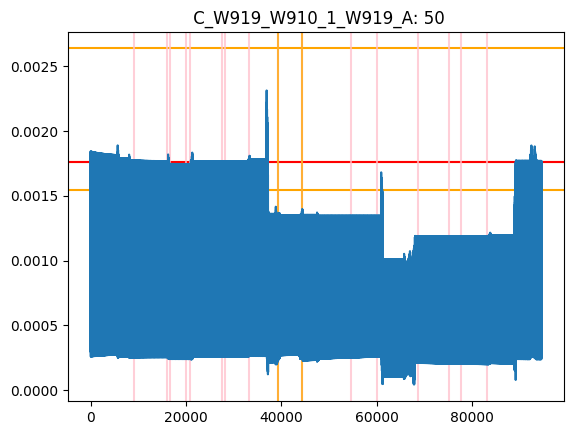

***********************************************************************************************
Sensor: 51  C_W919_W910_1_W919_B
51
DD = None


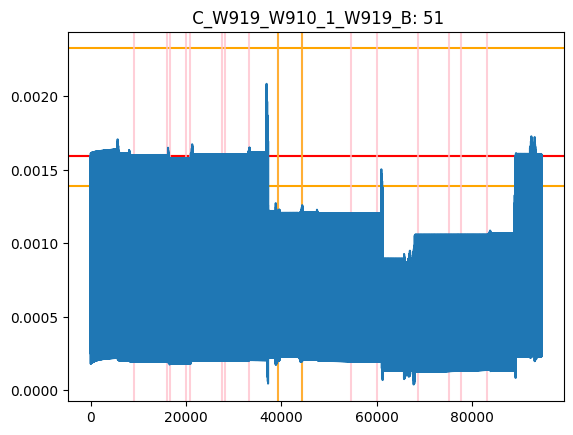

***********************************************************************************************
Sensor: 52  C_W919_W910_1_W919_C
DD = None
DD = 4


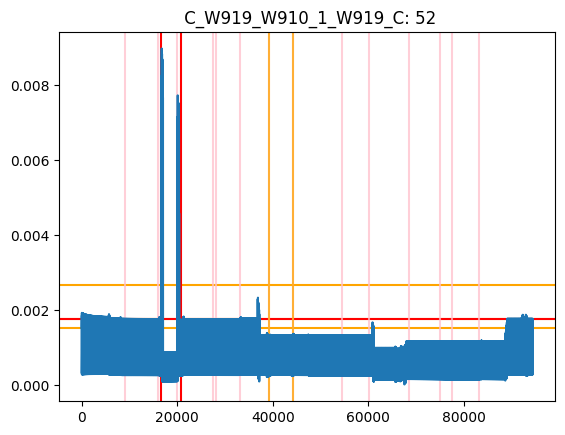

***********************************************************************************************
Sensor: 54  V_W-115KV2_AN
54
DD = 24
54
DD = 64


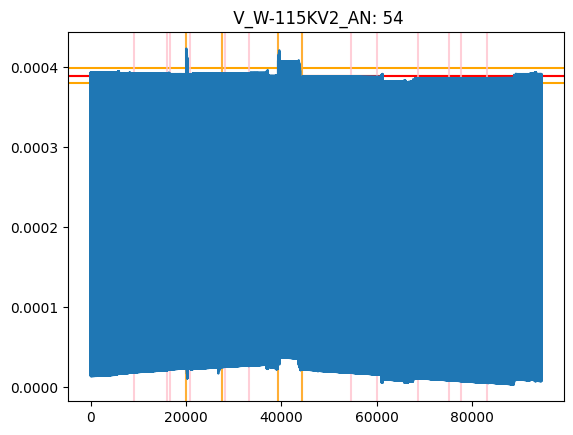

***********************************************************************************************
Sensor: 55  V_W-115KV2_BN
55
DD = None
55
DD = None
55
DD = None


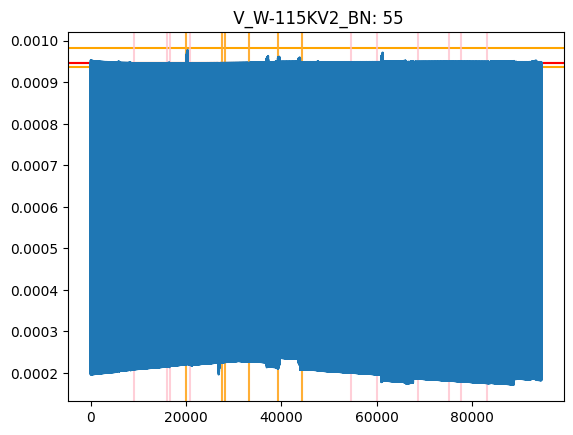

***********************************************************************************************
Sensor: 56  V_W-115KV2_CN
56
DD = 40
56
DD = 241


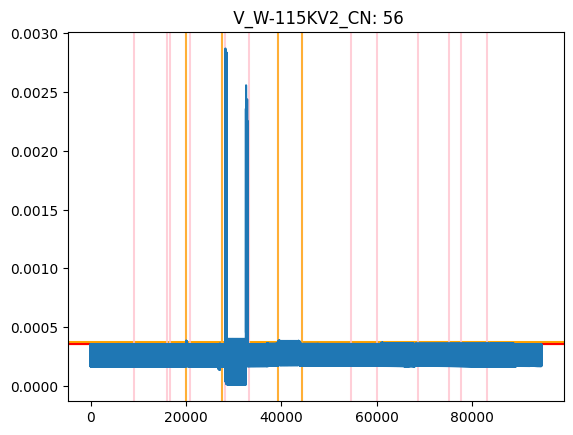

***********************************************************************************************
Sensor: 57  C_W957_W950_1_W950_A
57
DD = None
57
DD = None


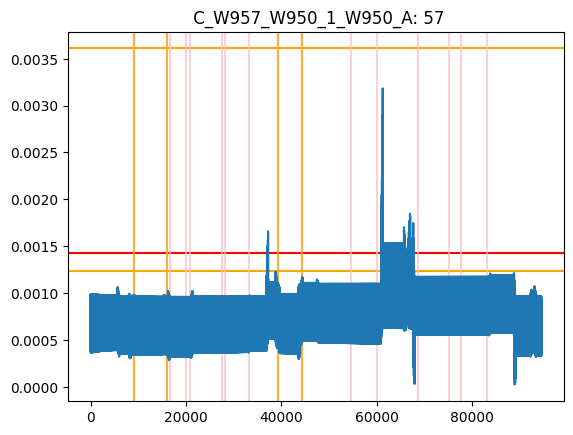

***********************************************************************************************
Sensor: 58  C_W957_W950_1_W950_B
58
DD = None
58
DD = None


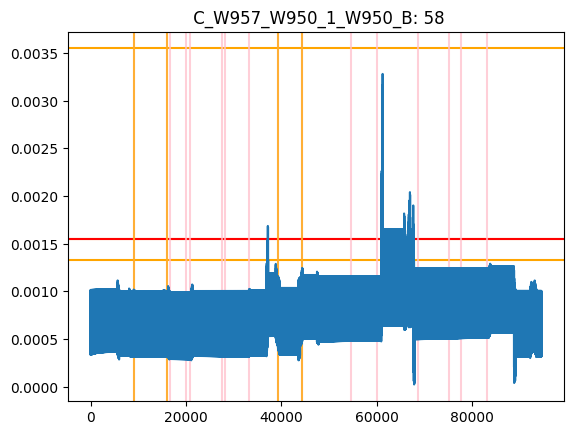

***********************************************************************************************
Sensor: 59  C_W957_W950_1_W950_C
59
DD = None
59
DD = None


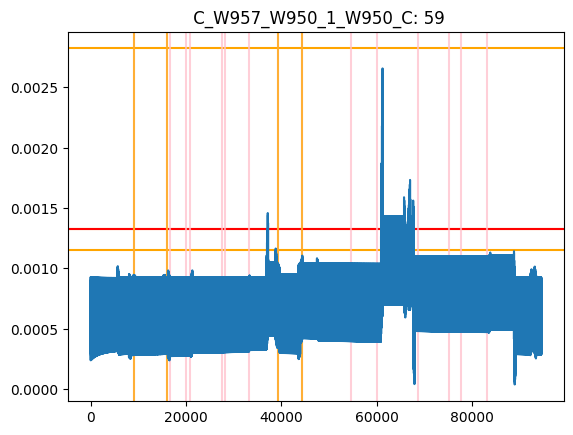

***********************************************************************************************
Sensor: 61  C_W957_W950_1_W957_A
DD = 4


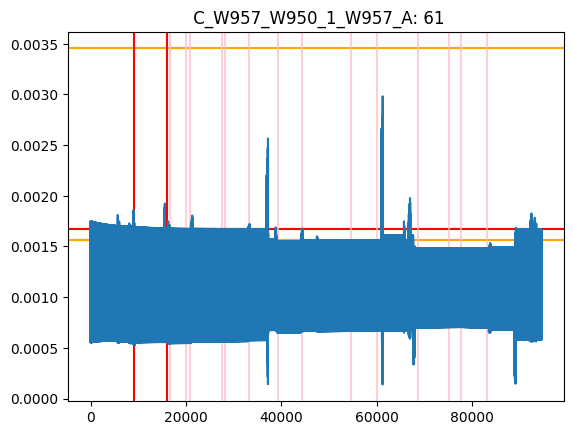

***********************************************************************************************
Sensor: 62  C_W957_W950_1_W957_B
DD = 11


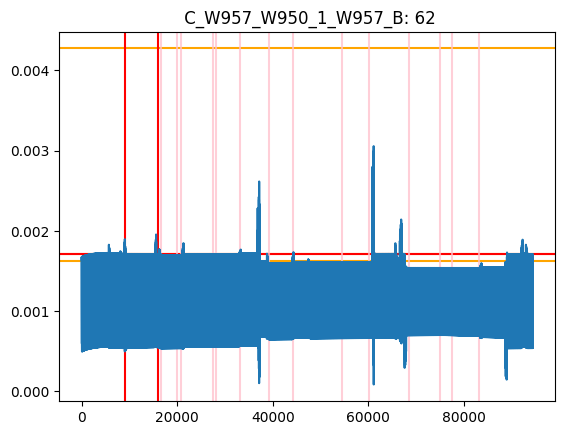

***********************************************************************************************
Sensor: 63  C_W957_W950_1_W957_C
DD = 17


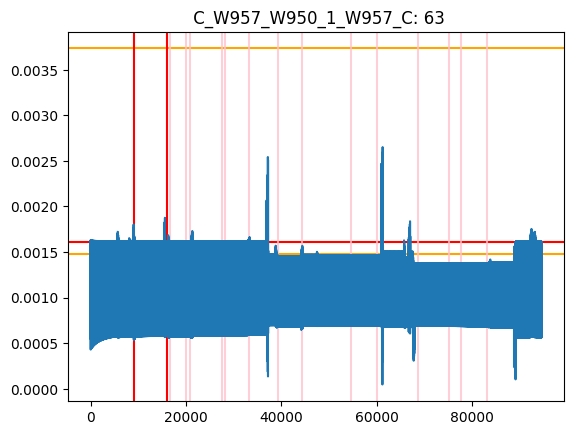

***********************************************************************************************
Sensor: 65  C_W927_W929_1_W929_A


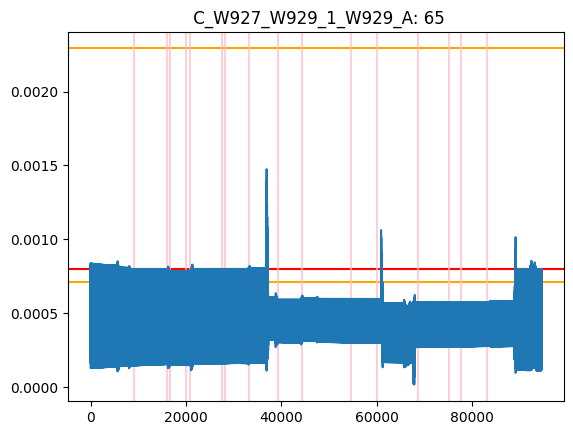

***********************************************************************************************
Sensor: 66  C_W927_W929_1_W929_B


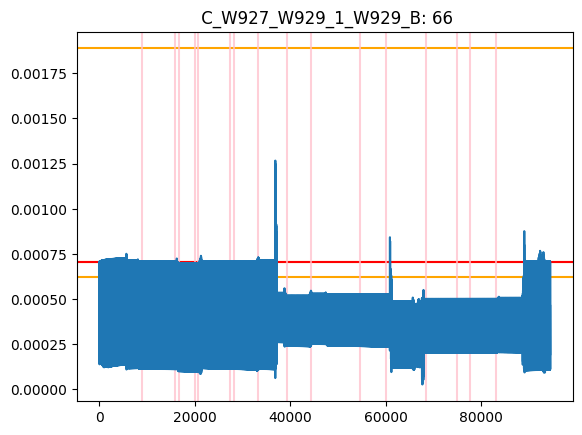

***********************************************************************************************
Sensor: 67  C_W927_W929_1_W929_C
67
DD = 4


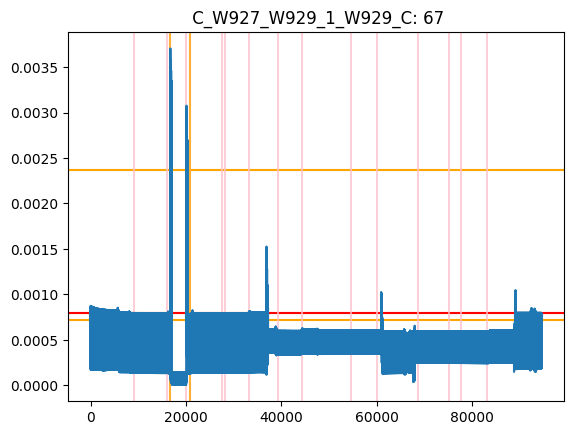

***********************************************************************************************
Sensor: 69  V_W-115KV1_AN
69
DD = 24
69
DD = 64


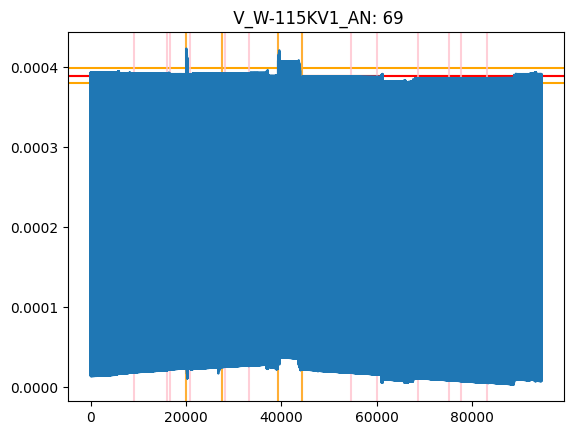

***********************************************************************************************
Sensor: 70  V_W-115KV1_BN
70
DD = None
70
DD = None
70
DD = None


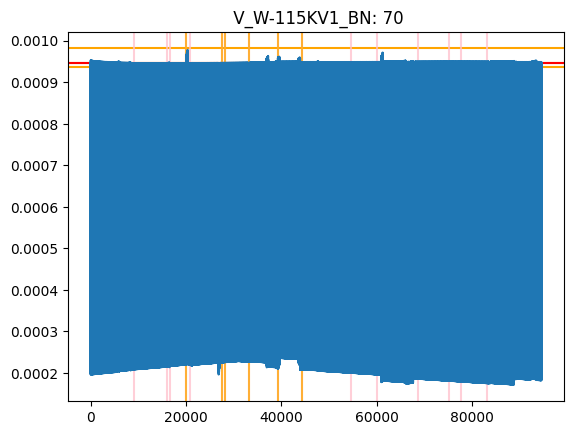

***********************************************************************************************
Sensor: 71  V_W-115KV1_CN
71
DD = 40
71
DD = 241


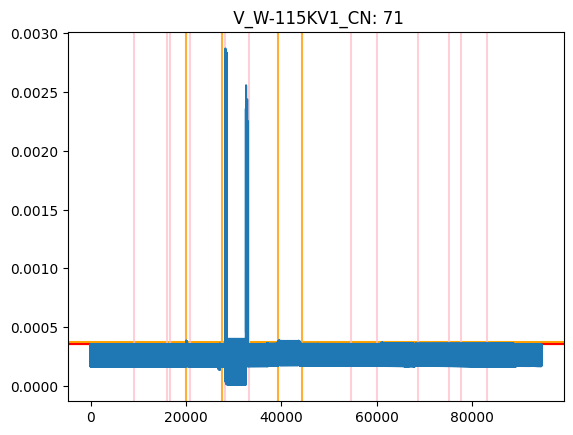

***********************************************************************************************
Sensor: 72  C_W927_W929_1_W927_A
72
DD = 4


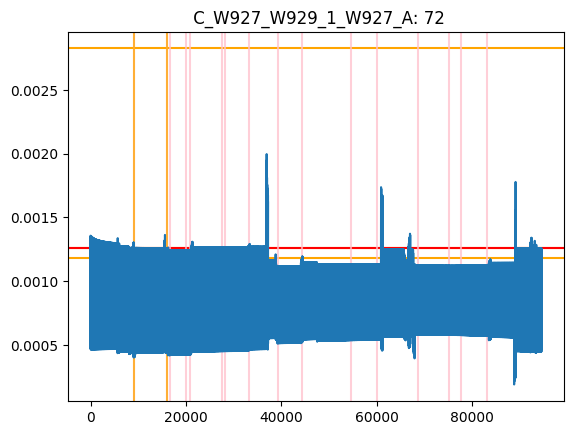

***********************************************************************************************
Sensor: 73  C_W927_W929_1_W927_B
73
DD = 11


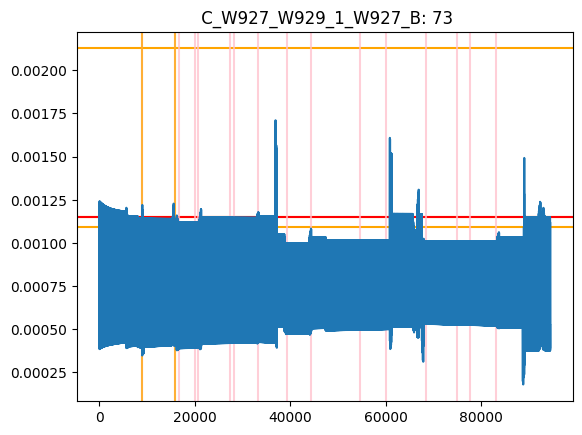

***********************************************************************************************
Sensor: 74  C_W927_W929_1_W927_C
74
DD = 6520


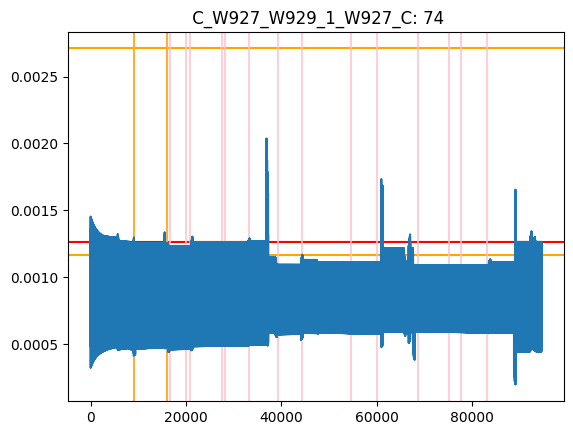

***********************************************************************************************
Sensor: 76  C_W919_W910_1_W910_A
DD = 20


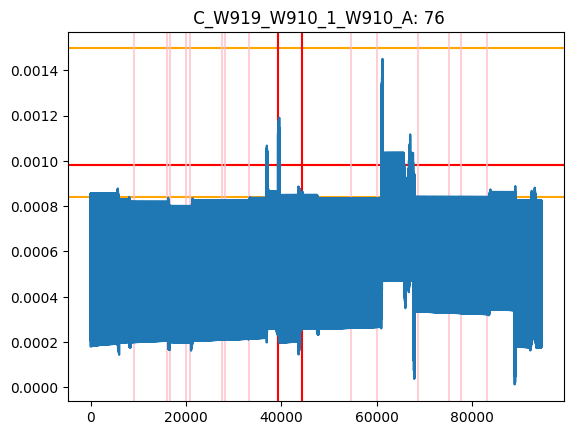

***********************************************************************************************
Sensor: 77  C_W919_W910_1_W910_B
DD = 7


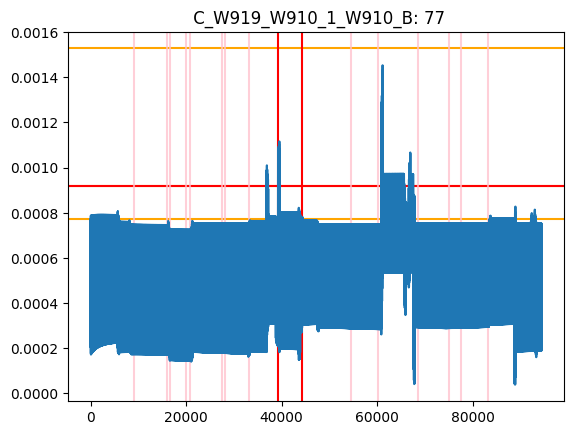

***********************************************************************************************
Sensor: 78  C_W919_W910_1_W910_C
DD = 33
DD = 4


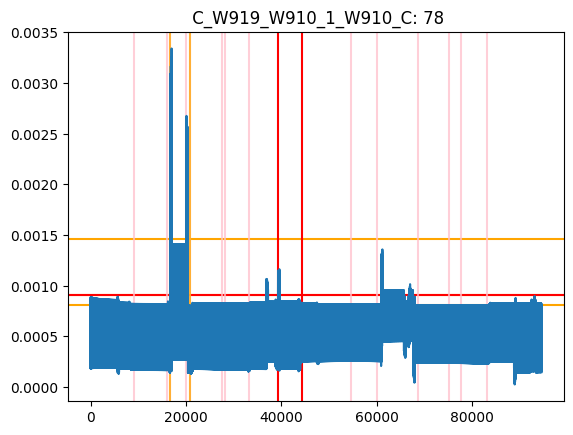

***********************************************************************************************
Sensor: 80  V_W911_AN
DD = 24
DD = 19


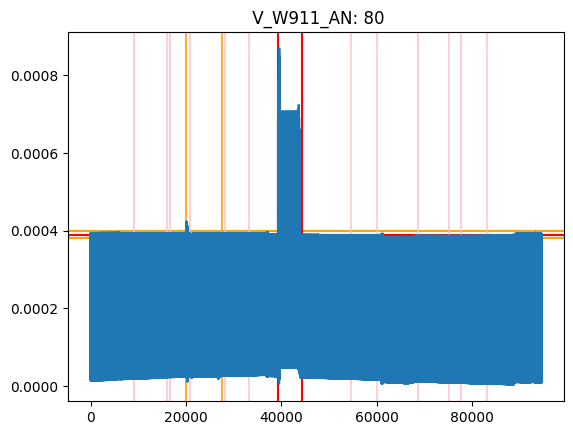

***********************************************************************************************
Sensor: 81  V_W911_BN
DD = None
DD = 4
DD = None


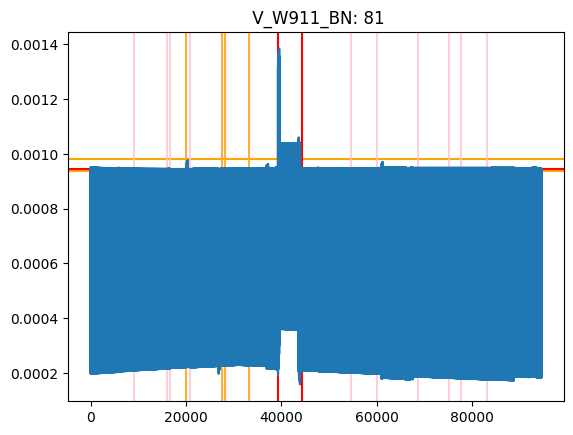

***********************************************************************************************
Sensor: 82  V_W911_CN
DD = 40
DD = 29


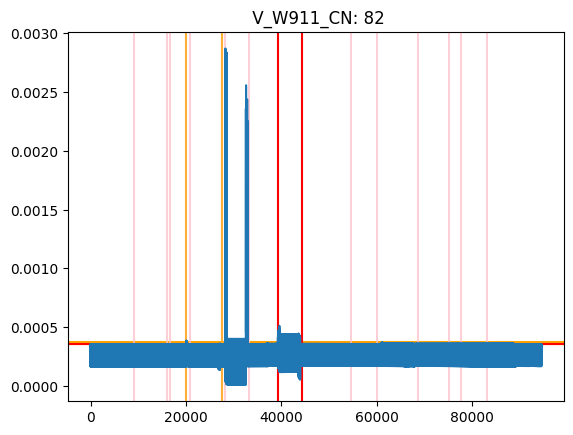

***********************************************************************************************
Sensor: 83  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_A


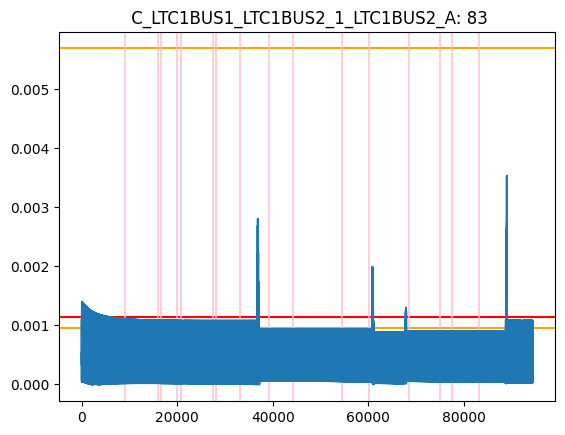

***********************************************************************************************
Sensor: 84  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_B


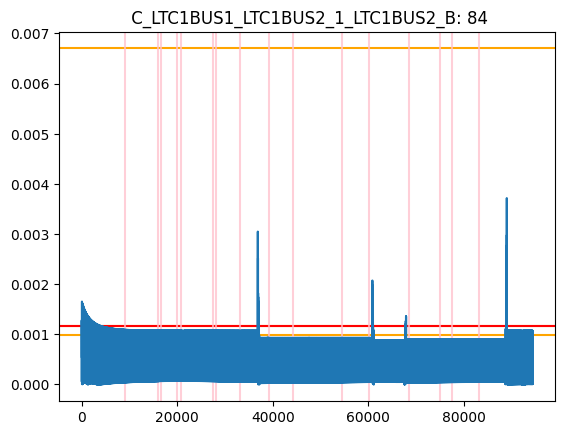

***********************************************************************************************
Sensor: 85  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_C


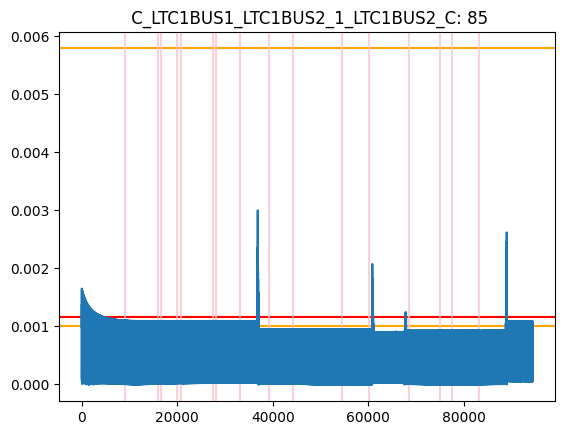

***********************************************************************************************
Sensor: 87  V_BUS13KV1_AN
87
DD = 22


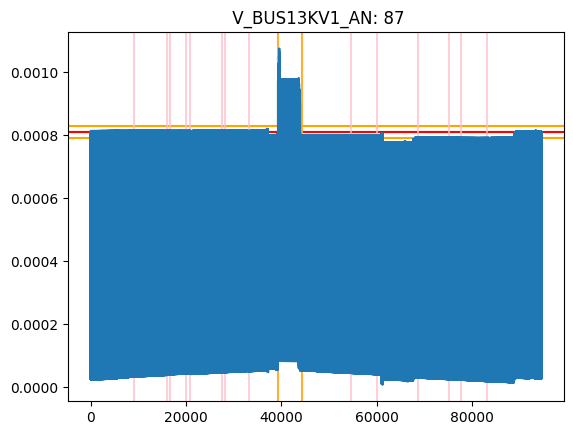

***********************************************************************************************
Sensor: 88  V_BUS13KV1_CN
DD = 4
DD = None


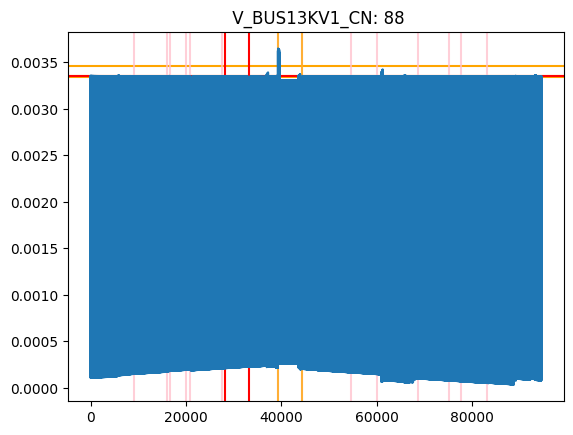

***********************************************************************************************
Sensor: 89  V_BUS13KV1_BN
89
DD = None


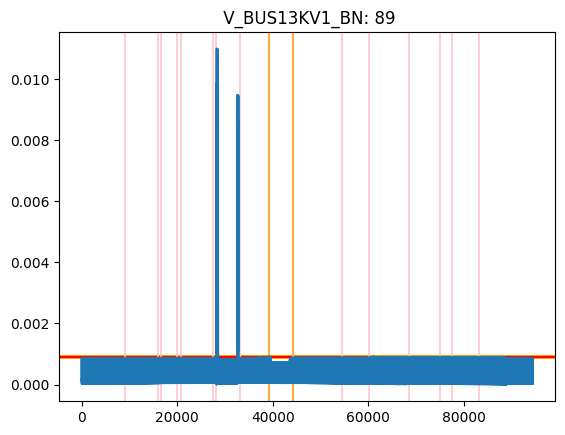

***********************************************************************************************
Sensor: 90  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_A
90
DD = None


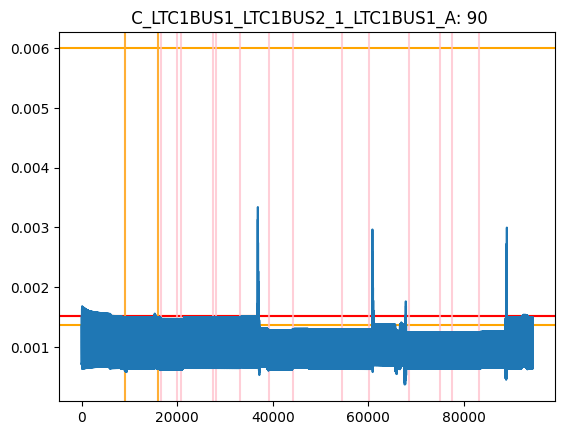

***********************************************************************************************
Sensor: 91  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_B
91
DD = None


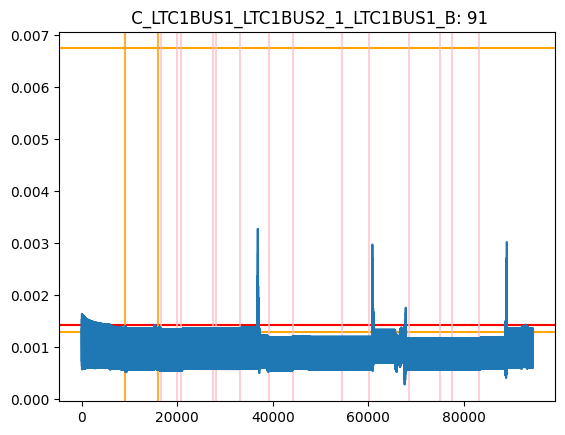

***********************************************************************************************
Sensor: 92  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_C
92
DD = None


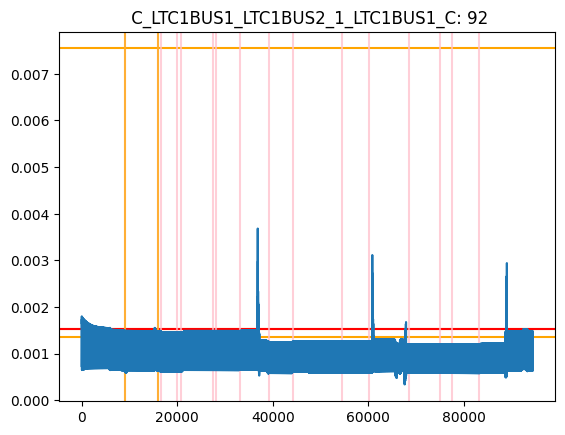

***********************************************************************************************
Sensor: 94  V_BUS13KV2_AN
DD = 4
DD = 24
DD = 22


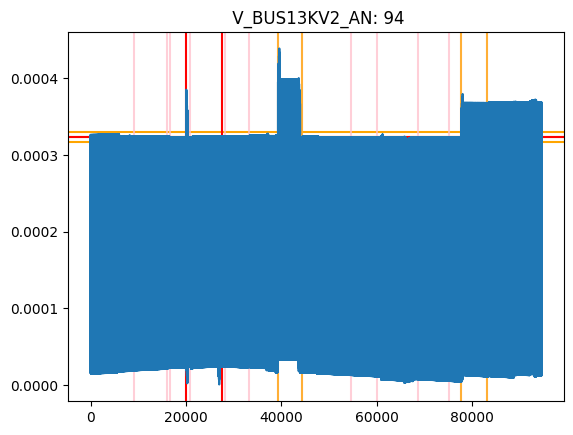

***********************************************************************************************
Sensor: 95  V_BUS13KV2_BN
DD = 10
DD = 10
DD = 9


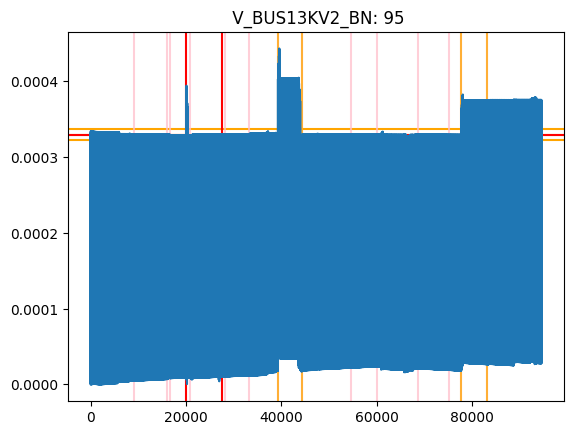

***********************************************************************************************
Sensor: 96  V_BUS13KV2_CN
DD = 16
DD = 37
DD = 35


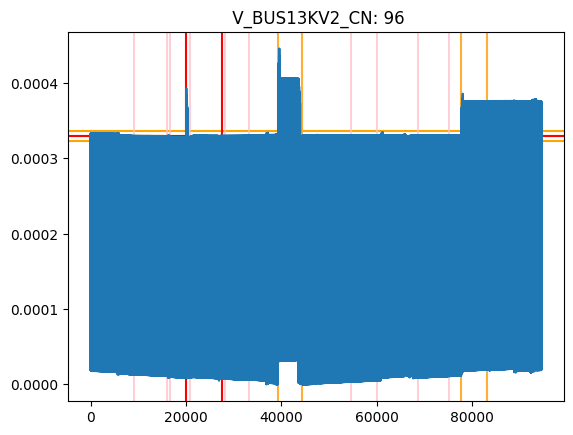

***********************************************************************************************
Sensor: 97  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_A
97
DD = None


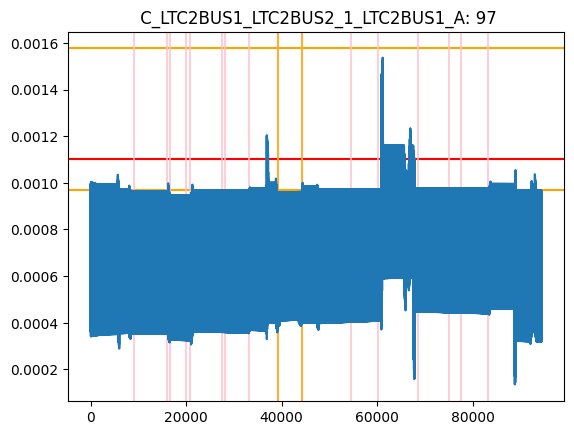

***********************************************************************************************
Sensor: 98  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_B
98
DD = None


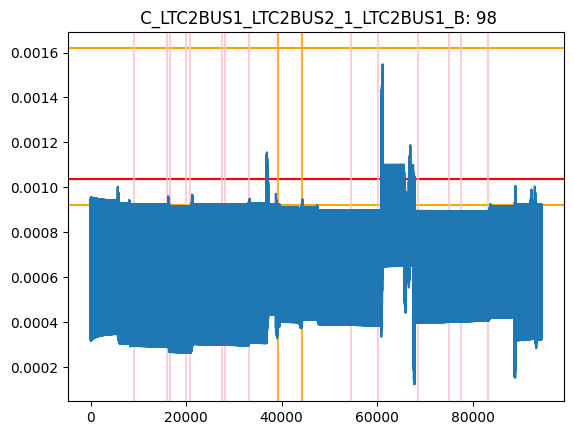

***********************************************************************************************
Sensor: 99  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_C
99
DD = None


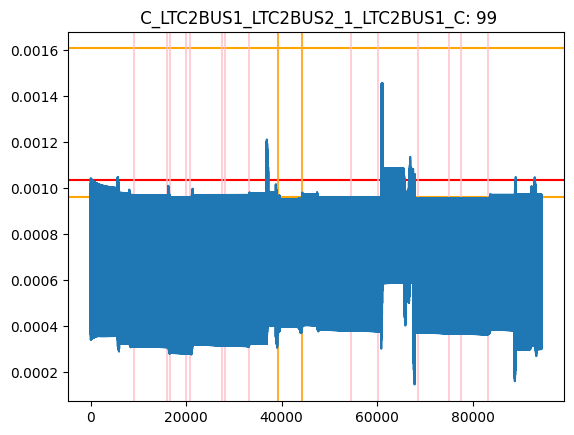

***********************************************************************************************
Sensor: 101  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_A
101
DD = 66


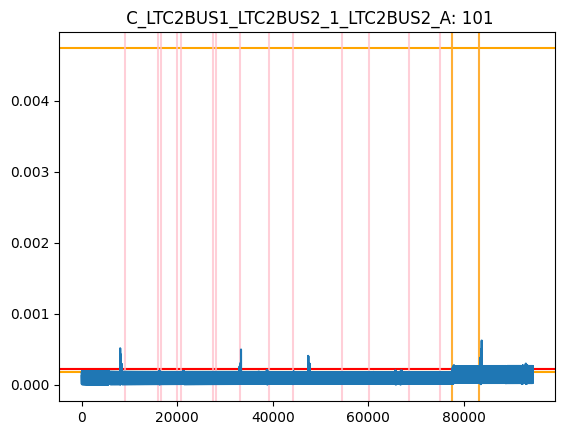

***********************************************************************************************
Sensor: 102  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_B
102
DD = 53


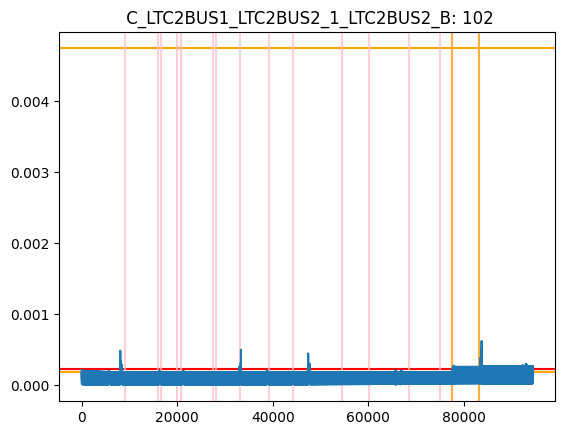

***********************************************************************************************
Sensor: 103  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_C
103
DD = 79


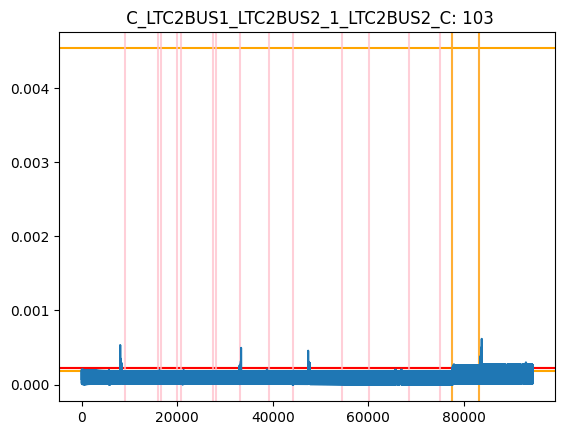

***********************************************************************************************
Sensor: 105  C_SOURCE~C_SUBC~115_1_SOURCE~C_A


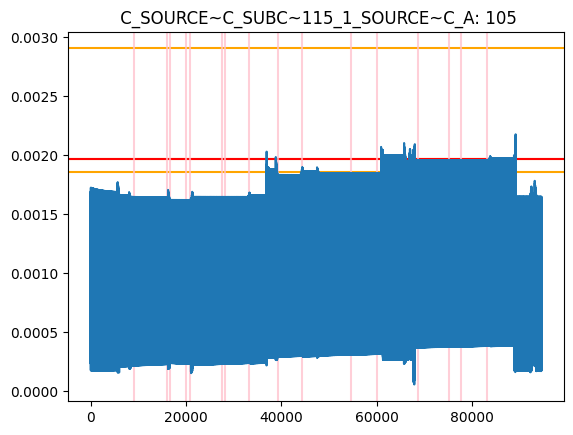

***********************************************************************************************
Sensor: 106  C_SOURCE~C_SUBC~115_1_SOURCE~C_B


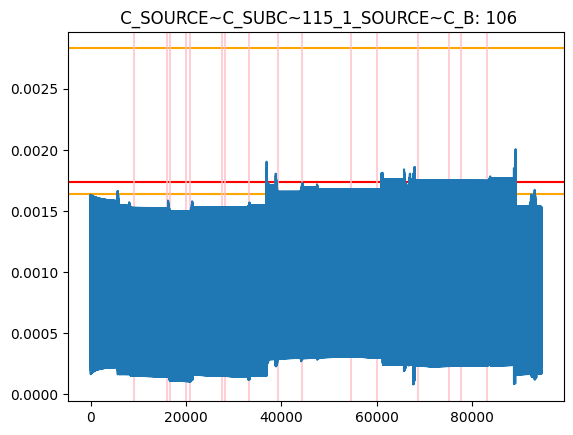

***********************************************************************************************
Sensor: 107  C_SOURCE~C_SUBC~115_1_SOURCE~C_C
107
DD = 4


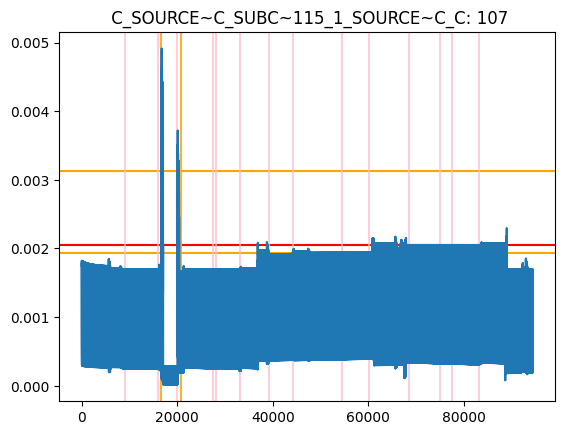

***********************************************************************************************
Sensor: 112  C_SOURCE~A_SUBA~115_1_SOURCE~A_A
112
DD = None


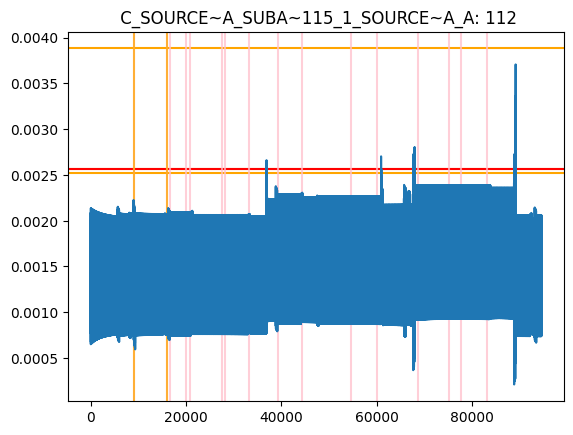

***********************************************************************************************
Sensor: 113  C_SOURCE~A_SUBA~115_1_SOURCE~A_B
113
DD = None


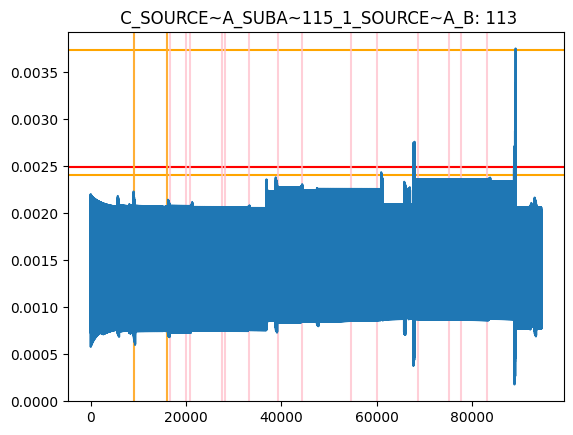

***********************************************************************************************
Sensor: 114  C_SOURCE~A_SUBA~115_1_SOURCE~A_C
114
DD = None


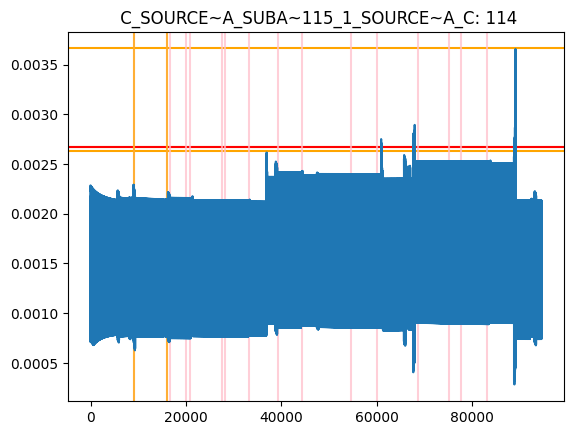

***********************************************************************************************
Sensor: 119  C_SOURCE~BL_SOURCE~B_1_SOURCE~BL_A
119
DD = 224


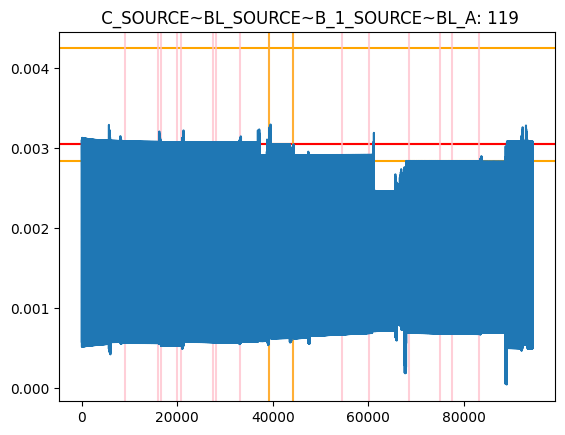

***********************************************************************************************
Sensor: 120  C_SOURCE~BL_SOURCE~B_1_SOURCE~BL_B
120
DD = 51


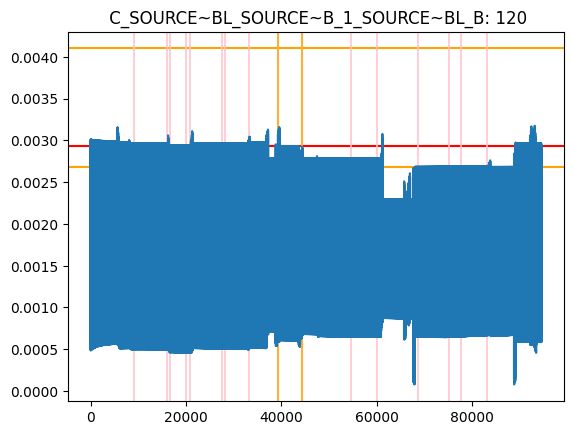

***********************************************************************************************
Sensor: 121  C_SOURCE~BL_SOURCE~B_1_SOURCE~BL_C
121
DD = 77


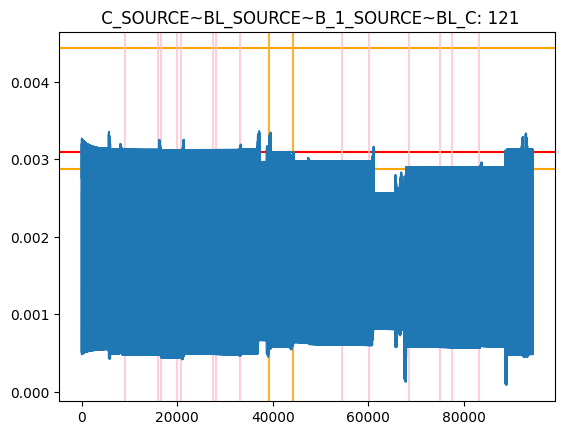

[4, 4, 4, None, None, None, 4, 4, 7, 4, 11, 4, 24, 4, 4, 8, 4, 4, 4, 4, 4, 4, 28, 15, 4, 4, None, None, None, 4, 11, 4, 24, 4, 4, 4, None, None, None, 4, 24, 64, None, None, None, 40, 241, None, None, None, None, None, None, 4, 11, 17, 4, 24, 64, None, None, None, 40, 241, 4, 11, 6520, 20, 7, 33, 4, 24, 19, None, 4, None, 40, 29, 22, 4, None, None, None, None, None, 4, 24, 22, 10, 10, 9, 16, 37, 35, None, None, None, 66, 53, 79, 4, None, None, None, 224, 51, 77]


In [28]:
LD_corr = []
at_neighbor = {}

rsum_list = rsum_list_corr
threshold = thresholds_corr_99
t_list = t_corr
persistency = 5

for index, i in enumerate(rsum_list):
    print("***********************************************************************************************")
    attack_in = (i > threshold[index]).nonzero()

    violations = (rsum_list > threshold.reshape(-1, 1))

    print(f"Sensor: {things[index]} {cols[things[index]-1]}")
    at_neighbor[things[index]] = attack_in
    plt.title(f"{cols[things[index]-1]}: {things[index]}")

    for t in t_list:
        plt.axhline(t[index], color='orange')

    plt.axhline(threshold[index], color='red')

    if things[index] in attack_dict:
        #if sensor is being attacked

        # ground truth
        attack_indices = df_test.index[
            (df_test['Time'] >= attack_dict[things[index]][0] * 1e6) &
            (df_test['Time'] <= attack_dict[things[index]][1] * 1e6)] - 1201

        for start, end in all_attack_indices:

            # if this is the attack time of the sensor, plot solid red lines
            if attack_indices[0] == start:
                DD = detection_delay(violations[index], [(start, end)], window, w, persistency)[0]
                LD_corr.append(DD)
                print(f"DD = {DD}")
                start_w = start-window-w
                end_w = end+window+w-1
                plt.axvline(start_w, color='red')
                plt.axvline(end_w, color='red')

            # otherwise, plot pink lines
            else:
                start_w = start-window-w
                end_w = end+window+w-1
                plt.axvline(start_w, color='pink', alpha=0.75)
                plt.axvline(end_w, color='pink', alpha=0.75)

                start_w = start-window-w
                end_w = end+window+w-1
                for starts, ate in attack_i.items():
                  if starts == start and things[index] in ate:
                    DD = detection_delay(violations[index], [(start, end)], window, w, persistency)[0]
                    LD_corr.append(DD)
                    print(f"DD = {DD}")
                    plt.axvline(start_w, color='orange', alpha=0.75)
                    plt.axvline(end_w, color='orange', alpha=0.75)

    else:
         for start, end in all_attack_indices:
            start_w = start-window-w
            end_w = end+window+w-1
            plt.axvline(start_w, color='pink', alpha=0.75)
            plt.axvline(end_w, color='pink', alpha=0.75)
            for starts, ate in attack_i.items():
              if starts == start:
                if things[index] in ate:
                  print(things[index])
                  DD = detection_delay(violations[index], [(start, end)], window, w, persistency)[0]
                  LD_corr.append(DD)
                  print(f"DD = {DD}")
                  plt.axvline(start_w, color='orange', alpha=0.75)
                  plt.axvline(end_w, color='orange', alpha=0.75)

    plt.plot(i)
    plt.show()

print(LD_corr)

In [29]:
topology = "A"

In [30]:
if topology == "A":
  print("loi")

loi


***********************************************************************************************
Sensor: 1  C_W738_W737_2_W737_A


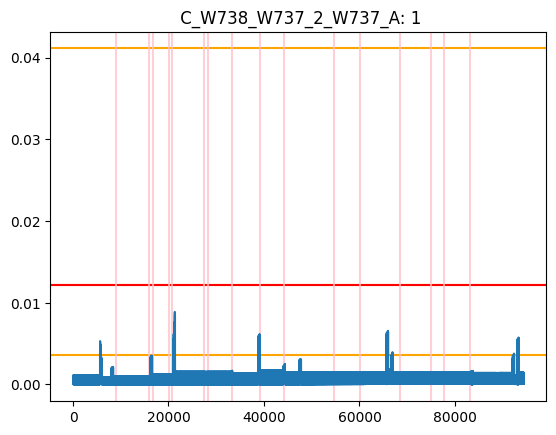

***********************************************************************************************
Sensor: 2  C_W738_W737_2_W737_B


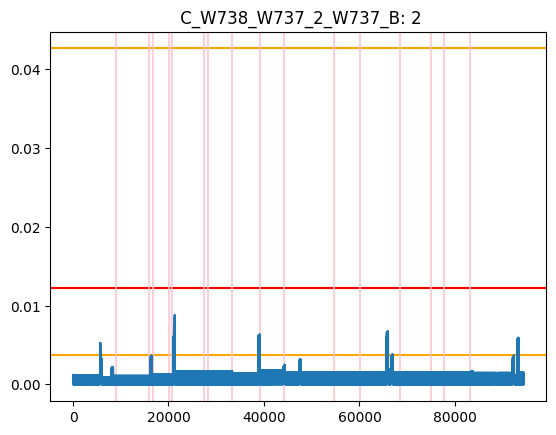

***********************************************************************************************
Sensor: 3  C_W738_W737_2_W737_C


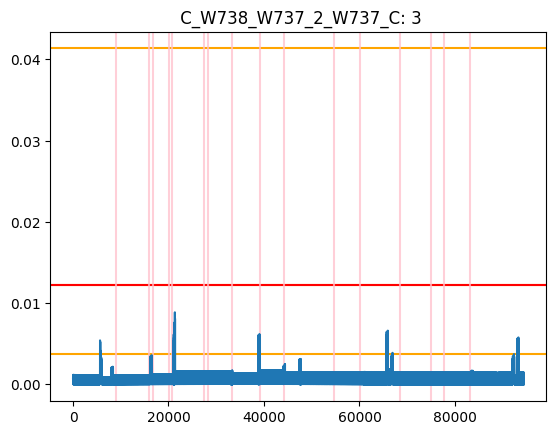

***********************************************************************************************
Sensor: 5  V_W738_AN
5
DD = 4


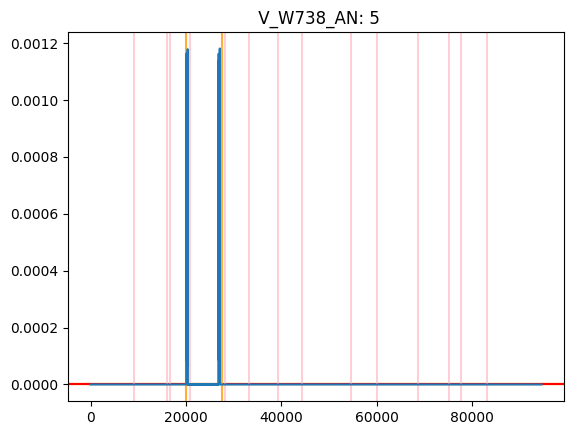

***********************************************************************************************
Sensor: 6  V_W738_BN
6
DD = 4


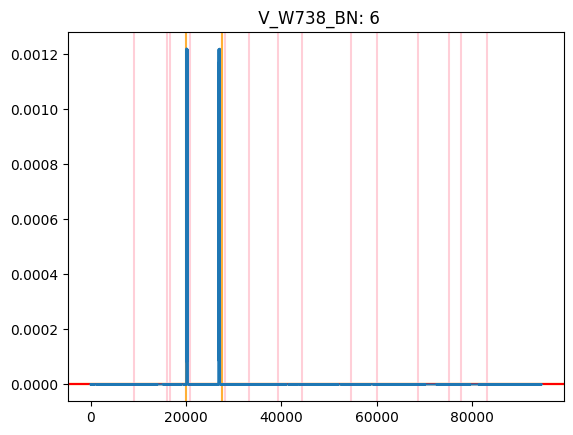

***********************************************************************************************
Sensor: 7  V_W738_CN
7
DD = 4


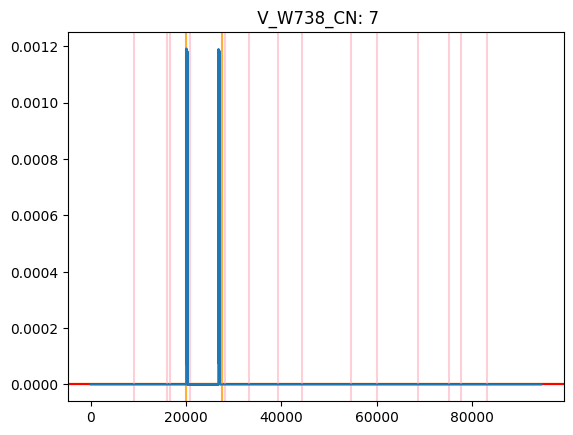

***********************************************************************************************
Sensor: 8  C_W747_W748_2_W747_A
8
DD = None


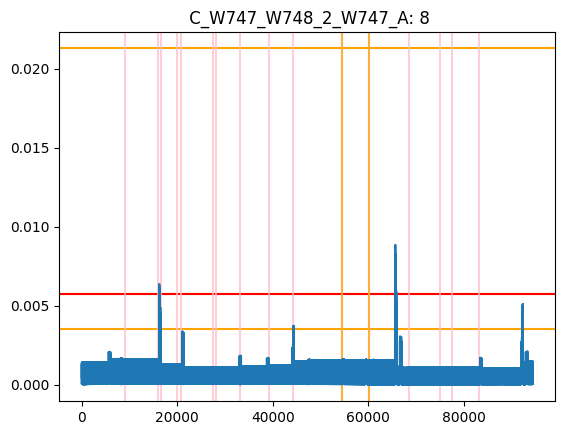

***********************************************************************************************
Sensor: 9  C_W747_W748_2_W747_B
9
DD = None


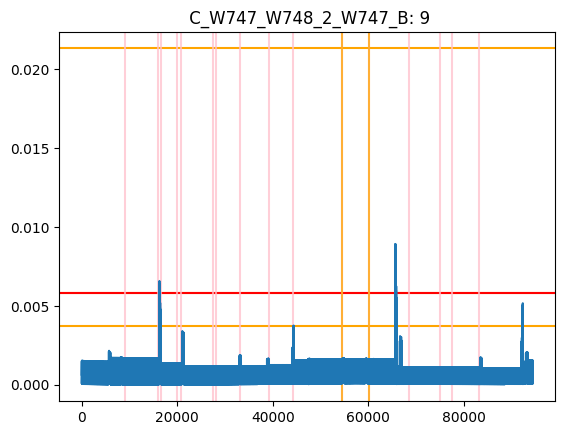

***********************************************************************************************
Sensor: 10  C_W747_W748_2_W747_C
10
DD = None
10
DD = None


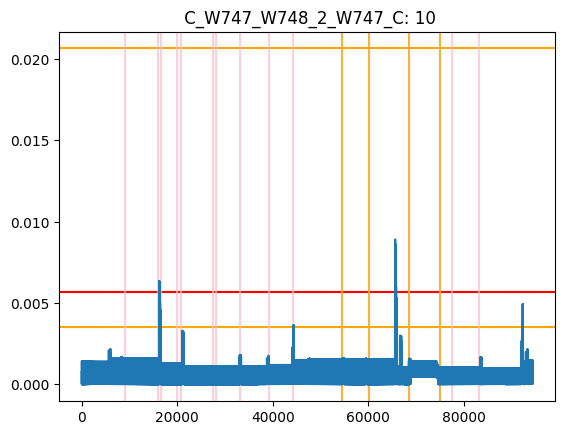

***********************************************************************************************
Sensor: 12  V_W748_AN
12
DD = 4


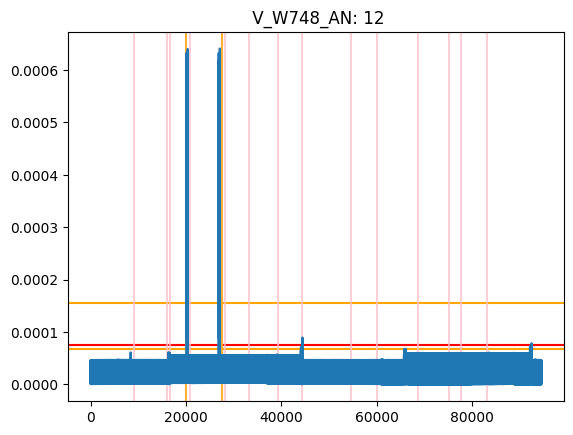

***********************************************************************************************
Sensor: 13  V_W748_BN
13
DD = 9


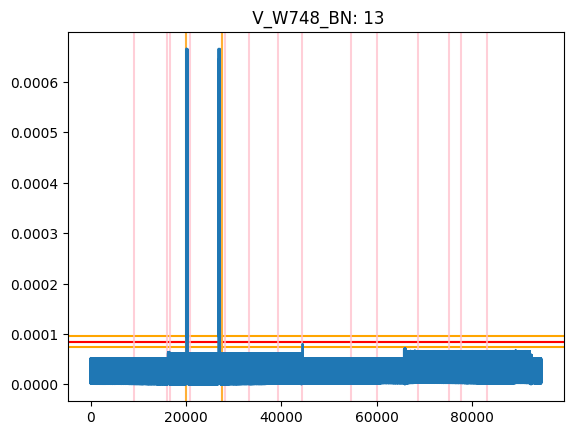

***********************************************************************************************
Sensor: 14  V_W748_CN
14
DD = 4


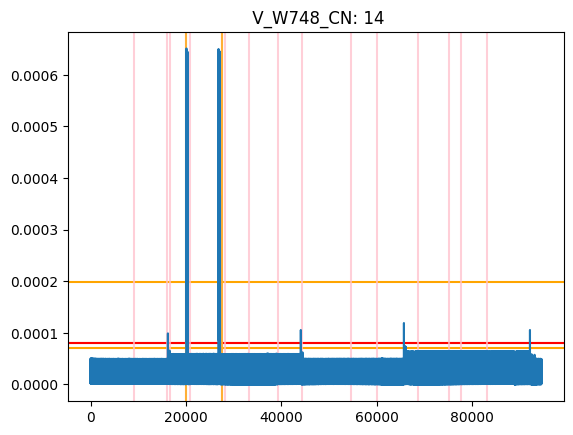

***********************************************************************************************
Sensor: 15  C_W787_W788_2_W787_A
DD = None


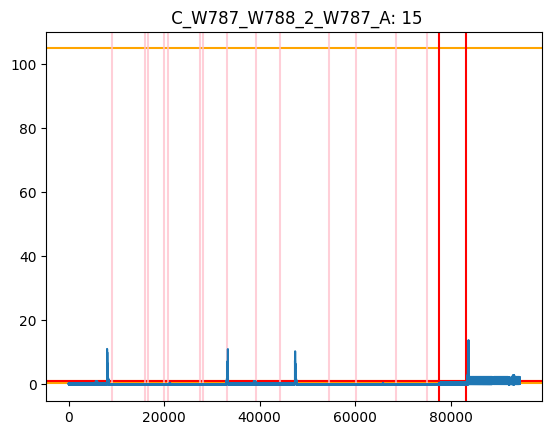

***********************************************************************************************
Sensor: 16  C_W787_W788_2_W787_B
DD = None


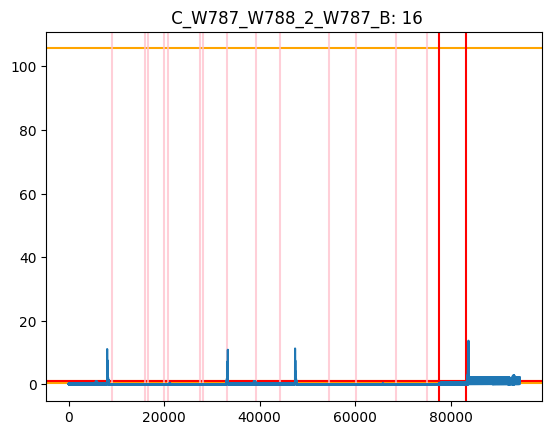

***********************************************************************************************
Sensor: 17  C_W787_W788_2_W787_C
DD = None


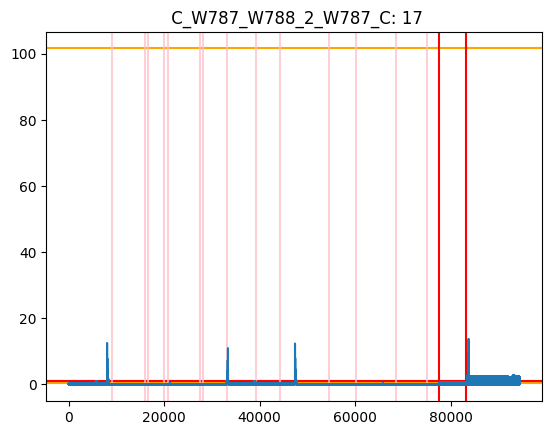

***********************************************************************************************
Sensor: 19  V_W788_AN
DD = 4
DD = 4


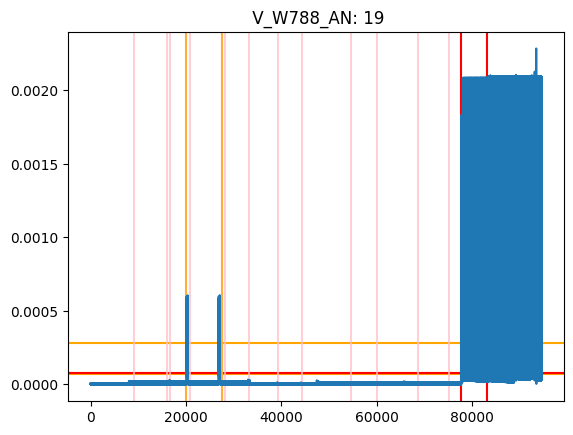

***********************************************************************************************
Sensor: 20  V_W788_BN
DD = 9
DD = 7


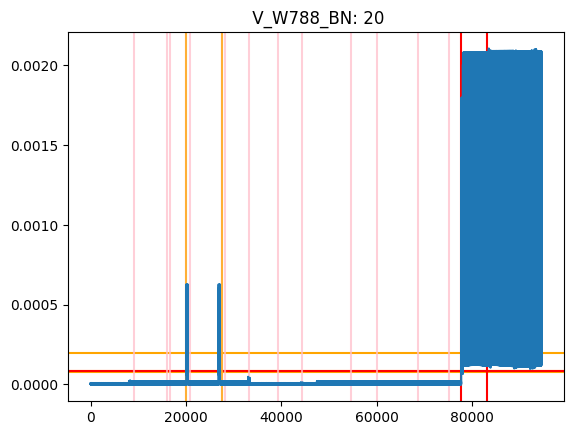

***********************************************************************************************
Sensor: 21  V_W788_CN
DD = 4
DD = 4


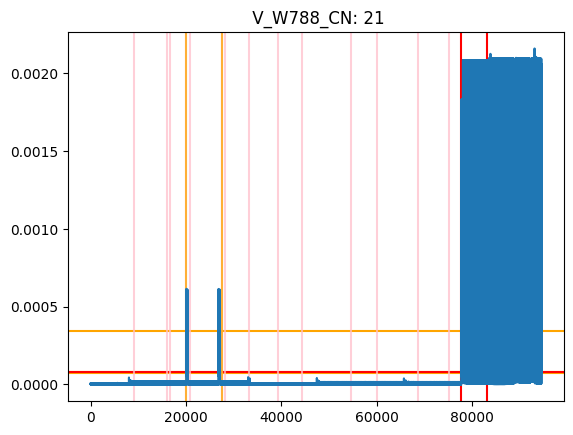

***********************************************************************************************
Sensor: 22  C_W797_W798_2_W797_A


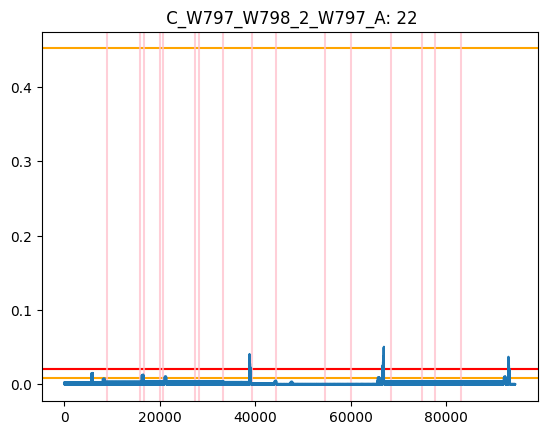

***********************************************************************************************
Sensor: 23  C_W797_W798_2_W797_B


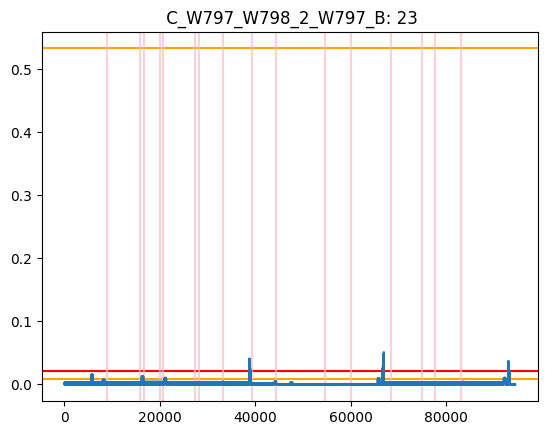

***********************************************************************************************
Sensor: 24  C_W797_W798_2_W797_C


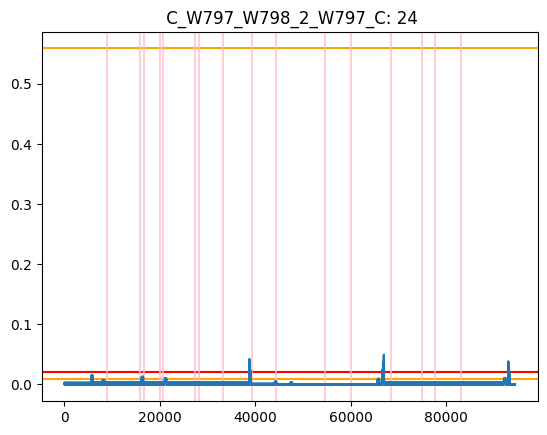

***********************************************************************************************
Sensor: 26  V_W798_AN
26
DD = 4


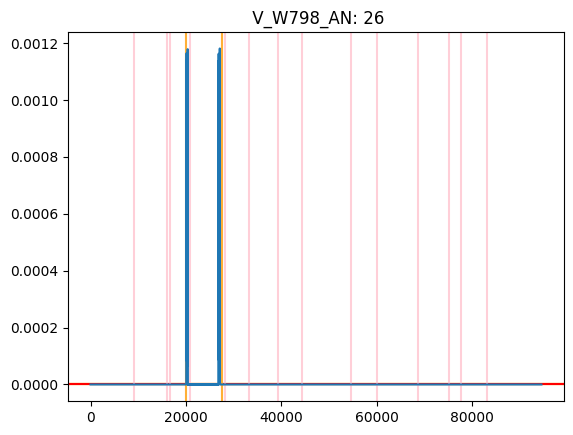

***********************************************************************************************
Sensor: 27  V_W798_BN
27
DD = 4


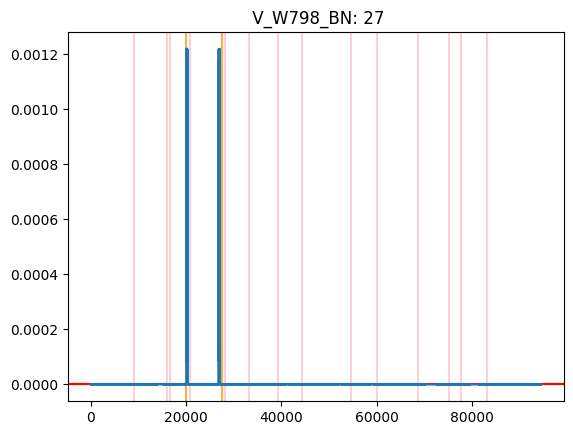

***********************************************************************************************
Sensor: 28  V_W798_CN
28
DD = 4


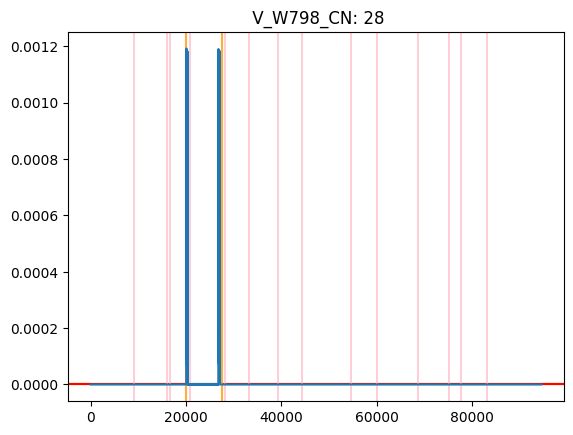

***********************************************************************************************
Sensor: 29  C_FD2B2_FD2B1_1_FD2B1_A
DD = None


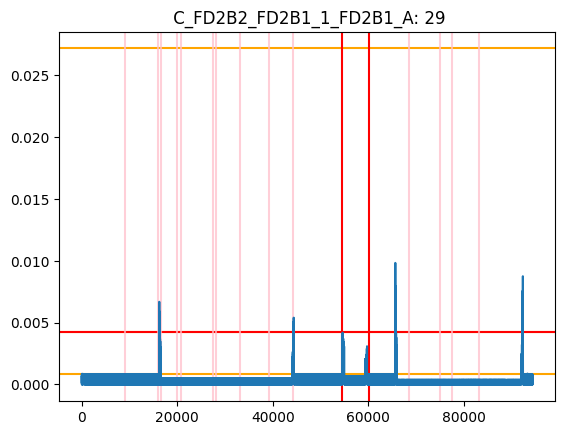

***********************************************************************************************
Sensor: 30  C_FD2B2_FD2B1_1_FD2B1_B
DD = None


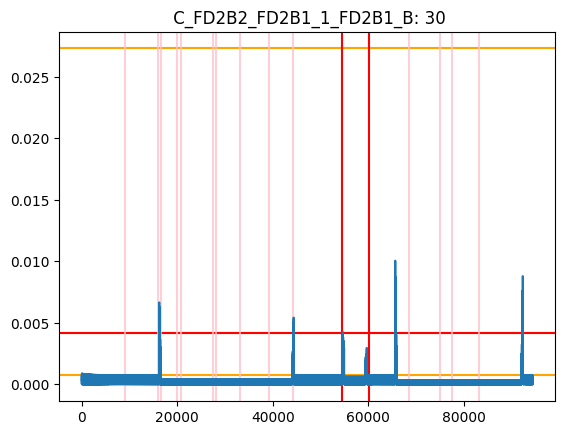

***********************************************************************************************
Sensor: 31  C_FD2B2_FD2B1_1_FD2B1_C
DD = None
DD = None


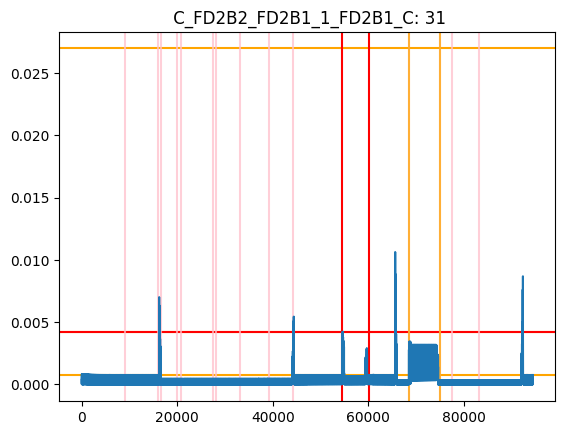

***********************************************************************************************
Sensor: 33  V_FD2B1_AN


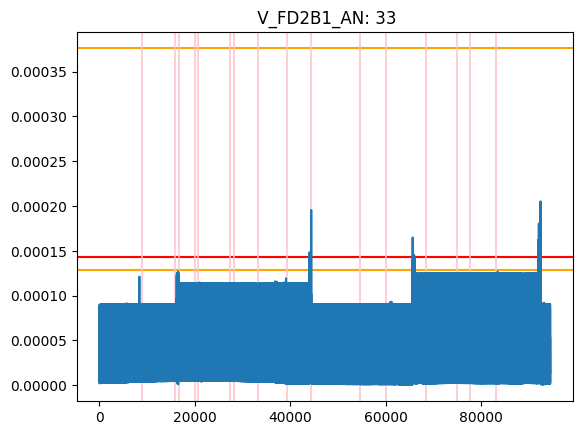

***********************************************************************************************
Sensor: 34  V_FD2B1_BN


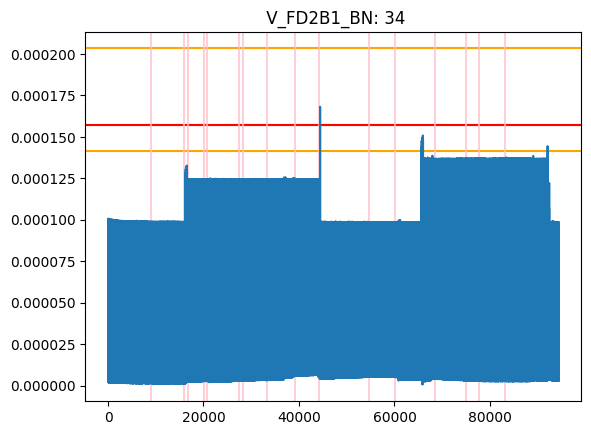

***********************************************************************************************
Sensor: 35  V_FD2B1_CN


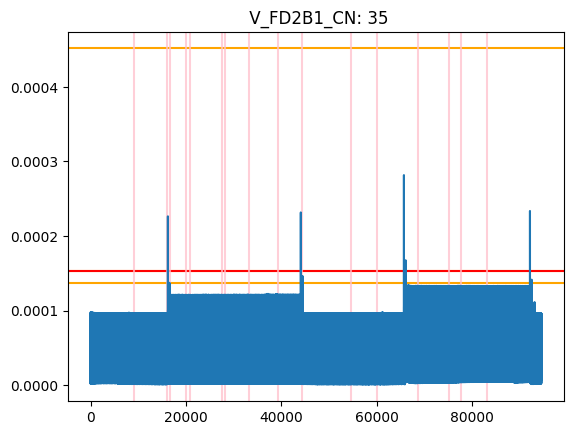

***********************************************************************************************
Sensor: 36  C_FD2B5_FD2B6_1_FD2B5_A
36
DD = None


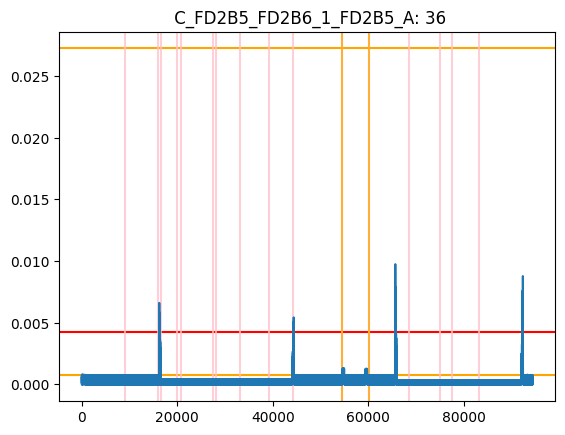

***********************************************************************************************
Sensor: 37  C_FD2B5_FD2B6_1_FD2B5_B
37
DD = None


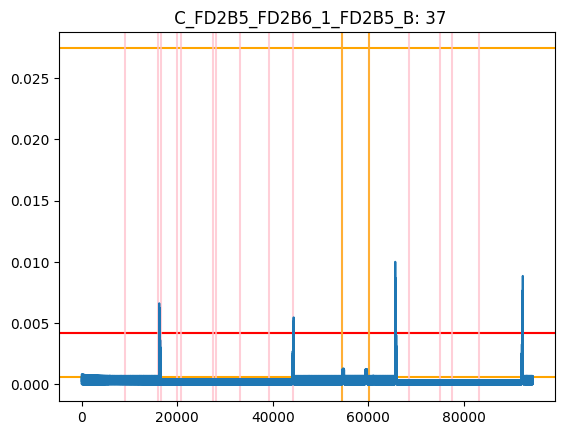

***********************************************************************************************
Sensor: 38  C_FD2B5_FD2B6_1_FD2B5_C
DD = None
DD = 4


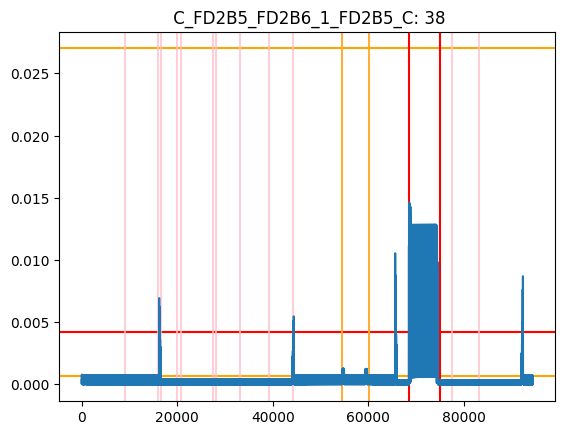

***********************************************************************************************
Sensor: 40  V_FD2B5_AN


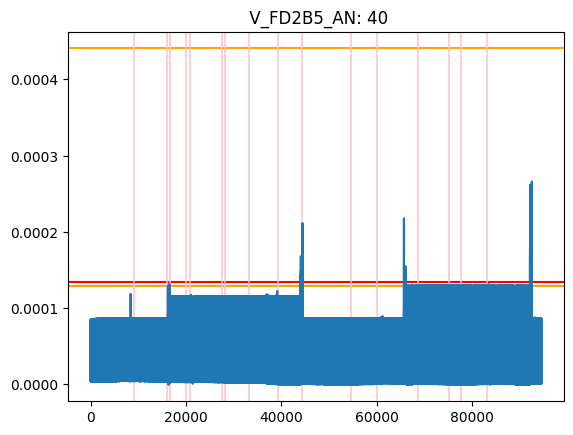

***********************************************************************************************
Sensor: 41  V_FD2B5_BN


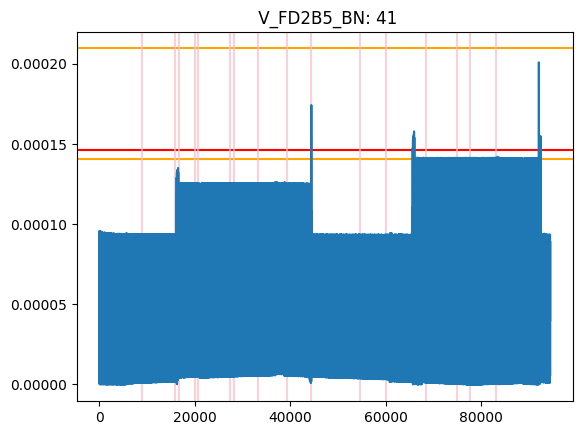

***********************************************************************************************
Sensor: 42  V_FD2B5_CN


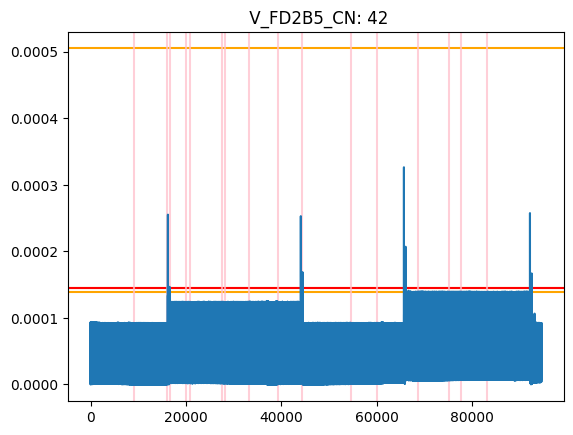

***********************************************************************************************
Sensor: 43  C_FD3B4_FD3B5_1_FD3B4_A
43
DD = None


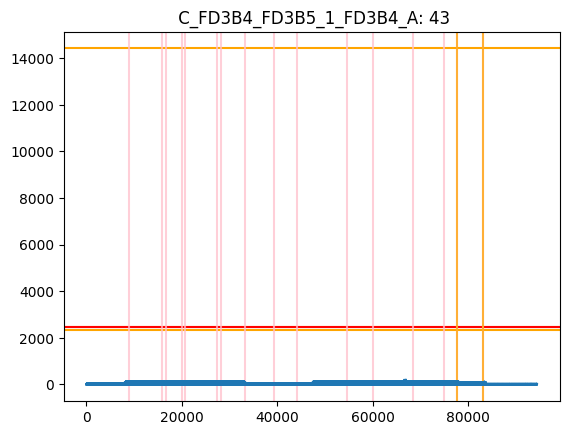

***********************************************************************************************
Sensor: 44  C_FD3B4_FD3B5_1_FD3B4_B
44
DD = None


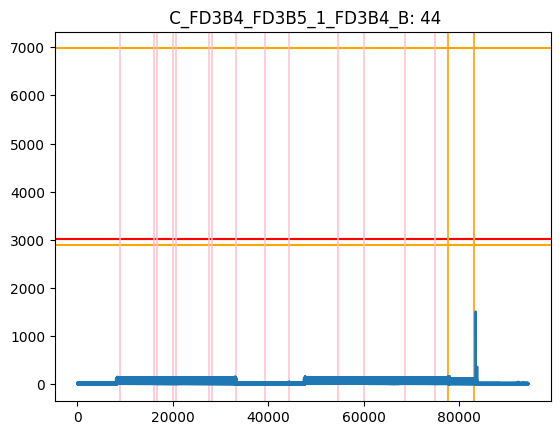

***********************************************************************************************
Sensor: 45  C_FD3B4_FD3B5_1_FD3B4_C
45
DD = None


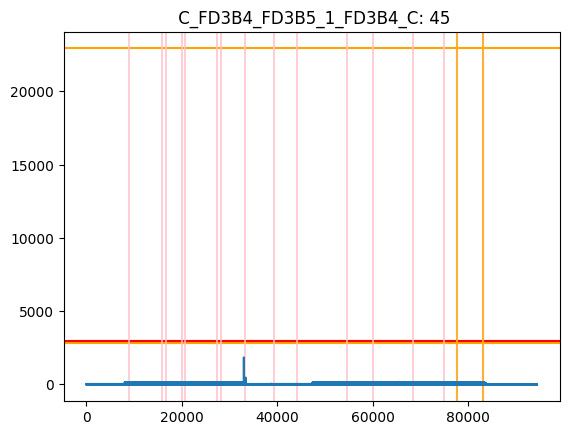

***********************************************************************************************
Sensor: 47  V_FD3B4_AN
47
DD = 4


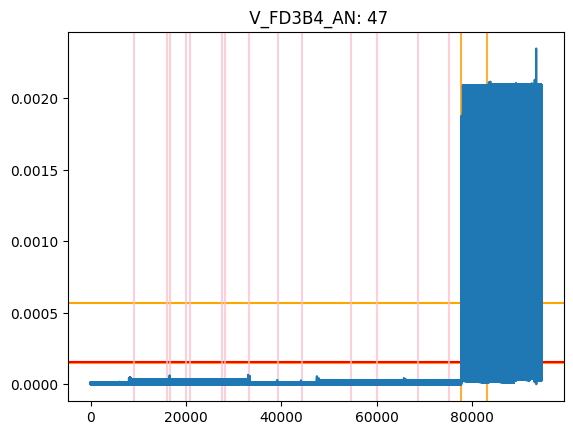

***********************************************************************************************
Sensor: 48  V_FD3B4_BN
48
DD = 7


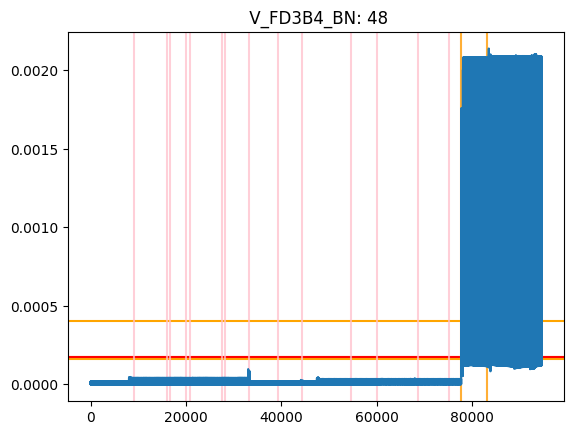

***********************************************************************************************
Sensor: 49  V_FD3B4_CN
49
DD = 4


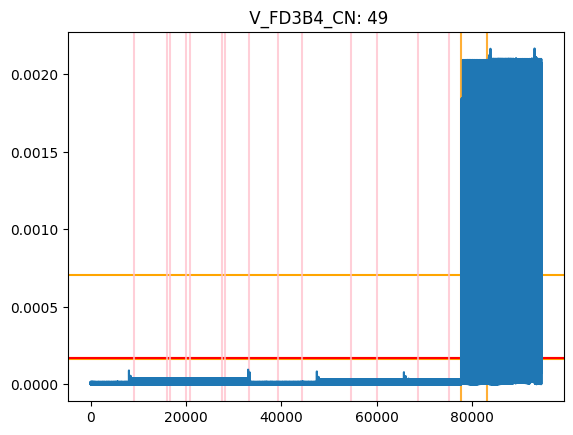

***********************************************************************************************
Sensor: 50  C_W919_W910_1_W919_A
50
DD = None


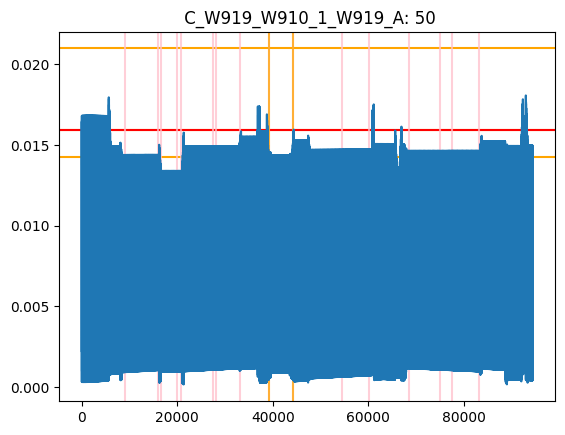

***********************************************************************************************
Sensor: 51  C_W919_W910_1_W919_B
51
DD = None


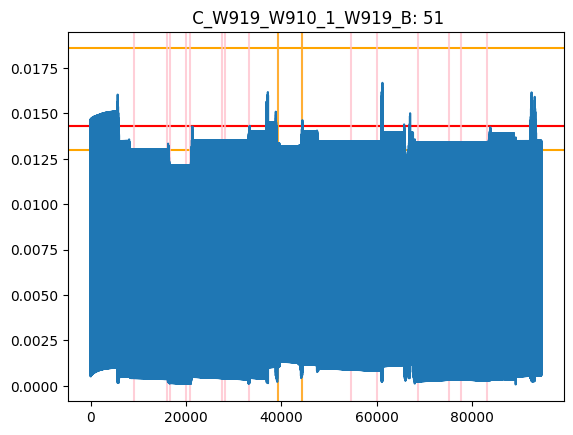

***********************************************************************************************
Sensor: 52  C_W919_W910_1_W919_C
DD = None
DD = 3399


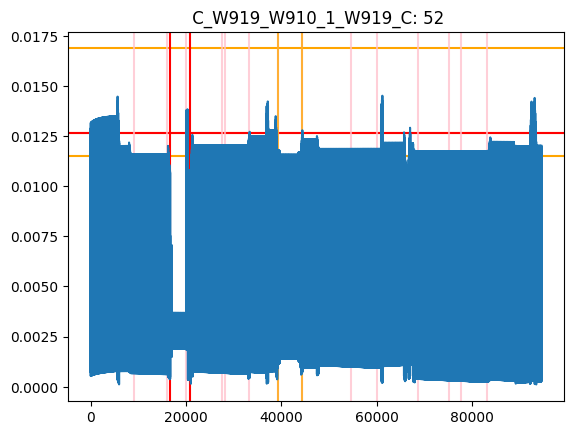

***********************************************************************************************
Sensor: 54  V_W-115KV2_AN
54
DD = 32
54
DD = 6


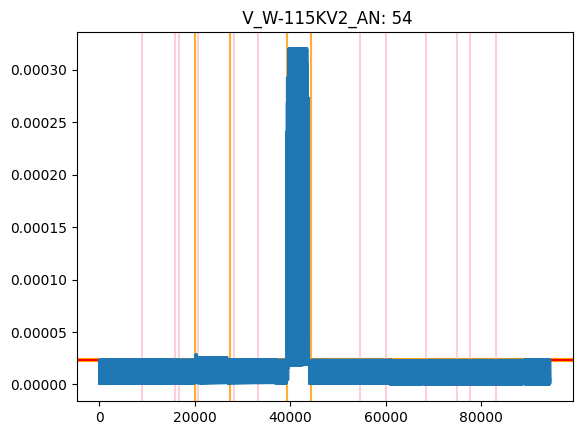

***********************************************************************************************
Sensor: 55  V_W-115KV2_BN
55
DD = 16
55
DD = 4
55
DD = None


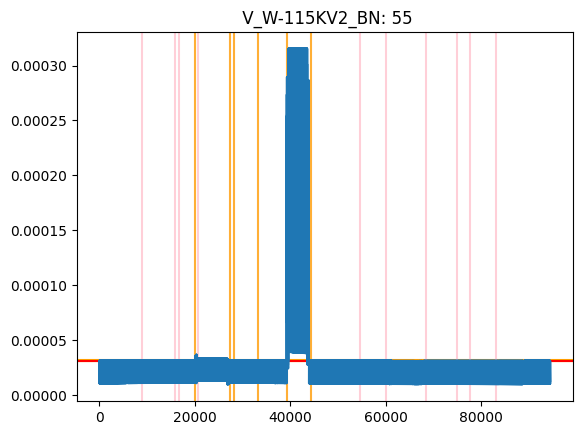

***********************************************************************************************
Sensor: 56  V_W-115KV2_CN
56
DD = 9
56
DD = 4


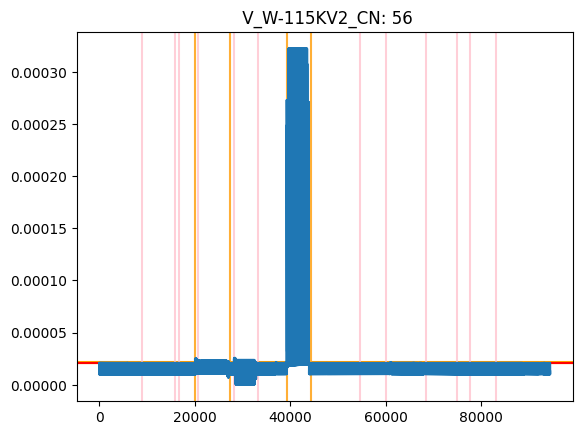

***********************************************************************************************
Sensor: 57  C_W957_W950_1_W950_A
57
DD = None
57
DD = None


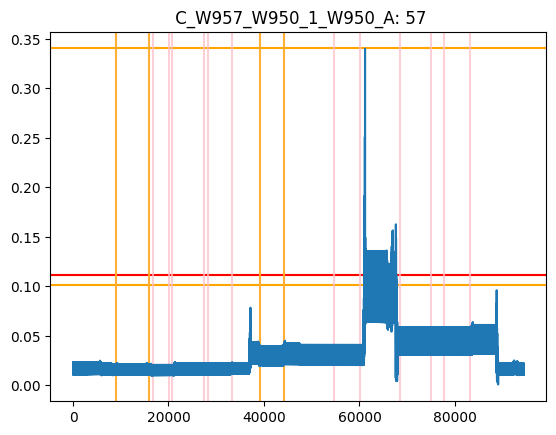

***********************************************************************************************
Sensor: 58  C_W957_W950_1_W950_B
58
DD = None
58
DD = None


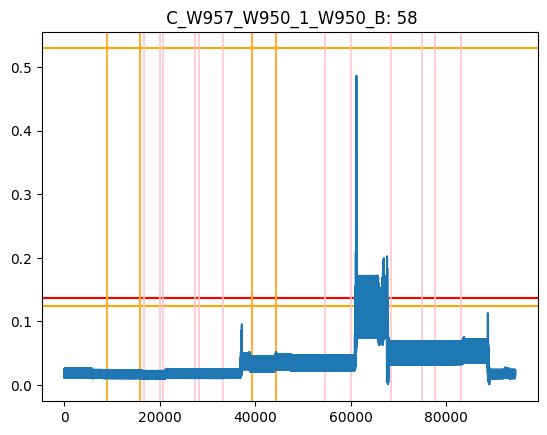

***********************************************************************************************
Sensor: 59  C_W957_W950_1_W950_C
59
DD = None
59
DD = None


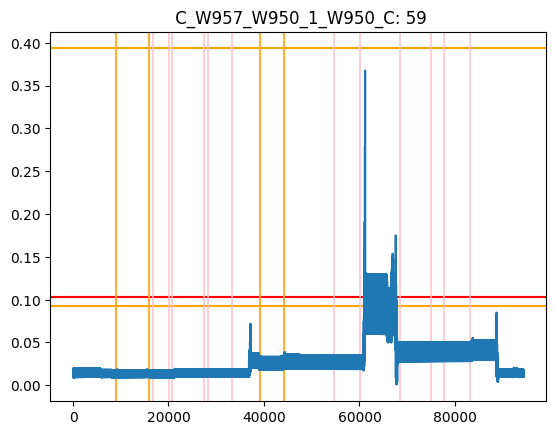

***********************************************************************************************
Sensor: 61  C_W957_W950_1_W957_A
DD = None


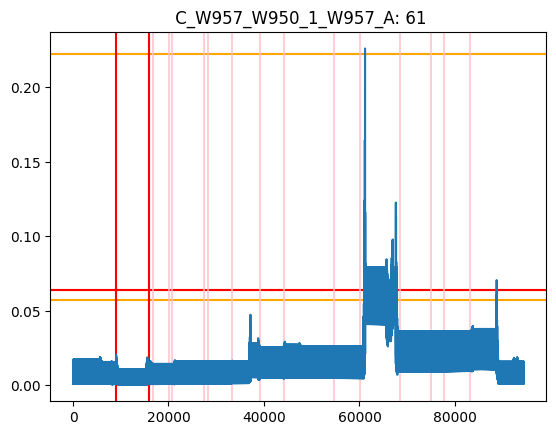

***********************************************************************************************
Sensor: 62  C_W957_W950_1_W957_B
DD = None


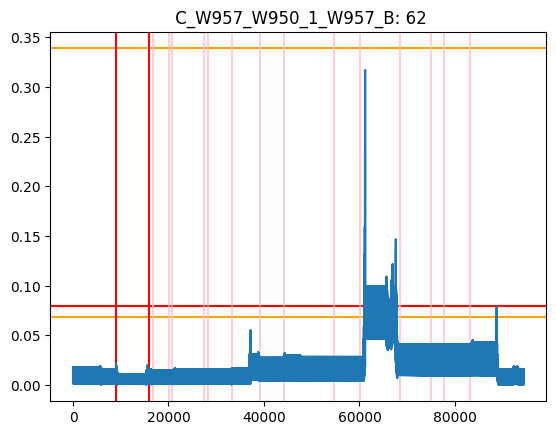

***********************************************************************************************
Sensor: 63  C_W957_W950_1_W957_C
DD = None


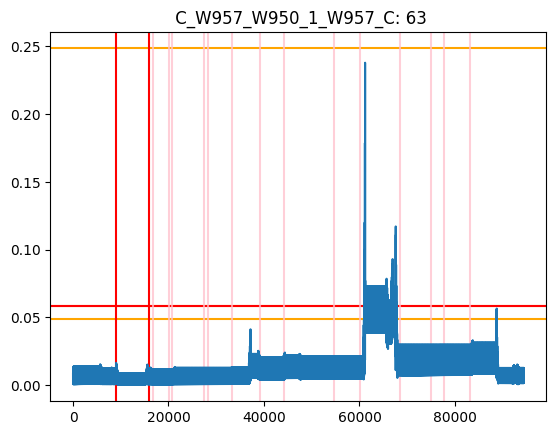

***********************************************************************************************
Sensor: 65  C_W927_W929_1_W929_A


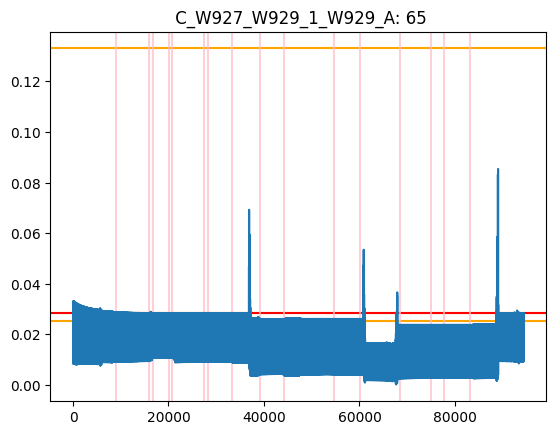

***********************************************************************************************
Sensor: 66  C_W927_W929_1_W929_B


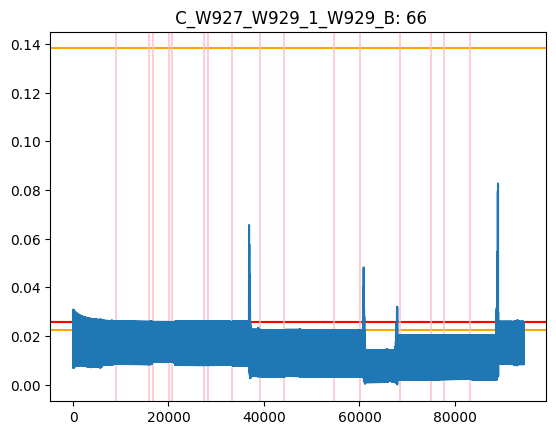

***********************************************************************************************
Sensor: 67  C_W927_W929_1_W929_C
67
DD = 3398


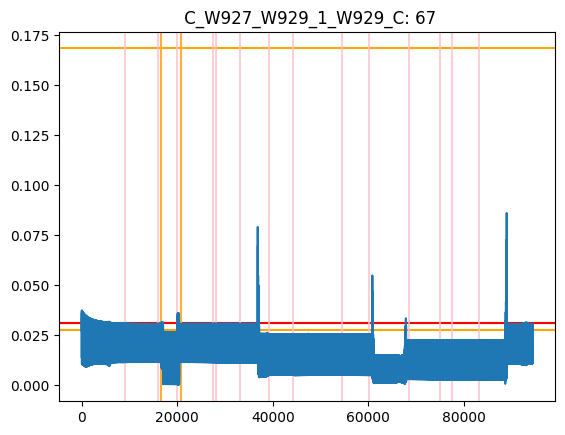

***********************************************************************************************
Sensor: 69  V_W-115KV1_AN
69
DD = 32
69
DD = 6


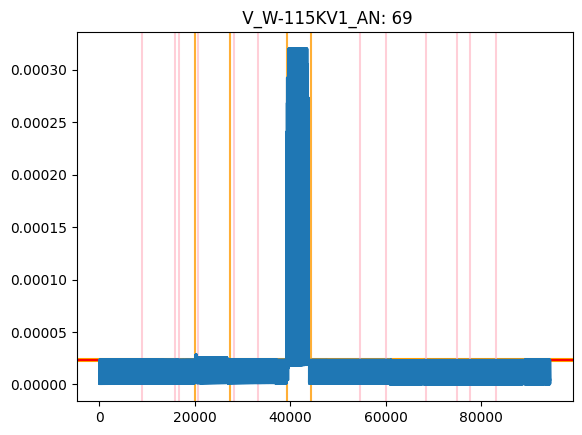

***********************************************************************************************
Sensor: 70  V_W-115KV1_BN
70
DD = 16
70
DD = 4
70
DD = None


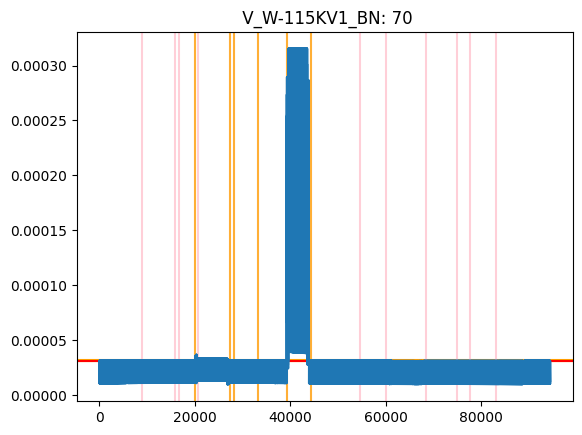

***********************************************************************************************
Sensor: 71  V_W-115KV1_CN
71
DD = 9
71
DD = 4


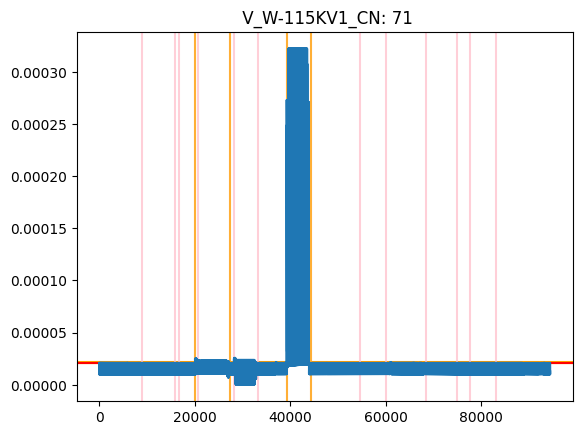

***********************************************************************************************
Sensor: 72  C_W927_W929_1_W927_A
72
DD = 103


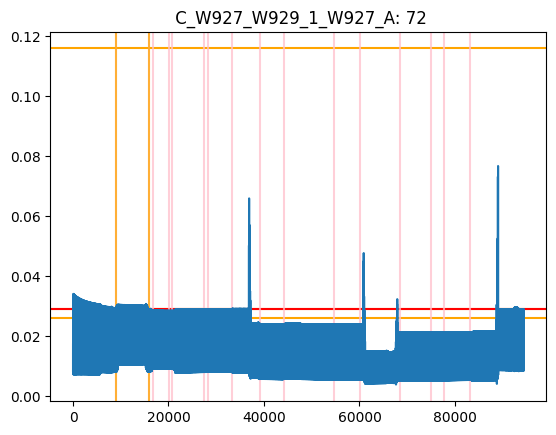

***********************************************************************************************
Sensor: 73  C_W927_W929_1_W927_B
73
DD = 6310


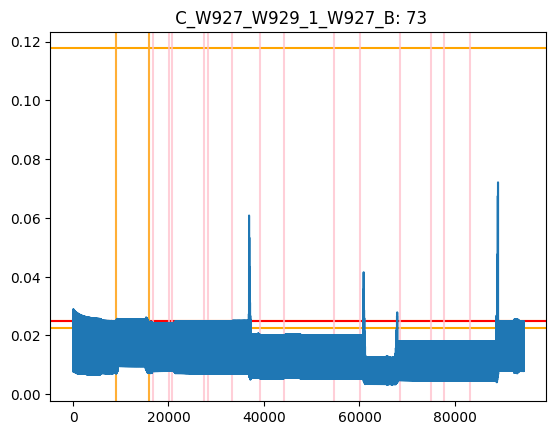

***********************************************************************************************
Sensor: 74  C_W927_W929_1_W927_C
74
DD = 6255


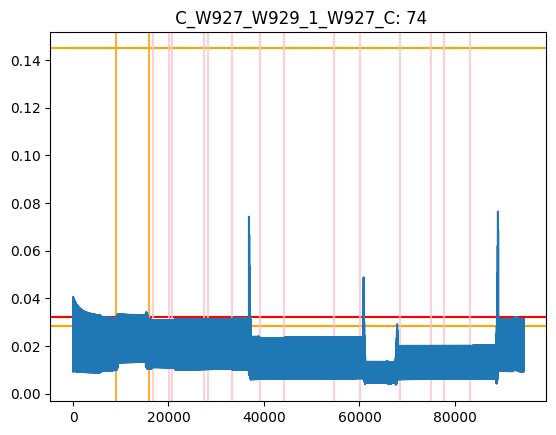

***********************************************************************************************
Sensor: 76  C_W919_W910_1_W910_A
DD = 12


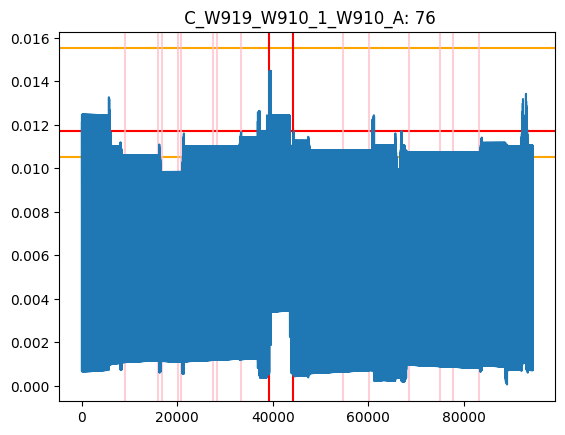

***********************************************************************************************
Sensor: 77  C_W919_W910_1_W910_B
DD = 19


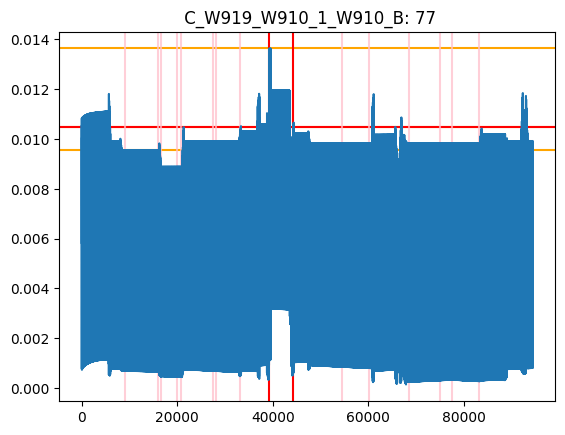

***********************************************************************************************
Sensor: 78  C_W919_W910_1_W910_C
DD = 5
DD = None


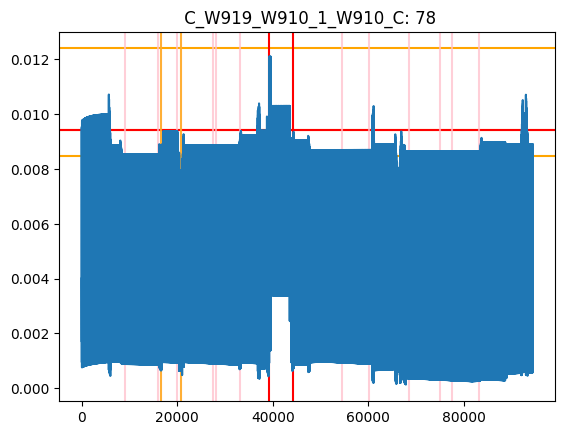

***********************************************************************************************
Sensor: 80  V_W911_AN
DD = 32
DD = 6


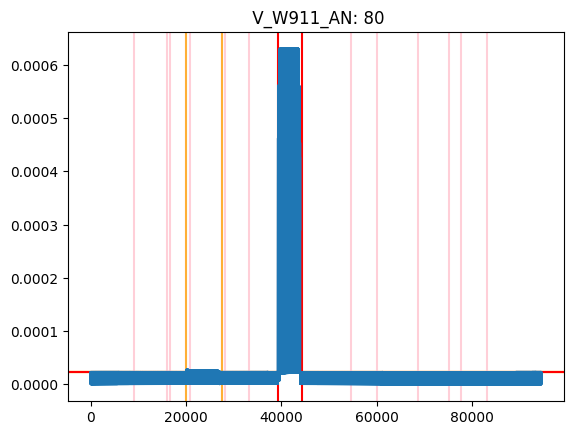

***********************************************************************************************
Sensor: 81  V_W911_BN
DD = 16
DD = 4
DD = None


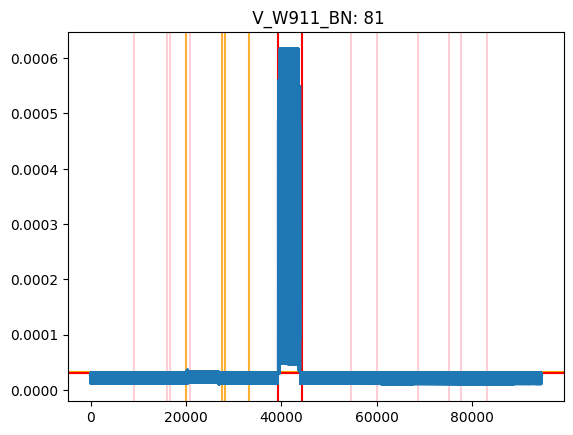

***********************************************************************************************
Sensor: 82  V_W911_CN
DD = 9
DD = 4


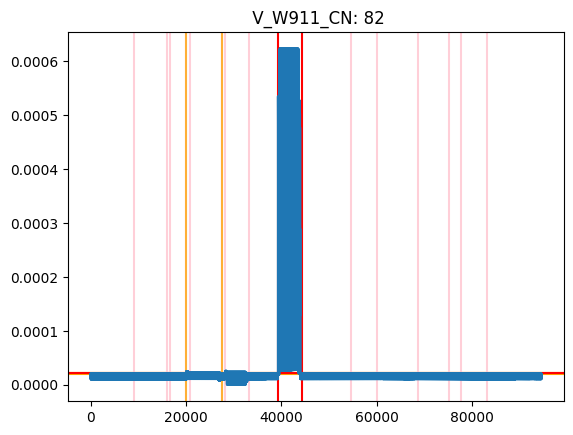

***********************************************************************************************
Sensor: 83  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_A


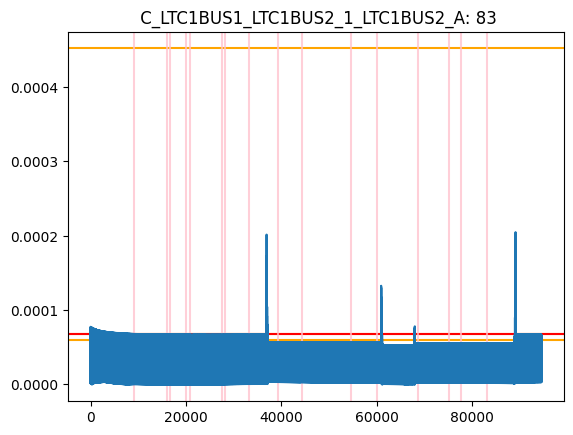

***********************************************************************************************
Sensor: 84  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_B


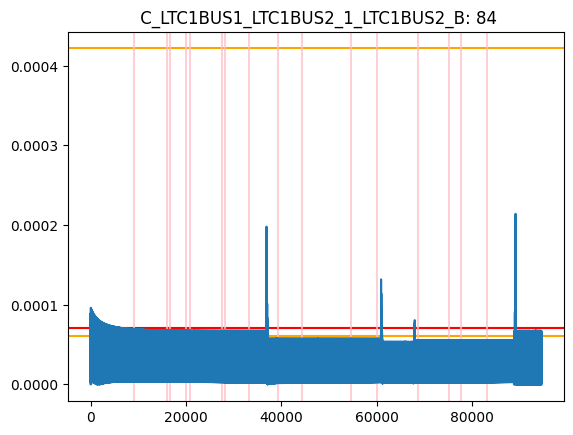

***********************************************************************************************
Sensor: 85  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_C


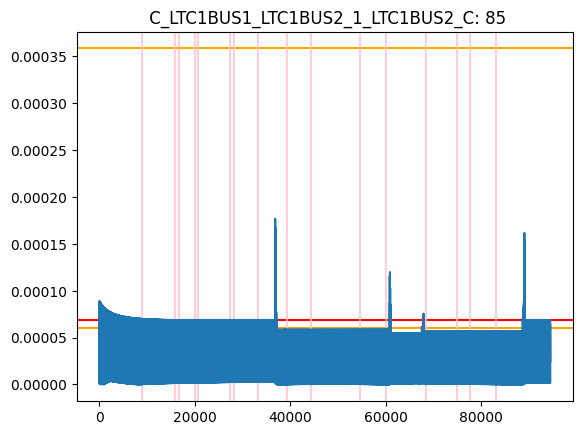

***********************************************************************************************
Sensor: 87  V_BUS13KV1_AN
87
DD = 33


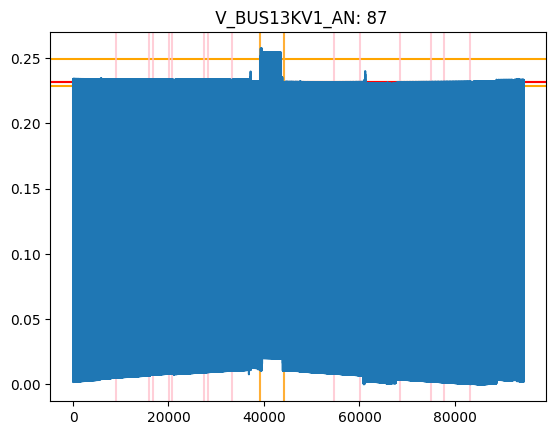

***********************************************************************************************
Sensor: 88  V_BUS13KV1_CN
DD = None
DD = None


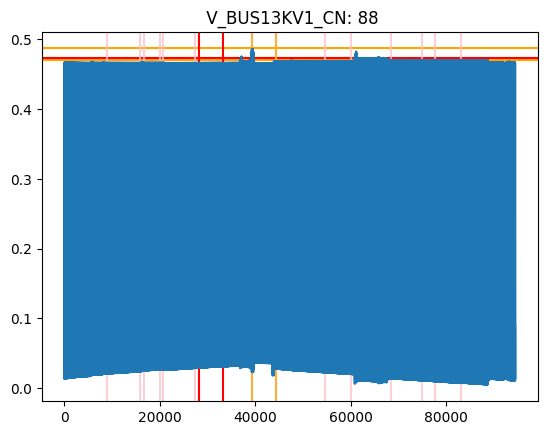

***********************************************************************************************
Sensor: 89  V_BUS13KV1_BN
89
DD = None


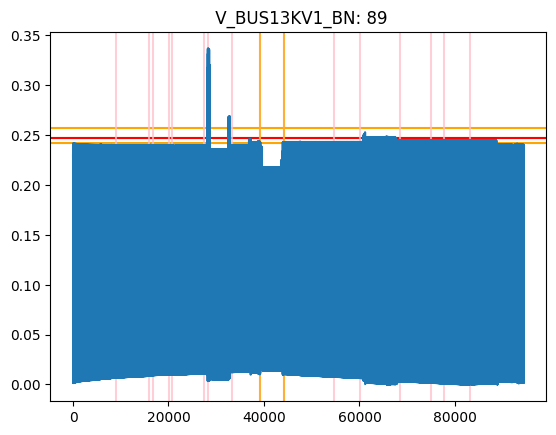

***********************************************************************************************
Sensor: 90  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_A
90
DD = None


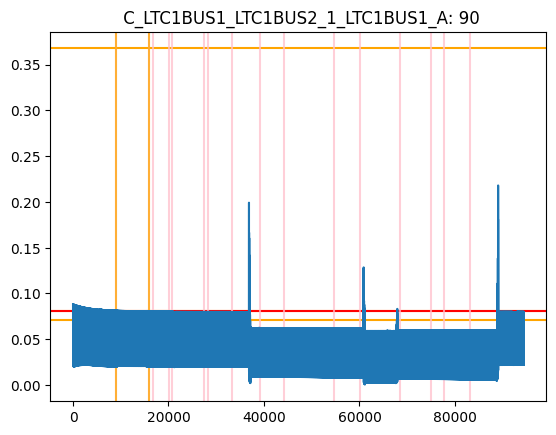

***********************************************************************************************
Sensor: 91  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_B
91
DD = None


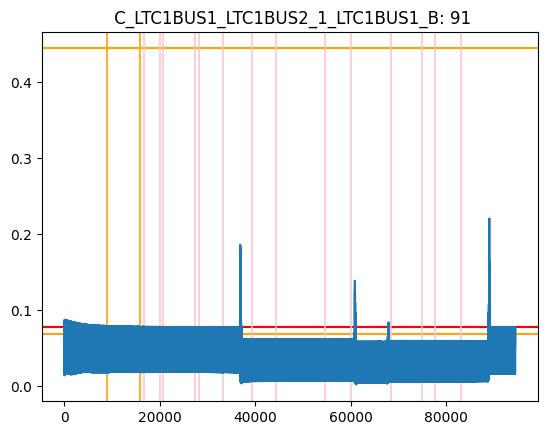

***********************************************************************************************
Sensor: 92  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_C
92
DD = None


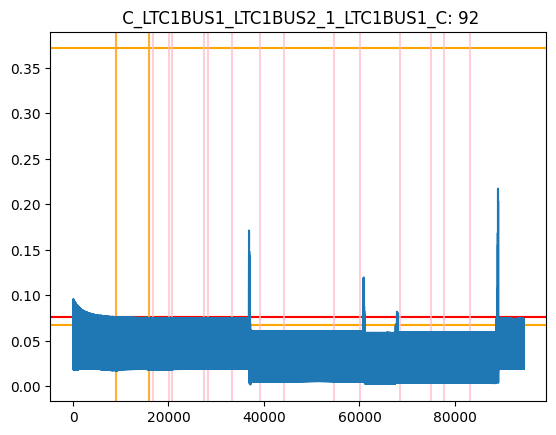

***********************************************************************************************
Sensor: 94  V_BUS13KV2_AN
DD = 31
DD = None
DD = 33


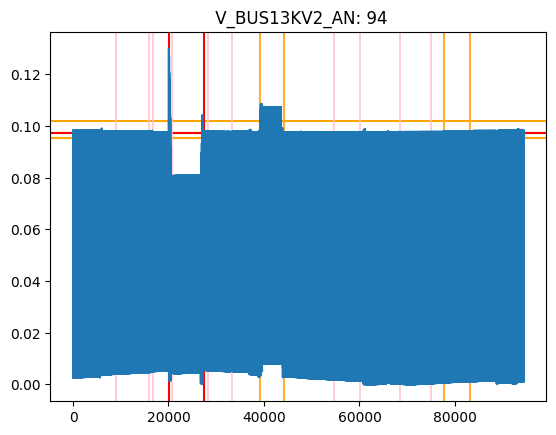

***********************************************************************************************
Sensor: 95  V_BUS13KV2_BN
DD = 18
DD = None
DD = 20


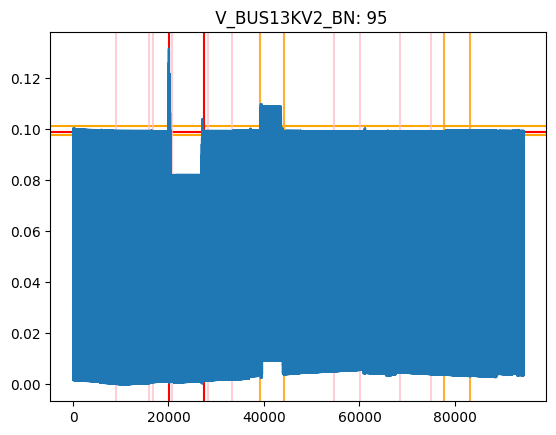

***********************************************************************************************
Sensor: 96  V_BUS13KV2_CN
DD = 4
DD = None
DD = 7


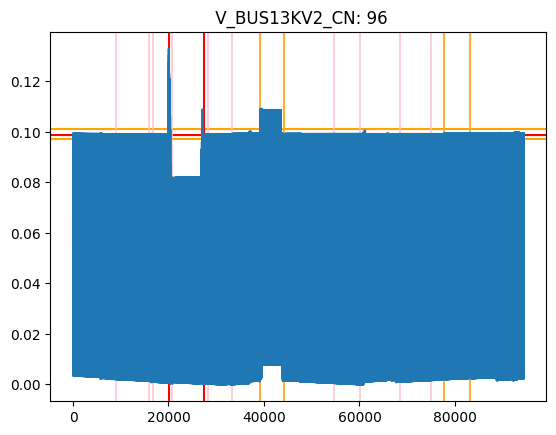

***********************************************************************************************
Sensor: 97  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_A
97
DD = None


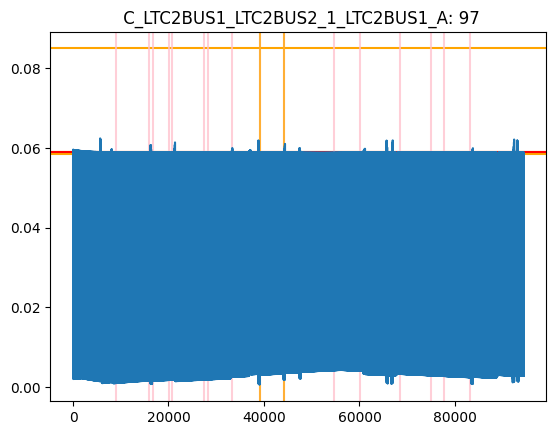

***********************************************************************************************
Sensor: 98  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_B
98
DD = None


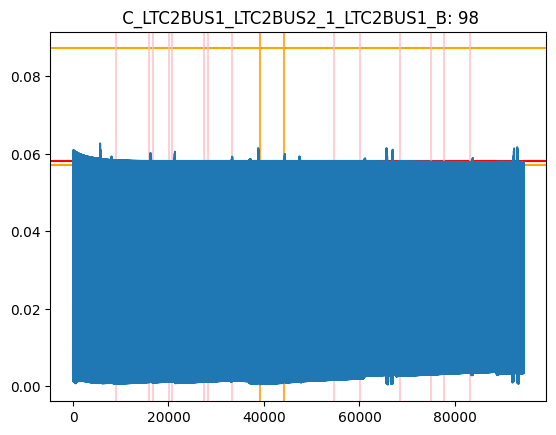

***********************************************************************************************
Sensor: 99  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_C
99
DD = None


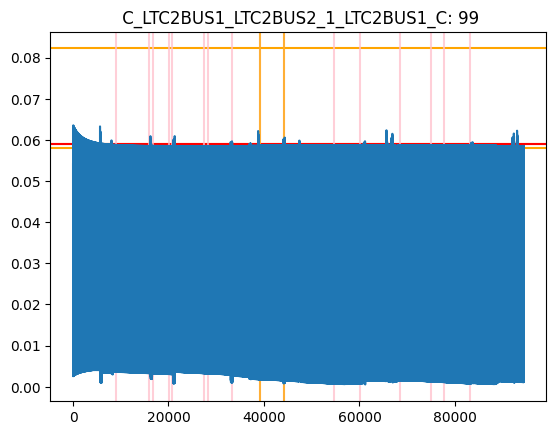

***********************************************************************************************
Sensor: 101  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_A
101
DD = None


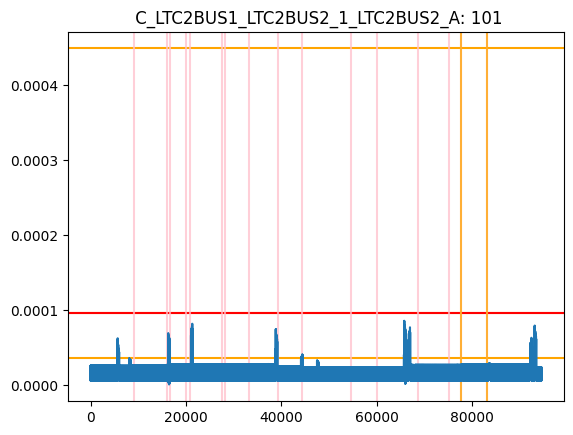

***********************************************************************************************
Sensor: 102  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_B
102
DD = None


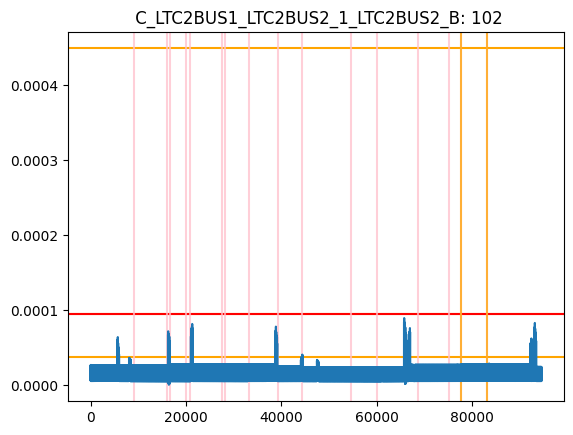

***********************************************************************************************
Sensor: 103  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_C
103
DD = None


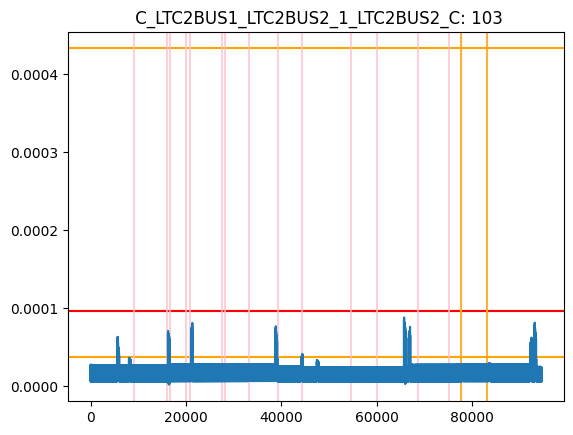

***********************************************************************************************
Sensor: 105  C_SOURCE~C_SUBC~115_1_SOURCE~C_A


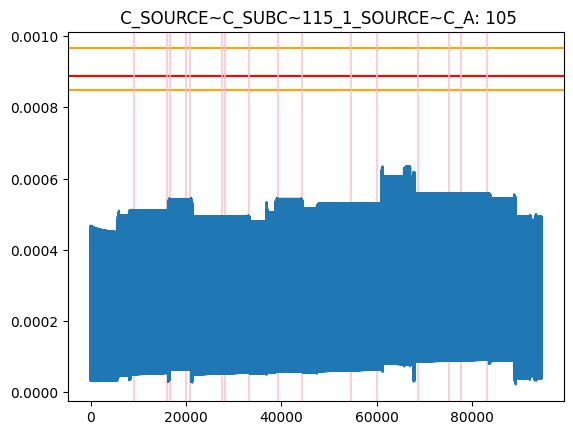

***********************************************************************************************
Sensor: 106  C_SOURCE~C_SUBC~115_1_SOURCE~C_B


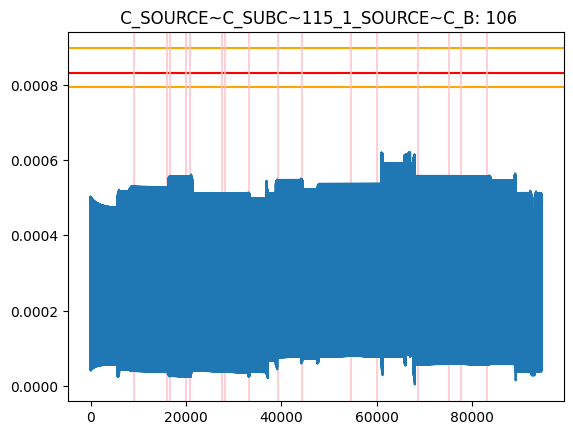

***********************************************************************************************
Sensor: 107  C_SOURCE~C_SUBC~115_1_SOURCE~C_C
107
DD = None


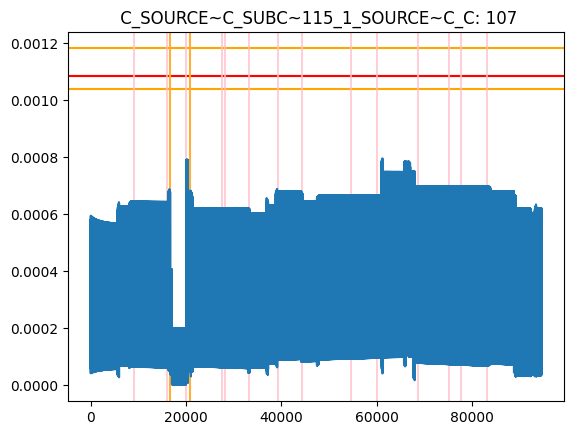

***********************************************************************************************
Sensor: 112  C_SOURCE~A_SUBA~115_1_SOURCE~A_A
112
DD = None


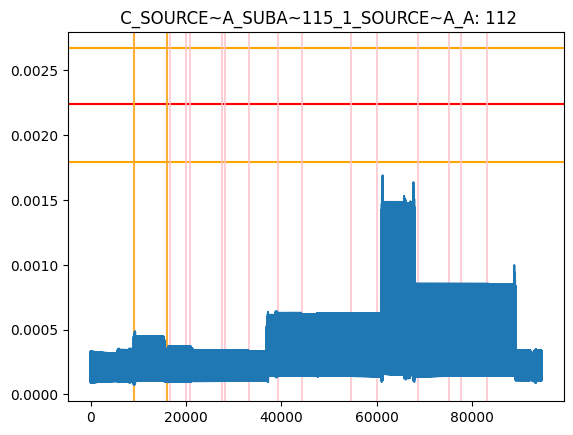

***********************************************************************************************
Sensor: 113  C_SOURCE~A_SUBA~115_1_SOURCE~A_B
113
DD = None


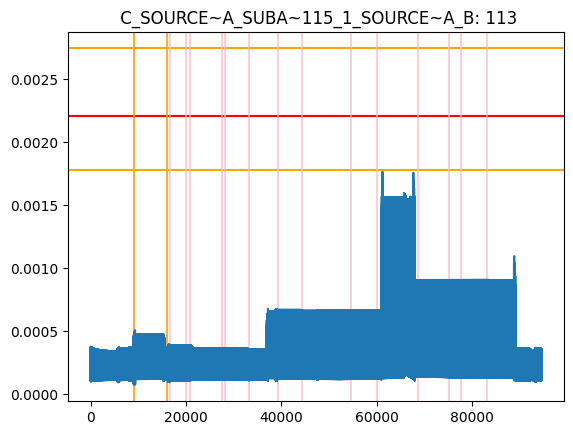

***********************************************************************************************
Sensor: 114  C_SOURCE~A_SUBA~115_1_SOURCE~A_C
114
DD = None


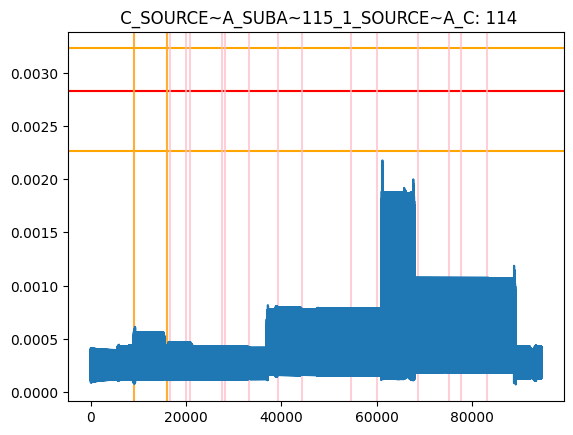

***********************************************************************************************
Sensor: 119  C_SOURCE~BL_SOURCE~B_1_SOURCE~BL_A
119
DD = None


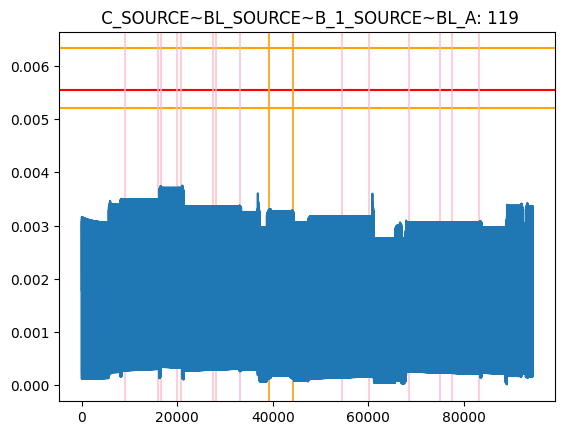

***********************************************************************************************
Sensor: 120  C_SOURCE~BL_SOURCE~B_1_SOURCE~BL_B
120
DD = None


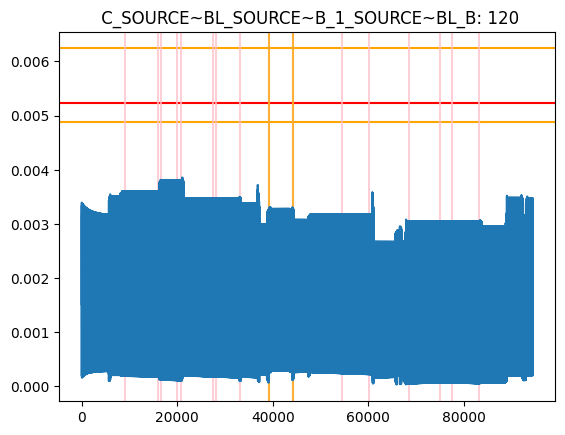

***********************************************************************************************
Sensor: 121  C_SOURCE~BL_SOURCE~B_1_SOURCE~BL_C
121
DD = None


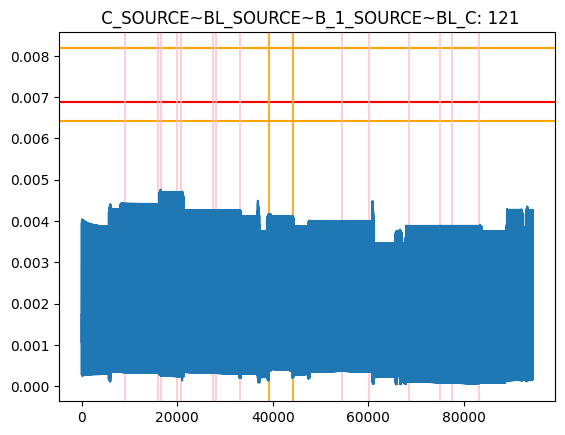

[4, 4, 4, None, None, None, None, 4, 9, 4, None, None, None, 4, 4, 9, 7, 4, 4, 4, 4, 4, None, None, None, None, None, None, None, 4, None, None, None, 4, 7, 4, None, None, None, 3399, 32, 6, 16, 4, None, 9, 4, None, None, None, None, None, None, None, None, None, 3398, 32, 6, 16, 4, None, 9, 4, 103, 6310, 6255, 12, 19, 5, None, 32, 6, 16, 4, None, 9, 4, 33, None, None, None, None, None, None, 31, None, 33, 18, None, 20, 4, None, 7, None, None, None, None, None, None, None, None, None, None, None, None, None]


In [31]:
LD_var = []
at_neighbor = {}

rsum_list = rsum_list_var
threshold = thresholds_var_99
t_list = [thresholds_var, thresholds_var_99, thresholds_var_95]
persistency = 5

for index, i in enumerate(rsum_list):
    print("***********************************************************************************************")
    attack_in = (i > threshold[index]).nonzero()

    violations = (rsum_list > threshold.reshape(-1, 1))

    print(f"Sensor: {things[index]} {cols[things[index]-1]}")
    at_neighbor[things[index]] = attack_in
    plt.title(f"{cols[things[index]-1]}: {things[index]}")

    for t in t_list:
        plt.axhline(t[index], color='orange')

    plt.axhline(threshold[index], color='red')

    if things[index] in attack_dict:
        #if sensor is being attacked

        # ground truth
        attack_indices = df_test.index[
            (df_test['Time'] >= attack_dict[things[index]][0] * 1e6) &
            (df_test['Time'] <= attack_dict[things[index]][1] * 1e6)] - 1201

        for start, end in all_attack_indices:

            # if this is the attack time of the sensor, plot solid red lines
            if attack_indices[0] == start:
                DD = detection_delay(violations[index], [(start, end)], window, w, persistency)[0]
                LD_var.append(DD)
                print(f"DD = {DD}")
                start_w = start-window-w
                end_w = end+window+w-1
                plt.axvline(start_w, color='red')
                plt.axvline(end_w, color='red')

            # otherwise, plot pink lines
            else:
                start_w = start-window-w
                end_w = end+window+w-1
                plt.axvline(start_w, color='pink', alpha=0.75)
                plt.axvline(end_w, color='pink', alpha=0.75)

                start_w = start-window-w
                end_w = end+window+w-1
                for starts, ate in attack_i.items():
                  if starts == start and things[index] in ate:
                    DD = detection_delay(violations[index], [(start, end)], window, w, persistency)[0]
                    LD_var.append(DD)
                    print(f"DD = {DD}")
                    plt.axvline(start_w, color='orange', alpha=0.75)
                    plt.axvline(end_w, color='orange', alpha=0.75)

    else:
         for start, end in all_attack_indices:
            start_w = start-window-w
            end_w = end+window+w-1
            plt.axvline(start_w, color='pink', alpha=0.75)
            plt.axvline(end_w, color='pink', alpha=0.75)
            for starts, ate in attack_i.items():
              if starts == start:
                if things[index] in ate:
                  print(things[index])
                  DD = detection_delay(violations[index], [(start, end)], window, w, persistency)[0]
                  LD_var.append(DD)
                  print(f"DD = {DD}")
                  plt.axvline(start_w, color='orange', alpha=0.75)
                  plt.axvline(end_w, color='orange', alpha=0.75)

    plt.plot(i)
    plt.show()

print(LD_var)

Summary:

In [32]:
n = 0
flr = []
violation = np.logical_or((rsum_list_corr > t_corr[1].reshape(-1, 1)), (rsum_list_var > t_var[1].reshape(-1, 1)))
attack_pred = violation.nonzero()

for i, (start, end) in enumerate(sorted(all_attack_indice)):
    print("***********************************************************************************************")
    print(f'For the {order_attack[n]} attack starting at index: {start} and ending at index: {end}')
    localisation_idx = []
#         print(start, end)
    start_w = start - window - w + 1
    end_w = end + window + w - 1
    # get all indices that are after the start of attack
    indices = np.logical_and((attack_pred[1] >= start_w), (attack_pred[1] <= end_w))
    #         print(idx.sum())
    #         print(attack_pred.shape())
    attack_window = attack_pred[1][indices]
    attack_sensors = attack_pred[0][indices]

    sensor_list = attacks_shifted_index[attack_start_times[i]]
    sensors_attacked = [s+1 for sensor_l in sensor_list for s in sensor_l]

    false_localised_sensors = 0
    false_localised_sensors_list = []

    for sensor in np.unique(attack_sensors):
        if sensor not in sensors_attacked:
            sensor_indices = (attack_sensors == sensor)
            sensor_attack_window = np.sort(attack_window[sensor_indices])

            # check for persistency
            idx = persistency_check(sensor_attack_window, persistency)
            if idx is not None:
                false_localised_sensors += 1
                false_localised_sensors_list.append(sensor)

    print(f'1 Hop: {sensors_attacked}')
    print(f'False Localisations: {false_localised_sensors_list}')

    flr.append(false_localised_sensors/len(sensors_attacked))
    n += 1
flr

***********************************************************************************************
For the CT attack starting at index: 9360 and ending at index: 15599
1 Hop: [52, 91, 61, 49, 76, 53, 92, 62, 50, 77, 54, 93, 63, 51, 78]
False Localisations: [4, 22, 60]
***********************************************************************************************
For the Cphase attack starting at index: 17040 and ending at index: 20399
1 Hop: [45, 90, 66, 57]
False Localisations: [3, 4, 5, 9, 10, 11, 15, 16, 17, 21, 22, 23, 44, 46, 47, 56, 58, 59, 65, 67, 68, 78, 79, 80, 89]
***********************************************************************************************
For the PT attack starting at index: 20400 and ending at index: 27119
1 Hop: [79, 67, 58, 46, 4, 10, 16, 22, 80, 68, 59, 47, 5, 11, 17, 23, 81, 69, 60, 48, 6, 12, 18, 24]
False Localisations: [3, 9, 15, 21, 44, 45, 51, 52, 53, 56, 57, 61, 65, 66, 78, 89]
***********************************************************************

[0.2,
 6.25,
 0.6666666666666666,
 3.5,
 0.6333333333333333,
 0.7777777777777778,
 2.3333333333333335,
 0.5555555555555556]

In [33]:
np.mean(flr), np.std(flr)

(1.8645833333333335, 1.9603160520486875)

In [34]:
np.mean(df_test['Time'][df_test['Time'] > 0.25e6].diff())

208.3319937132791